In [2]:
import os
import warnings
warnings.simplefilter(action = 'ignore', category=FutureWarning)
warnings.filterwarnings('ignore')
def ignore_warn(*args, **kwargs):
    pass

warnings.warn = ignore_warn #ignore annoying warning (from sklearn and seaborn)

import numpy as np
import pandas as pd
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) #Limiting floats output to 3 decimal points
from matplotlib import pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style="ticks", color_codes=True, font_scale=1.5)
color = sns.color_palette()
sns.set_style('darkgrid')
import mpl_toolkits
from mpl_toolkits.mplot3d import Axes3D
import pylab 

from scipy import stats
from scipy.stats import skew, norm, probplot, boxcox
from scipy.special import boxcox1p
from patsy import dmatrices
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import RobustScaler, PolynomialFeatures, StandardScaler, LabelEncoder
from sklearn.feature_selection import f_regression, mutual_info_regression, SelectKBest, RFECV, SelectFromModel
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs
from sklearn.feature_extraction import FeatureHasher
from sklearn.decomposition import PCA, KernelPCA
from sklearn.base import BaseEstimator, TransformerMixin, RegressorMixin, clone
from sklearn.kernel_ridge import KernelRidge
from sklearn.linear_model import LinearRegression, OrthogonalMatchingPursuit, Lasso, LassoLarsIC, ElasticNet, ElasticNetCV
from sklearn.linear_model import SGDRegressor, PassiveAggressiveRegressor, HuberRegressor, BayesianRidge
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor, BaggingRegressor, ExtraTreesRegressor
import xgboost as xgb
from xgboost import XGBRegressor, plot_importance
import lightgbm as lgb

from sklearn.model_selection import GridSearchCV, cross_val_score, KFold, cross_val_predict, train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [3]:
#Load Dataset
train = pd.read_csv('dataset/train.csv')
test = pd.read_csv('dataset/test.csv')

#Save the 'Id' column
train_ID = train['Id']
test_ID = test['Id']

#Now drop the  'Id' colum since it's unnecessary for the prediction process.
train.drop("Id", axis = 1, inplace = True)
test.drop("Id", axis = 1, inplace = True)

train.rename(columns={'3SsnPorch':'TSsnPorch'}, inplace=True)
test.rename(columns={'3SsnPorch':'TSsnPorch'}, inplace=True)

test['SalePrice'] = 0

train.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.000,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,20,RL,80.000,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,60,RL,68.000,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,70,RL,60.000,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,60,RL,84.000,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [4]:
def rstr(df, pred=None): 
    obs = df.shape[0]
    types = df.dtypes
    counts = df.apply(lambda x: x.count())
    uniques = df.apply(lambda x: [x.unique()])
    nulls = df.apply(lambda x: x.isnull().sum())
    distincts = df.apply(lambda x: x.unique().shape[0])
    missing_ration = (df.isnull().sum()/ obs) * 100
    skewness = df.skew()
    kurtosis = df.kurt() 
    print('Data shape:', df.shape)
    
    if pred is None:
        cols = ['types', 'counts', 'distincts', 'nulls', 'missing ration', 'uniques', 'skewness', 'kurtosis']
        str = pd.concat([types, counts, distincts, nulls, missing_ration, uniques, skewness, kurtosis], axis = 1)
    else:
        corr = df.corr()[pred]
        str = pd.concat([types, counts, distincts, nulls, missing_ration, uniques, skewness, kurtosis, corr], axis = 1)
        corr_col = 'corr '  + pred
        cols = ['types', 'counts', 'distincts', 'nulls', 'missing_ration', 'uniques', 'skewness', 'kurtosis', corr_col ]
    
    str.columns = cols
    dtypes = str.types.value_counts()
    print('___________________________\nData types:\n',str.types.value_counts())
    print('___________________________')
    return str

In [5]:
details = rstr(train, 'SalePrice')
display(details.sort_values(by='corr SalePrice', ascending=False))

Data shape: (1460, 80)
___________________________
Data types:
 object     43
int64      34
float64     3
Name: types, dtype: int64
___________________________


,types,counts,distincts,nulls,missing_ration,uniques,skewness,kurtosis,corr SalePrice
SalePrice,int64,1460,663,0,0.000,"[[208500, 181500, 223500, 140000, 250000, 1430...",1.883,6.536,1.000
OverallQual,int64,1460,10,0,0.000,"[[7, 6, 8, 5, 9, 4, 10, 3, 1, 2]]",0.217,0.096,0.791
GrLivArea,int64,1460,861,0,0.000,"[[1710, 1262, 1786, 1717, 2198, 1362, 1694, 20...",1.367,4.895,0.709
GarageCars,int64,1460,5,0,0.000,"[[2, 3, 1, 0, 4]]",-0.343,0.221,0.640
GarageArea,int64,1460,441,0,0.000,"[[548, 460, 608, 642, 836, 480, 636, 484, 468,...",0.180,0.917,0.623
TotalBsmtSF,int64,1460,721,0,0.000,"[[856, 1262, 920, 756, 1145, 796, 1686, 1107, ...",1.524,13.250,0.614
1stFlrSF,int64,1460,753,0,0.000,"[[856, 1262, 920, 961, 1145, 796, 1694, 1107, ...",1.377,5.746,0.606
FullBath,int64,1460,4,0,0.000,"[[2, 1, 3, 0]]",0.037,-0.857,0.561
TotRmsAbvGrd,int64,1460,12,0,0.000,"[[8, 6, 7, 9, 5, 11, 4, 10, 12, 3, 2, 14]]",0.676,0.881,0.534
YearBuilt,int64,1460,112,0,0.000,"[[2003, 1976, 2001, 1915, 2000, 1993, 2004, 19...",-0.613,-0.440,0.523


Nulls: The data have 19 features with nulls, five of then area categorical and with more then 47% of missing ration. 
They are candidates to drop or use them to create another more interesting feature:
- PoolQC
- MiscFeature
- Alley
- Fence
- FireplaceQu

Features high skewed right, heavy-tailed distribution, and with high correlation to Sales Price. It is important to treat them (boxcox 1p transformation, Robustscaler, and drop some outliers):
- TotalBsmtSF
- 1stFlrSF
- GrLivArea

Features skewed, heavy-tailed distribution, and with good correlation to Sales Price. It is important to treat them (boxcox 1p transformation, Robustscaler, and drop some outliers):
- LotArea
- KitchenAbvGr
- ScreenPorch
- EnclosedPorch
- MasVnrArea
- OpenPorchSF
- LotFrontage
- BsmtFinSF1
- WoodDeckSF
- MSSubClass

Features high skewed, heavy-tailed distribution, and with low correlation to Sales Price. Maybe we can drop these features, or just use they with other to create a new more importants feature:
- MiscVal
- TSsnPorch
- LowQualFinSF
- BsmtFinSF2
- BsmtHalfBa
    
Features low skewed, and with good to low correlation to Sales Price. Just use a Robustscaler probably reduce the few  distorcions:
- BsmtUnfSF
- 2ndFlrSF
- TotRmsAbvGrd
- HalfBath
- Fireplaces
- BsmtFullBath
- OverallQual
- BedroomAbvGr
- GarageArea
- FullBath
- GarageCars
- OverallCond

Transforme from Yaer Feature to Age, 2011 - Year feature, or YEAR(TODAY()) - Year Feature
- YearRemodAdd: 
- YearBuilt
- GarageYrBlt
- YrSold

If we apply this data to a Keras, first we need to chnage the float64 and Int64 to float32 and Int32!

In [6]:
display(train.describe().transpose())

,count,mean,std,min,25%,50%,75%,max
MSSubClass,1460.000,56.897,42.301,20.000,20.000,50.000,70.000,190.000
LotFrontage,1201.000,70.050,24.285,21.000,59.000,69.000,80.000,313.000
LotArea,1460.000,10516.828,9981.265,1300.000,7553.500,9478.500,11601.500,215245.000
OverallQual,1460.000,6.099,1.383,1.000,5.000,6.000,7.000,10.000
OverallCond,1460.000,5.575,1.113,1.000,5.000,5.000,6.000,9.000
YearBuilt,1460.000,1971.268,30.203,1872.000,1954.000,1973.000,2000.000,2010.000
YearRemodAdd,1460.000,1984.866,20.645,1950.000,1967.000,1994.000,2004.000,2010.000
MasVnrArea,1452.000,103.685,181.066,0.000,0.000,0.000,166.000,1600.000
BsmtFinSF1,1460.000,443.640,456.098,0.000,0.000,383.500,712.250,5644.000
BsmtFinSF2,1460.000,46.549,161.319,0.000,0.000,0.000,0.000,1474.000


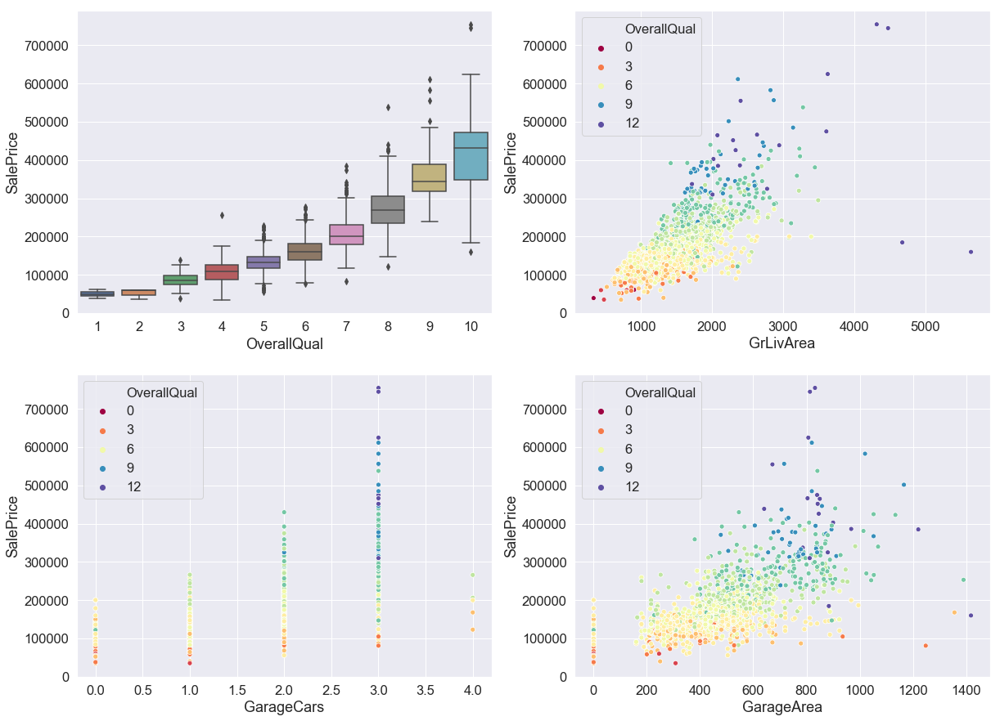

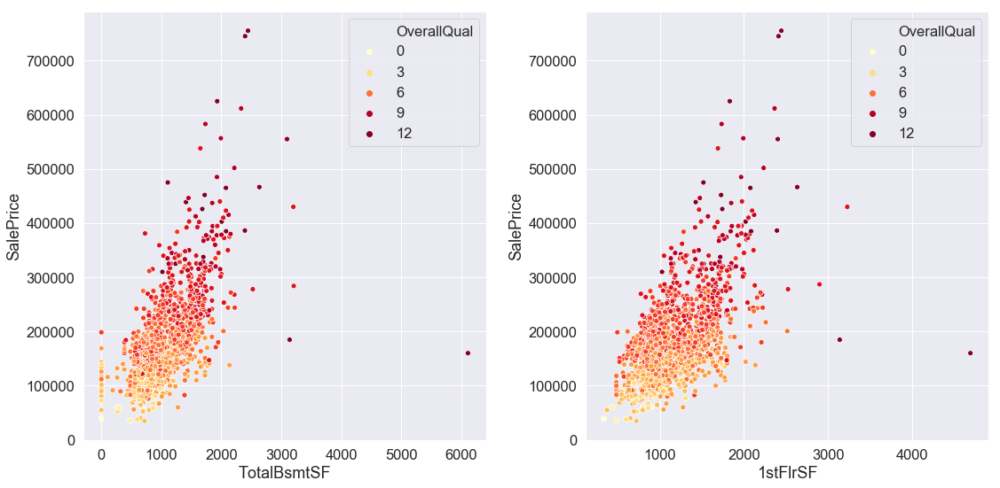

In [7]:
fig = plt.figure(figsize=(20, 15))
sns.set(font_scale=1.5)

# (Corr= 0.817185) Box plot overallqual/salePrice
fig1 = fig.add_subplot(221); sns.boxplot(x='OverallQual', y='SalePrice', data=train[['SalePrice', 'OverallQual']])

# (Corr= 0.700927) GrLivArea vs SalePrice plot
fig2 = fig.add_subplot(222); 
sns.scatterplot(x = train.GrLivArea, y = train.SalePrice, hue=train.OverallQual, palette= 'Spectral')

# (Corr= 0.680625) GarageCars vs SalePrice plot
fig3 = fig.add_subplot(223); 
sns.scatterplot(x = train.GarageCars, y = train.SalePrice, hue=train.OverallQual, palette= 'Spectral')

# (Corr= 0.650888) GarageArea vs SalePrice plot
fig4 = fig.add_subplot(224); 
sns.scatterplot(x = train.GarageArea, y = train.SalePrice, hue=train.OverallQual, palette= 'Spectral')

fig5 = plt.figure(figsize=(16, 8))
fig6 = fig5.add_subplot(121); 
sns.scatterplot(y = train.SalePrice , x = train.TotalBsmtSF, hue=train.OverallQual, palette= 'YlOrRd')

fig7 = fig5.add_subplot(122); 
sns.scatterplot(y = train.SalePrice, x = train['1stFlrSF'], hue=train.OverallQual, palette= 'YlOrRd')

plt.tight_layout(); plt.show()

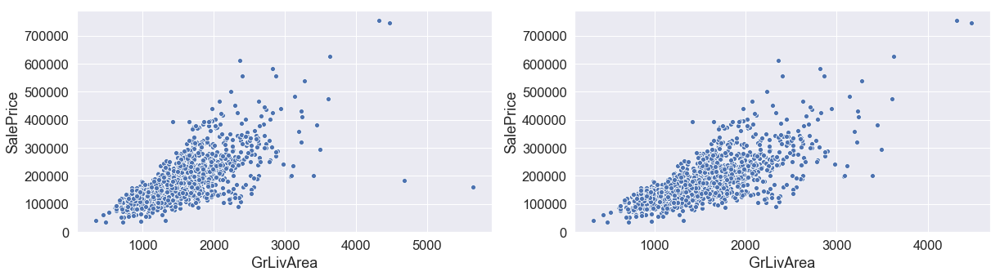

In [8]:
fig = plt.figure(figsize=(20,5))
ax = fig.add_subplot(121)
sns.scatterplot(x = train.GrLivArea, y = train.SalePrice, ax = ax)

#Deleting outliers
train = train.drop(train[(train.GrLivArea>4000) & (train.SalePrice<300000)].index)

#Check the graphic again
ax = fig.add_subplot(122)
sns.scatterplot(x =train.GrLivArea, y = train.SalePrice, ax = ax)
plt.show()

                                                                  Outliers: 1


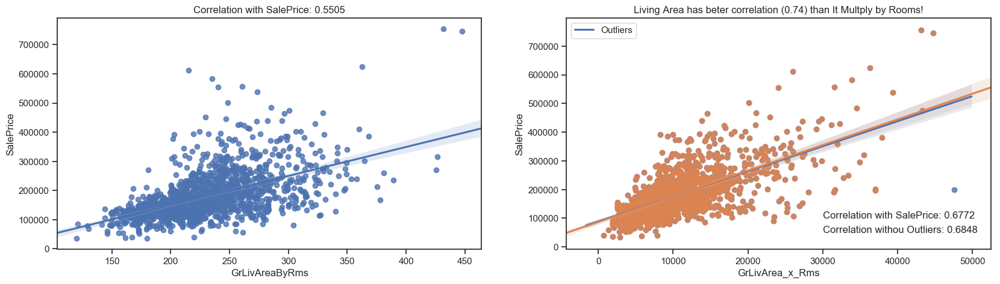

In [9]:
sns.reset_defaults()
sns.set(style="ticks", color_codes=True)

df = train[['SalePrice', 'GrLivArea', 'TotRmsAbvGrd']]
df['GrLivAreaByRms'] = train.GrLivArea/train.TotRmsAbvGrd
df['GrLivArea_x_Rms'] = train.GrLivArea*train.TotRmsAbvGrd
fig = plt.figure(figsize=(20,5))
fig1 = fig.add_subplot(121); sns.regplot(x='GrLivAreaByRms', y='SalePrice', data=df);
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.GrLivAreaByRms.corr(df['SalePrice'])))
fig2 = fig.add_subplot(122); sns.regplot(x='GrLivArea_x_Rms', y='SalePrice', data=df); plt.legend(['Outliers'])
plt.text(x=30000, y=100000, s='Correlation with SalePrice: {:1.4f}'.format(df.GrLivArea_x_Rms.corr(df['SalePrice'])))

print('                                                                  Outliers:',(df.GrLivArea_x_Rms>=45000).sum())
df = df.loc[df.GrLivArea_x_Rms<45000]
sns.regplot(x='GrLivArea_x_Rms', y='SalePrice', data=df); 
plt.title('Living Area has beter correlation ({:1.2f}) than It Multply by Rooms!'.format(df.GrLivArea.corr(df.SalePrice)))
plt.text(x=30000, y=50000, s='Correlation withou Outliers: {:1.4f}'.format(df.GrLivArea_x_Rms.corr(df['SalePrice'])))
plt.show()
del df

In [10]:
train = train[train.GrLivArea * train.TotRmsAbvGrd < 45000]
print('Train observations after remove outliers:',train.shape[0])

Train observations after remove outliers: 1457


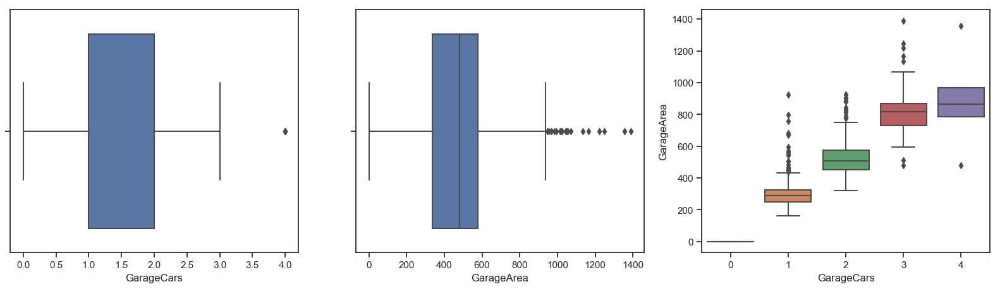

In [11]:
fig = plt.figure(figsize=(20,5))
fig1 = fig.add_subplot(131); sns.boxplot(train.GarageCars)
fig2 = fig.add_subplot(132); sns.boxplot(train.GarageArea)
fig3 = fig.add_subplot(133); sns.boxplot(train.GarageCars, train.GarageArea)
plt.show()

                                                                 Outliers: 4


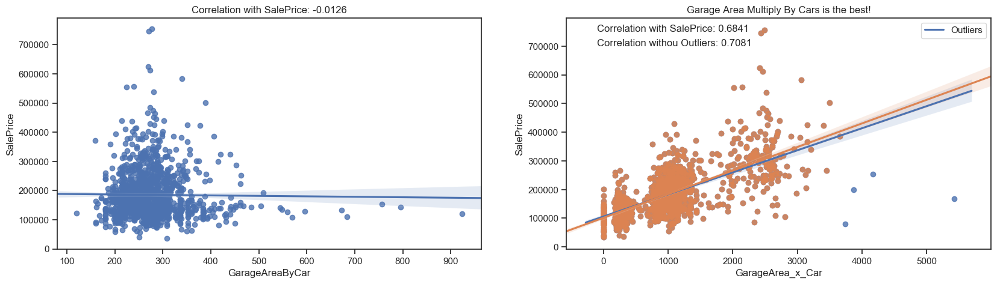

In [12]:
df = train[['SalePrice', 'GarageArea', 'GarageCars']]
df['GarageAreaByCar'] = train.GarageArea/train.GarageCars
df['GarageArea_x_Car'] = train.GarageArea*train.GarageCars

fig = plt.figure(figsize=(20,5))
fig1 = fig.add_subplot(121); sns.regplot(x='GarageAreaByCar', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.GarageAreaByCar.corr(df['SalePrice'])))

fig2 = fig.add_subplot(122); sns.regplot(x='GarageArea_x_Car', y='SalePrice', data=df); plt.legend(['Outliers'])
plt.text(x=-100, y=750000, s='Correlation with SalePrice: {:6.4f}'.format(df.GarageArea_x_Car.corr(df['SalePrice'])))
print('                                                                 Outliers:',(df.GarageArea_x_Car>=3700).sum())
df = df.loc[df.GarageArea_x_Car<3700]
sns.regplot(x='GarageArea_x_Car', y='SalePrice', data=df); plt.title('Garage Area Multiply By Cars is the best!')
plt.text(x=-100, y=700000, s='Correlation withou Outliers: {:6.4f}'.format(df.GarageArea_x_Car.corr(df['SalePrice'])))
plt.show()
del df

In [13]:
train = train[train.GarageArea * train.GarageCars < 3700]
print('Total observatiosn after outliers cut:', train.shape[0])

Total observatiosn after outliers cut: 1453


                                                             Outliers: 1


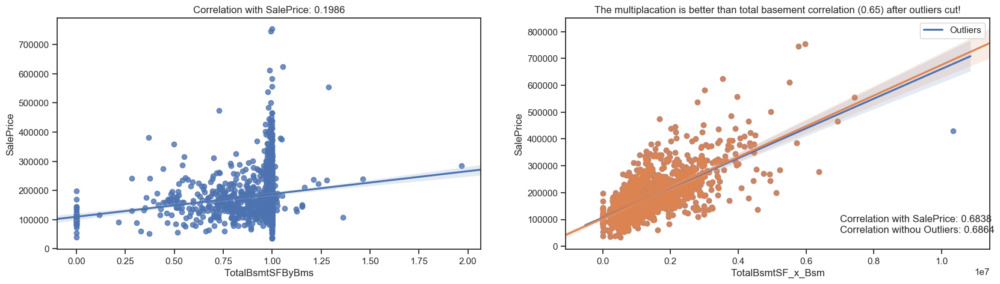

In [14]:
df = train[['SalePrice', 'TotalBsmtSF', '1stFlrSF']]
df['TotalBsmtSFByBms'] = train.TotalBsmtSF/train['1stFlrSF']
df['TotalBsmtSF_x_Bsm'] = train.TotalBsmtSF*train['1stFlrSF']
fig = plt.figure(figsize=(20,5))
fig1 = fig.add_subplot(121); sns.regplot(x='TotalBsmtSFByBms', y='SalePrice', data=df);
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.TotalBsmtSFByBms.corr(df['SalePrice'])))
fig2 = fig.add_subplot(122); sns.regplot(x='TotalBsmtSF_x_Bsm', y='SalePrice', data=df); plt.legend(['Outliers'])
plt.text(x=7e06, y=90000, s='Correlation with SalePrice: {:1.4f}'.format(df.TotalBsmtSF_x_Bsm.corr(df['SalePrice'])))

print('                                                             Outliers:',(df.TotalBsmtSF_x_Bsm>=0.9e07).sum())
df = df.loc[df.TotalBsmtSF_x_Bsm<0.9e07]
sns.regplot(x='TotalBsmtSF_x_Bsm', y='SalePrice', data=df); 
plt.title('The multiplacation is better than total basement correlation ({:1.2f}) after outliers cut!'.format(df.TotalBsmtSF.corr(df.SalePrice)))
plt.text(x=7e06, y=50000, s='Correlation withou Outliers: {:1.4f}'.format(df.TotalBsmtSF_x_Bsm.corr(df['SalePrice'])))
plt.show()
del df

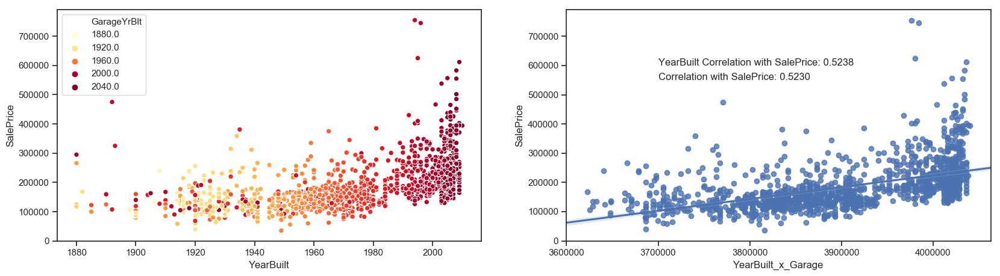

In [15]:
df = train[['SalePrice', 'YearBuilt', 'GarageYrBlt']]
df['YearBuilt_x_Garage'] = train.YearBuilt*train.GarageYrBlt
df['Garage_Newest'] = train.YearBuilt < train.GarageYrBlt

fig = plt.figure(figsize=(20,5))
fig1 = fig.add_subplot(121); sns.scatterplot(y = df.SalePrice, x = df.YearBuilt, hue=df.GarageYrBlt, palette= 'YlOrRd')
fig2 = fig.add_subplot(122); sns.regplot(x='YearBuilt_x_Garage', y='SalePrice', data=df); 
plt.text(x=3700000, y=600000, s='YearBuilt Correlation with SalePrice: {:1.4f}'.format(df.YearBuilt.corr(df['SalePrice'])))
plt.text(x=3700000, y=550000, s='Correlation with SalePrice: {:1.4f}'.format(df.YearBuilt_x_Garage.corr(df['SalePrice'])))
plt.show()

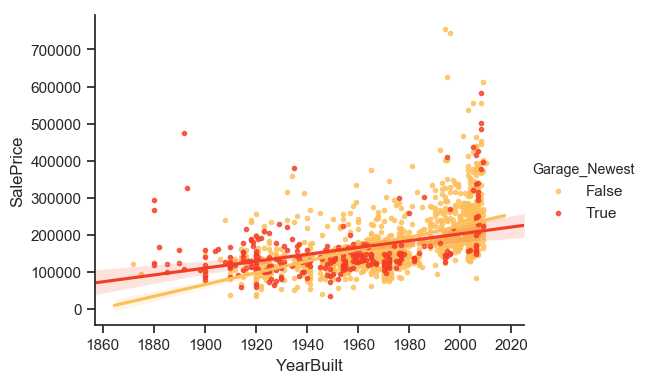

In [16]:
sns.lmplot(y = 'SalePrice', x = 'YearBuilt', data=df, markers='.', 
           aspect=1.4, height=4, hue= 'Garage_Newest', palette= 'YlOrRd')
plt.show();  
del df

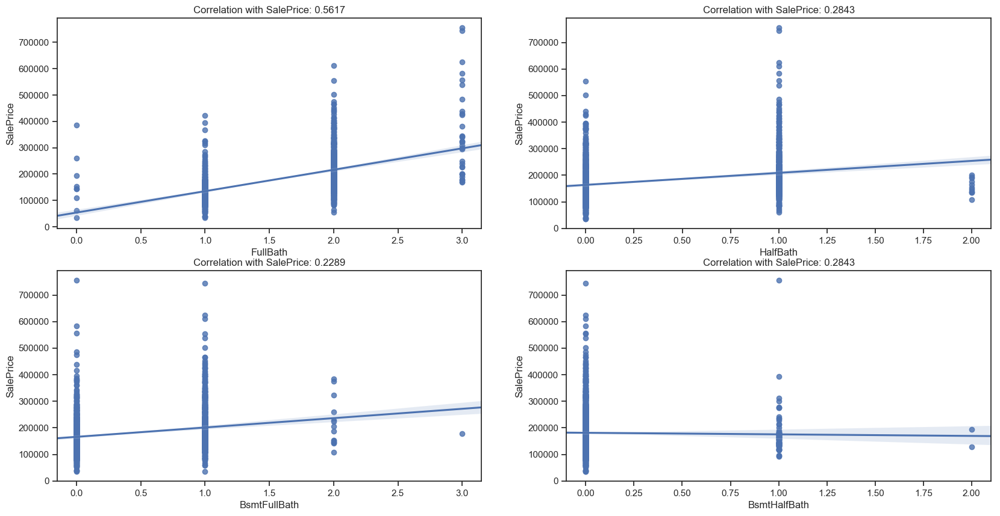

In [17]:
fig = plt.figure(figsize=(20,10))
fig1 = fig.add_subplot(221); sns.regplot(x='FullBath', y='SalePrice', data=train)
plt.title('Correlation with SalePrice: {:6.4f}'.format(train.FullBath.corr(train['SalePrice'])))

fig2 = fig.add_subplot(222); sns.regplot(x='HalfBath', y='SalePrice', data=train);
plt.title('Correlation with SalePrice: {:6.4f}'.format(train.HalfBath.corr(train['SalePrice'])))

fig3 = fig.add_subplot(223); sns.regplot(x='BsmtFullBath', y='SalePrice', data=train)
plt.title('Correlation with SalePrice: {:6.4f}'.format(train.BsmtFullBath.corr(train['SalePrice'])))

fig4 = fig.add_subplot(224); sns.regplot(x='BsmtHalfBath', y='SalePrice', data=train);
plt.title('Correlation with SalePrice: {:6.4f}'.format(train.HalfBath.corr(train['SalePrice'])))

plt.show()

In [18]:
df = train[['SalePrice', 'FullBath', 'HalfBath', 'BsmtFullBath', 'BsmtHalfBath']]
df['TotBathrooms'] = df.FullBath + (df.HalfBath*0.5) + df.BsmtFullBath + (df.BsmtHalfBath*0.5)

                                                                 Outliers: 2


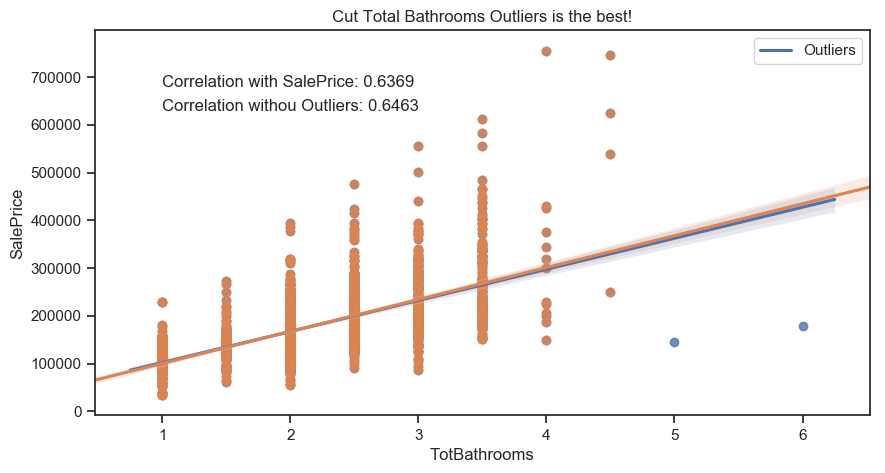

In [19]:
fig = plt.figure(figsize=(10,5))
sns.regplot(x='TotBathrooms', y='SalePrice', data=df); plt.legend(['Outliers'])
plt.text(x=1, y=680000, s='Correlation with SalePrice: {:6.4f}'.format(df.TotBathrooms.corr(df['SalePrice'])))
print('                                                                 Outliers:',(df.TotBathrooms>=5).sum())
df = df.loc[df.TotBathrooms<5]
sns.regplot(x='TotBathrooms', y='SalePrice', data=df); plt.title('Cut Total Bathrooms Outliers is the best!')
plt.text(x=1, y=630000, s='Correlation withou Outliers: {:6.4f}'.format(df.TotBathrooms.corr(df['SalePrice'])))
plt.show()

In [20]:
train = train[(train.FullBath + (train.HalfBath*0.5) + train.BsmtFullBath + (train.BsmtHalfBath*0.5))<5]
print('Data observations after outliers deletion:', train.shape[0])

Data observations after outliers deletion: 1451


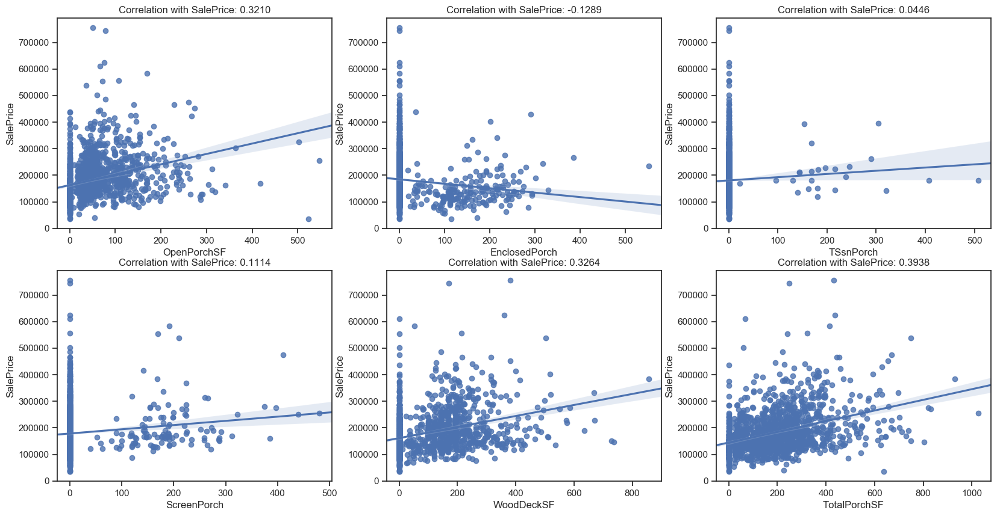

In [21]:
def PorchPlots():
    fig = plt.figure(figsize=(20,10))
    fig1 = fig.add_subplot(231); sns.regplot(x='OpenPorchSF', y='SalePrice', data=df)
    plt.title('Correlation with SalePrice: {:6.4f}'.format(df.OpenPorchSF.corr(df['SalePrice'])))

    fig2 = fig.add_subplot(232); sns.regplot(x='EnclosedPorch', y='SalePrice', data=df);
    plt.title('Correlation with SalePrice: {:6.4f}'.format(df.EnclosedPorch.corr(df['SalePrice'])))

    fig3 = fig.add_subplot(233); sns.regplot(x='TSsnPorch', y='SalePrice', data=df)
    plt.title('Correlation with SalePrice: {:6.4f}'.format(df.TSsnPorch.corr(df['SalePrice'])))

    fig4 = fig.add_subplot(234); sns.regplot(x='ScreenPorch', y='SalePrice', data=df);
    plt.title('Correlation with SalePrice: {:6.4f}'.format(df.ScreenPorch.corr(df['SalePrice'])))

    fig5 = fig.add_subplot(235); sns.regplot(x='WoodDeckSF', y='SalePrice', data=df);
    plt.title('Correlation with SalePrice: {:6.4f}'.format(df.WoodDeckSF.corr(df['SalePrice'])))

    fig6 = fig.add_subplot(236); sns.regplot(x='TotalPorchSF', y='SalePrice', data=df);
    plt.title('Correlation with SalePrice: {:6.4f}'.format(df.TotalPorchSF.corr(df['SalePrice'])))

    plt.show()

df = train[['SalePrice', 'OpenPorchSF', 'EnclosedPorch', 'TSsnPorch', 'ScreenPorch', 'WoodDeckSF']]
df['TotalPorchSF'] = df.OpenPorchSF + df.EnclosedPorch + df.TSsnPorch + df.ScreenPorch + df.WoodDeckSF
#df = df[df.TotalPorchSF<=600] # A possible outlier cut!
PorchPlots()

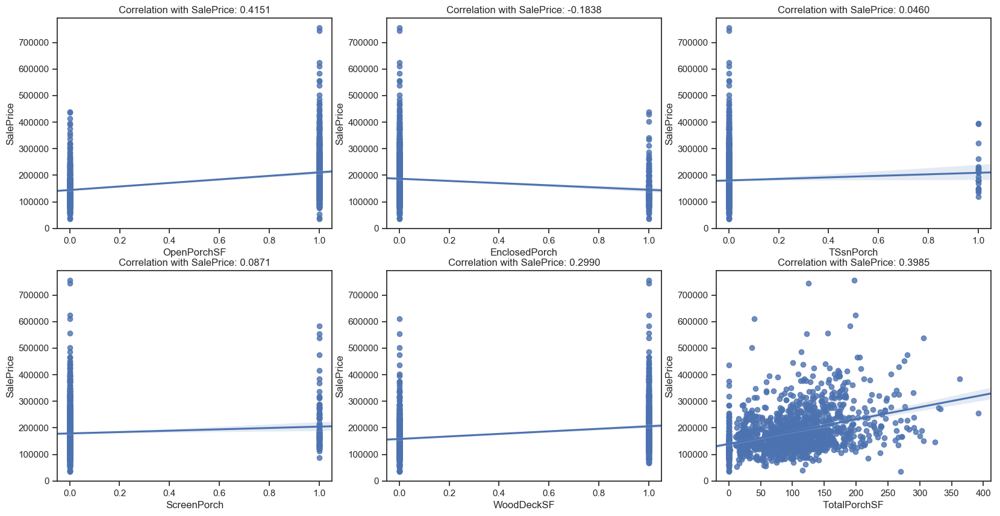

In [22]:
df.OpenPorchSF = df.OpenPorchSF > 0
df.EnclosedPorch =  df.EnclosedPorch > 0
df.TSsnPorch = df.TSsnPorch > 0
df.ScreenPorch = df.ScreenPorch > 0
df.WoodDeckSF = df.WoodDeckSF > 0
df.TotalPorchSF = np.sqrt(df.TotalPorchSF) * (np.log1p(np.sqrt(df.TotalPorchSF))**2)

PorchPlots()

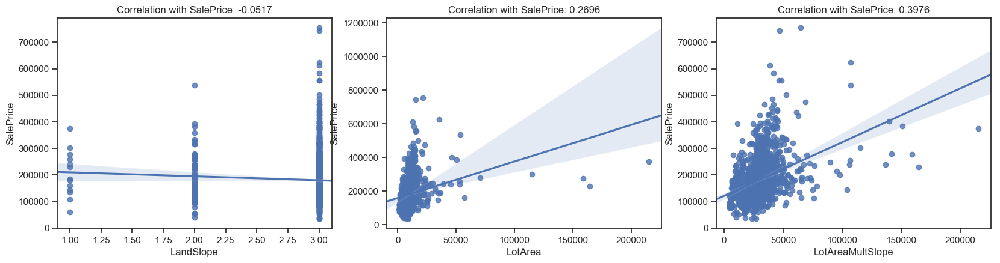

In [23]:
# LandSlope: Slope of property
LandSlope = {}
LandSlope['Gtl'] = 3 #'Gentle slope'
LandSlope['Mod'] = 2 #'Moderate Slope'
LandSlope['Sev'] = 1 #'Severe Slope'

df = train[['SalePrice', 'LandSlope', 'LotArea']]
df.LandSlope = df.LandSlope.map(LandSlope)
df['LotAreaMultSlope'] = (df.LotArea * df.LandSlope)

fig = plt.figure(figsize=(20,10))
fig1 = fig.add_subplot(231); sns.regplot(x='LandSlope', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.LandSlope.corr(df['SalePrice'])))

fig2 = fig.add_subplot(232); sns.regplot(x='LotArea', y='SalePrice', data=df);
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.LotArea.corr(df['SalePrice'])))

fig3 = fig.add_subplot(233); sns.regplot(x='LotAreaMultSlope', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.LotAreaMultSlope.corr(df['SalePrice'])))
plt.show()

     SalePrice  LandSlope  LotArea  LotAreaMultSlope
249     277000          1   159000            159000
313     375000          1   215245            215245
335     228950          1   164660            164660


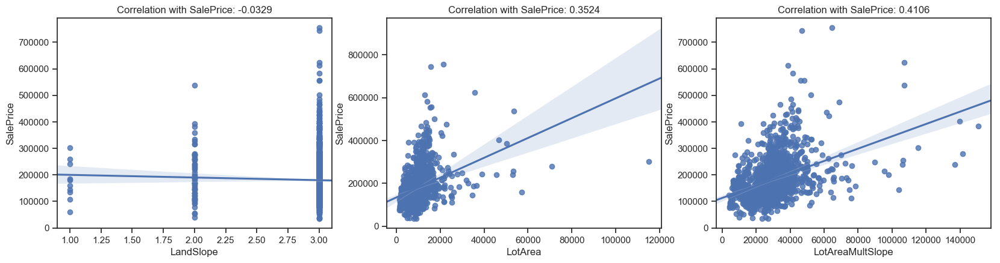

In [24]:
print(df[df.LotArea>155000])
df = df[df.LotArea<155000]
fig = plt.figure(figsize=(20,10))
fig1 = fig.add_subplot(234); sns.regplot(x='LandSlope', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.LandSlope.corr(df['SalePrice'])))

fig2 = fig.add_subplot(235); sns.regplot(x='LotArea', y='SalePrice', data=df);
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.LotArea.corr(df['SalePrice'])))

fig3 = fig.add_subplot(236); sns.regplot(x='LotAreaMultSlope', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.LotAreaMultSlope.corr(df['SalePrice'])))
plt.show()

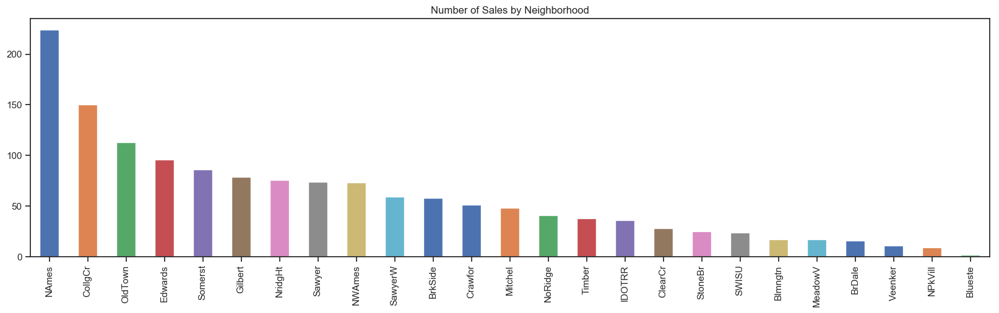

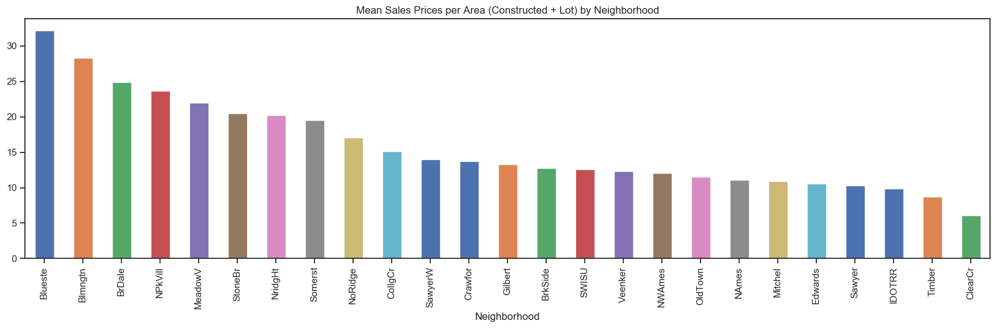

In [25]:
figa = plt.figure(figsize=(20, 5))
g = train.Neighborhood.value_counts().plot(kind='bar', title='Number of Sales by Neighborhood')

figb = plt.figure(figsize=(20, 5))
plt.tight_layout()
df = train[['SalePrice', 'YrSold', 'Neighborhood']]

df['TotalArea'] = (train.TotalBsmtSF.fillna(0) + train.WoodDeckSF.fillna(0) + train.GrLivArea.fillna(0) + 
                   train.LotArea.fillna(0) + train.MasVnrArea.fillna(0) + train.GarageArea.fillna(0) + 
                   train.OpenPorchSF.fillna(0) + train.TSsnPorch.fillna(0) + train.ScreenPorch.fillna(0) + 
                   train.EnclosedPorch.fillna(0) + train.PoolArea.fillna(0) )
 
df = df.groupby(by=['Neighborhood', 'YrSold'], as_index=False).sum()
Neig = df[['SalePrice', 'TotalArea', 'Neighborhood']].groupby(by='Neighborhood', as_index=False).sum()
Neig['NeigPrice'] = Neig.SalePrice / Neig.TotalArea
Neig.drop(['TotalArea', 'SalePrice'], axis=1, inplace=True)
g = Neig.groupby('Neighborhood').NeigPrice.sum().sort_values(ascending = False).\
    plot(kind='bar', title='Mean Sales Prices per Area (Constructed + Lot) by Neighborhood')
Neig = Neig.groupby(by='Neighborhood', as_index=True).NeigPrice.sum().sort_values(ascending = False)

                              Yearly Sales Prices per Area (Constructed + Lot) by Neighborhood:


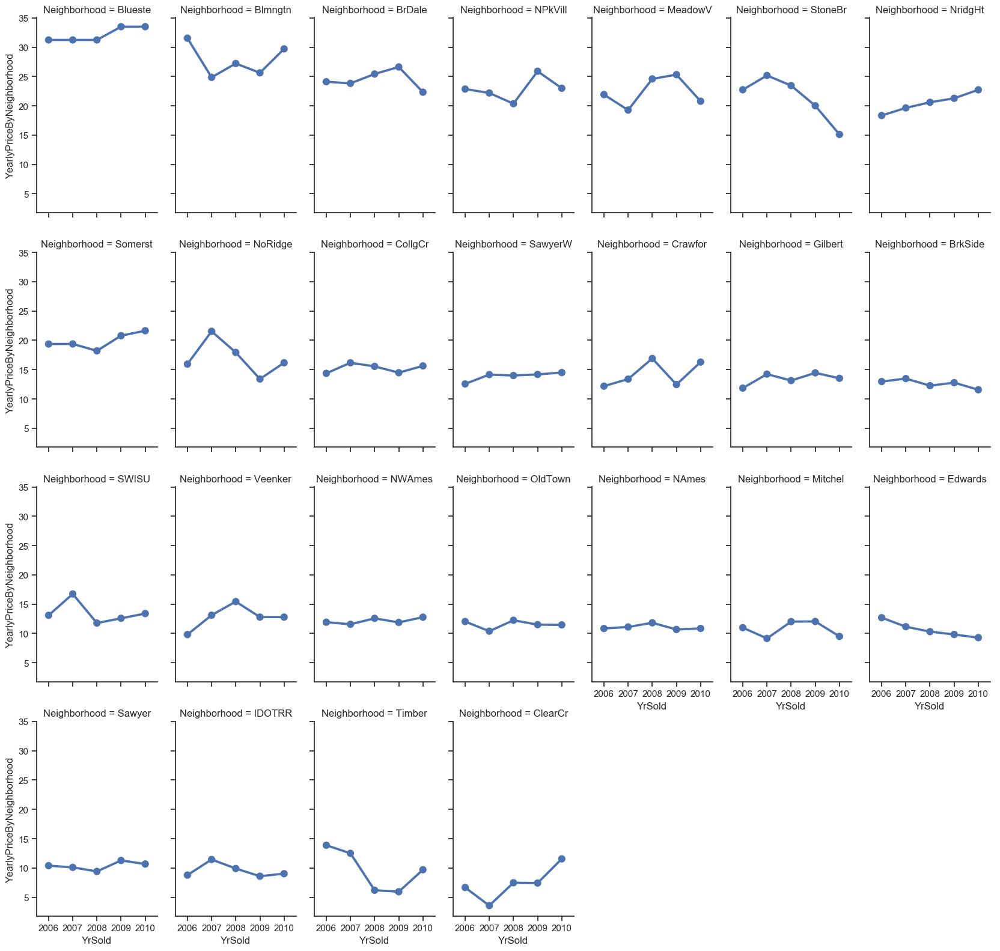

In [26]:
# Yearly Sales Price per Area (Constructed + Lot) by Neighborhood:
df['HistPriceByNeighborhood'] = df.SalePrice / df.TotalArea
df.drop(['TotalArea', 'SalePrice'], axis=1, inplace=True)

# Fill the gaps
df = df.append(pd.DataFrame([['NPkVill', 2006, df.HistPriceByNeighborhood[df.Neighborhood=='NPkVill'].mean()]], 
                            columns=df.columns))

df = df.append(pd.DataFrame([['Veenker', 2009, df.HistPriceByNeighborhood[df.Neighborhood=='Veenker'].mean()]], 
                            columns=df.columns))

df = df.append(pd.DataFrame([['Veenker', 2010, df.HistPriceByNeighborhood[df.Neighborhood=='Veenker'].mean()]], 
                            columns=df.columns))

df = df.append(pd.DataFrame([['Blueste', 2006, df.HistPriceByNeighborhood[df.Neighborhood=='Blueste'].min()]], 
                            columns=df.columns))

df = df.append(pd.DataFrame([['Blueste', 2007, df.HistPriceByNeighborhood[df.Neighborhood=='Blueste'].min()]], 
                            columns=df.columns))

df = df.append(pd.DataFrame([['Blueste', 2010, df.HistPriceByNeighborhood[df.Neighborhood=='Blueste'].max()]], 
                            columns=df.columns))

# Reserve data to merge with all data set of train and test data
YearlyPrice = df
YearlyPrice.columns = ['Neighborhood', 'YrSold', 'YearlyPriceByNeighborhood']

print('                              Yearly Sales Prices per Area (Constructed + Lot) by Neighborhood:')
g = sns.catplot(y= 'YearlyPriceByNeighborhood', x = 'YrSold', col='Neighborhood', data=YearlyPrice, 
               kind="point", aspect=.6, col_wrap=7, height=4, col_order=Neig.index)

                                 Monthly Sales Prices per Area (Constructed + Lot) by Neighborhood:


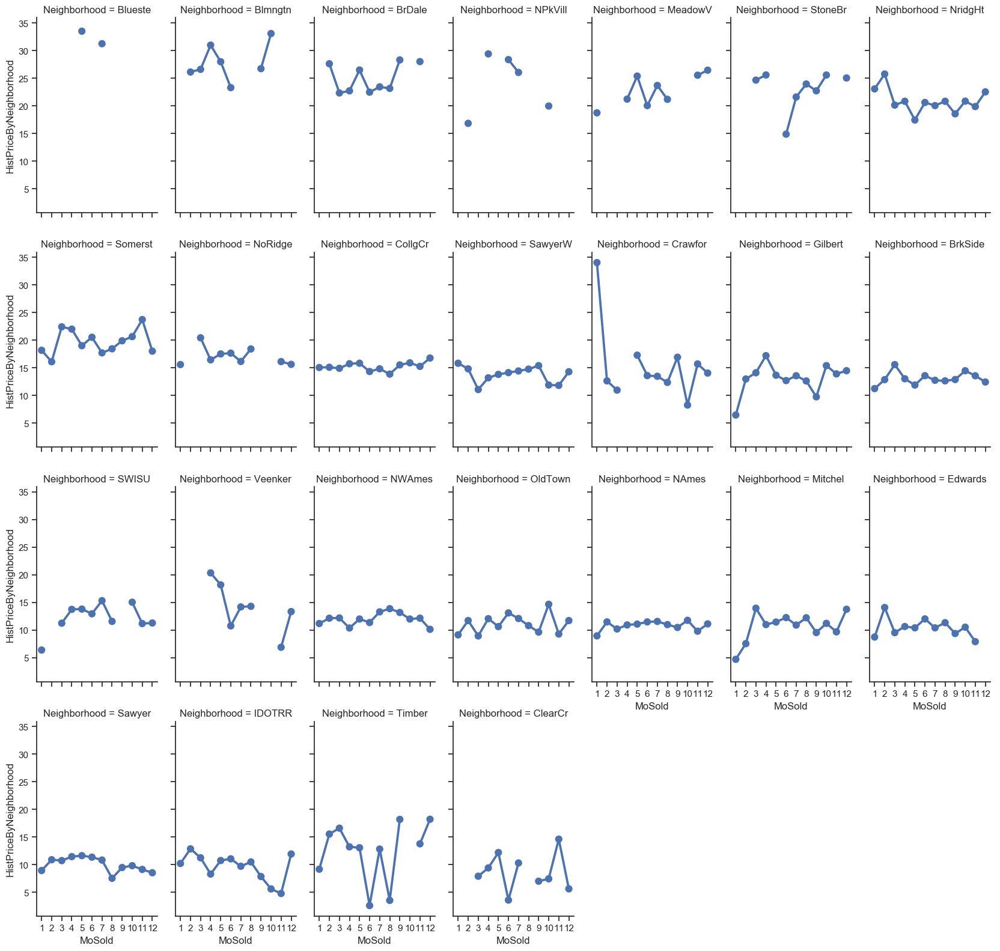

In [27]:
# Monthly Sales Prices per Area (Constructed + Lot) by Neighborhood:
df = train[['SalePrice', 'MoSold', 'Neighborhood']]

df['TotalArea'] = (train.TotalBsmtSF.fillna(0) + train.WoodDeckSF.fillna(0) + train.GrLivArea.fillna(0) + 
                   train.LotArea.fillna(0) + train.MasVnrArea.fillna(0) + train.GarageArea.fillna(0) + 
                   train.OpenPorchSF.fillna(0) + train.TSsnPorch.fillna(0) + train.ScreenPorch.fillna(0) + 
                   train.EnclosedPorch.fillna(0) + train.PoolArea.fillna(0) )

df = df.groupby(by=['Neighborhood', 'MoSold'], as_index=False).sum()
df['HistPriceByNeighborhood'] = df.SalePrice / df.TotalArea
df.drop(['TotalArea', 'SalePrice'], axis=1, inplace=True)

print('                                 Monthly Sales Prices per Area (Constructed + Lot) by Neighborhood:')
g = sns.catplot(y= 'HistPriceByNeighborhood', x = 'MoSold', col='Neighborhood', data=df, 
               kind="point", aspect=.6, col_wrap=7, height=4, col_order=Neig.index )

In [28]:
# Outliers from Crawfor Neighborhood
df = train[train.Neighborhood=='Crawfor'][['SalePrice', 'MoSold', 'Neighborhood']]

df['TotalArea'] = (train.TotalBsmtSF.fillna(0) + train.WoodDeckSF.fillna(0) + train.GrLivArea.fillna(0) + 
                   train.LotArea.fillna(0) + train.MasVnrArea.fillna(0) + train.GarageArea.fillna(0) + 
                   train.OpenPorchSF.fillna(0) + train.TSsnPorch.fillna(0) + train.ScreenPorch.fillna(0) + 
                   train.EnclosedPorch.fillna(0) + train.PoolArea.fillna(0) )

df['HistPriceByNeighborhood'] = df.SalePrice / df.TotalArea
df[df.HistPriceByNeighborhood>30]

,SalePrice,MoSold,Neighborhood,TotalArea,HistPriceByNeighborhood
1181,392500,11,Crawfor,9875.000,39.747
1405,275000,1,Crawfor,8074.000,34.060


In [29]:
train = train.loc[~(train.SalePrice==392500.0)]
train = train.loc[~((train.SalePrice==275000.0) & (train.Neighborhood=='Crawfor'))]
print('Data observations after outliers deletion:', train.shape[0])

Data observations after outliers deletion: 1449


                         Monthly Hist Sales Prices per Area (Construct + Lot) by Neighborhood:


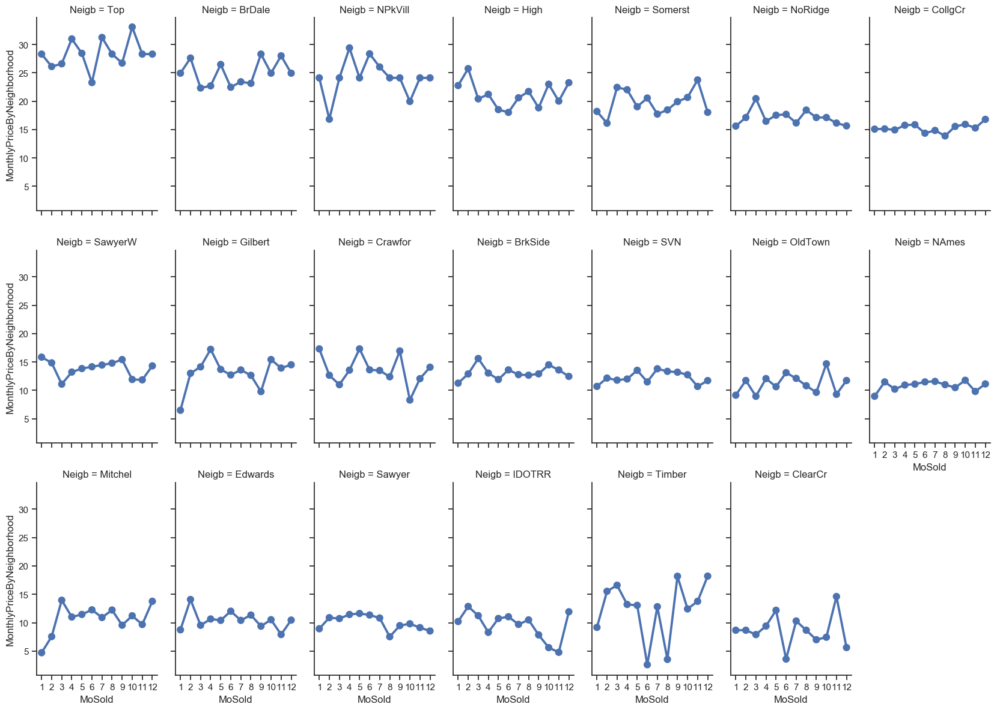

In [30]:
# Bin neighborhood for trade cases with low observations on monthly sales prices per Area (Constructed + Lot) by Neighborhood:
Neigb = {}
Neigb['Blueste'] = 'Top'     # 32.212721
Neigb['Blmngtn'] = 'Top'     # 28.364756
Neigb['BrDale']  = 'BrDale'  # 24.903923
Neigb['NPkVill'] = 'NPkVill' # 23.681105
Neigb['MeadowV'] = 'High'    # 22.034923
Neigb['StoneBr'] = 'High'    # 20.475090
Neigb['NridgHt'] =  'High'   # 20.209245
Neigb['Somerst'] = 'Somerst' # 19.551888
Neigb['NoRidge'] = 'NoRidge' # 17.038145
Neigb['CollgCr'] = 'CollgCr' # 15.134767
Neigb['SawyerW'] = 'SawyerW' # 13.992995
Neigb['Crawfor'] = 'Crawfor' # 13.773418
Neigb['Gilbert'] = 'Gilbert' # 13.260281
Neigb['BrkSide'] = 'BrkSide' # 12.785202
Neigb['SWISU']   = 'SVN'     # 12.635171
Neigb['Veenker'] = 'SVN'     # 12.343735
Neigb['NWAmes']  = 'SVN'     # 12.066590
Neigb['OldTown'] = 'OldTown' # 11.571331
Neigb['NAmes']   = 'NAmes'   # 11.091393
Neigb['Mitchel'] = 'Mitchel' # 10.936368
Neigb['Edwards'] = 'Edwards' # 10.614919
Neigb['Sawyer']  = 'Sawyer'  #10.334445
Neigb['IDOTRR']  = 'IDOTRR'  # 9.880838
Neigb['Timber']  = 'Timber'  # 8.723326
Neigb['ClearCr'] = 'ClearCr' # 6.113654

# Preper dataset for Sales Price per Area (Constructed + Lot) by Neighborhood:
df = train[['SalePrice', 'MoSold', 'Neighborhood']]

df['TotalArea'] = (train.TotalBsmtSF.fillna(0) + train.WoodDeckSF.fillna(0) + train.GrLivArea.fillna(0) + 
                   train.LotArea.fillna(0) + train.MasVnrArea.fillna(0) + train.GarageArea.fillna(0) + 
                   train.OpenPorchSF.fillna(0) + train.TSsnPorch.fillna(0) + train.ScreenPorch.fillna(0) + 
                   train.EnclosedPorch.fillna(0) + train.PoolArea.fillna(0) )
df['Price'] = df.SalePrice/df.TotalArea

# Cut Outliers from Crawfor Neighborhood
df = df[(((df.Neighborhood == 'Crawfor') & (df.Price<30.)) | (df.Neighborhood != 'Crawfor'))]
df.drop(['Price'], axis=1, inplace=True)

df.Neighborhood = train.Neighborhood.map(Neigb)

df = df.groupby(by=['Neighborhood', 'MoSold'], as_index=False).sum()
df['HistPriceByNeighborhood'] = df.SalePrice / df.TotalArea

# Get the index for order by value
Neig = df[['SalePrice', 'TotalArea', 'Neighborhood']].groupby(by='Neighborhood', as_index=False).sum()
Neig['NeigPrice'] = Neig.SalePrice / Neig.TotalArea
Neig.drop(['TotalArea', 'SalePrice'], axis=1, inplace=True)
Neig = Neig.groupby(by='Neighborhood', as_index=True).NeigPrice.sum().sort_values(ascending = False)

df.drop(['TotalArea', 'SalePrice'], axis=1, inplace=True)

# Fill the gaps
df = df.append(pd.DataFrame([['Top', 1, df.HistPriceByNeighborhood[df.Neighborhood=='Top'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['Top', 8, df.HistPriceByNeighborhood[df.Neighborhood=='Top'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['Top', 11, df.HistPriceByNeighborhood[df.Neighborhood=='Top'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['Top', 12, df.HistPriceByNeighborhood[df.Neighborhood=='Top'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['BrDale', 1, df.HistPriceByNeighborhood[df.Neighborhood=='BrDale'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['BrDale', 10, df.HistPriceByNeighborhood[df.Neighborhood=='BrDale'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['BrDale', 12, df.HistPriceByNeighborhood[df.Neighborhood=='BrDale'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['NPkVill', 1, df.HistPriceByNeighborhood[df.Neighborhood=='NPkVill'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['NPkVill', 3, df.HistPriceByNeighborhood[df.Neighborhood=='NPkVill'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['NPkVill', 5, df.HistPriceByNeighborhood[df.Neighborhood=='NPkVill'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['NPkVill', 8, df.HistPriceByNeighborhood[df.Neighborhood=='NPkVill'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['NPkVill', 9, df.HistPriceByNeighborhood[df.Neighborhood=='NPkVill'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['NPkVill', 11, df.HistPriceByNeighborhood[df.Neighborhood=='NPkVill'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['NPkVill', 12, df.HistPriceByNeighborhood[df.Neighborhood=='NPkVill'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['NoRidge', 2, df.HistPriceByNeighborhood[df.Neighborhood=='NoRidge'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['NoRidge', 9, df.HistPriceByNeighborhood[df.Neighborhood=='NoRidge'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['NoRidge', 10, df.HistPriceByNeighborhood[df.Neighborhood=='NoRidge'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['Crawfor', 1, df.HistPriceByNeighborhood[df.Neighborhood=='Crawfor'].max()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['Crawfor', 4, df.HistPriceByNeighborhood[df.Neighborhood=='Crawfor'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['Timber', 10, df.HistPriceByNeighborhood[df.Neighborhood=='Timber'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['ClearCr', 1, df.HistPriceByNeighborhood[df.Neighborhood=='ClearCr'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['ClearCr', 2, df.HistPriceByNeighborhood[df.Neighborhood=='ClearCr'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['ClearCr', 8, df.HistPriceByNeighborhood[df.Neighborhood=='ClearCr'].mean()]], 
                            columns=df.columns))
df = df.append(pd.DataFrame([['Edwards', 12, df.HistPriceByNeighborhood[df.Neighborhood=='Edwards'].mean()]], 
                            columns=df.columns))


# Reserve data to merge with all data set of train and test data
MonthlyPrice = df
MonthlyPrice.columns = ['Neigb', 'MoSold', 'MonthlyPriceByNeighborhood']

print('                         Monthly Hist Sales Prices per Area (Construct + Lot) by Neighborhood:')
g = sns.catplot(y= 'MonthlyPriceByNeighborhood', x = 'MoSold', col='Neigb', data=MonthlyPrice, 
               kind="point", aspect=.6, col_wrap=7, height=4, col_order=Neig.index )

In [31]:
def QQ_plot(data, measure):
    fig = plt.figure(figsize=(20,7))

    #Get the fitted parameters used by the function
    (mu, sigma) = norm.fit(data)

    #Kernel Density plot
    fig1 = fig.add_subplot(121)
    sns.distplot(data, fit=norm)
    fig1.set_title(measure + ' Distribution ( mu = {:.2f} and sigma = {:.2f} )'.format(mu, sigma), loc='center')
    fig1.set_xlabel(measure)
    fig1.set_ylabel('Frequency')

    #QQ plot
    fig2 = fig.add_subplot(122)
    res = probplot(data, plot=fig2)
    fig2.set_title(measure + ' Probability Plot (skewness: {:.6f} and kurtosis: {:.6f} )'.format(data.skew(), data.kurt()), loc='center')

    plt.tight_layout()
    plt.show()

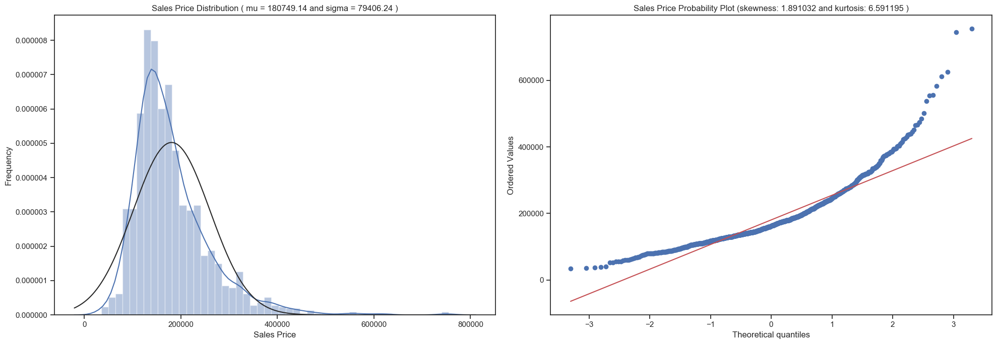

In [32]:
QQ_plot(train.SalePrice, 'Sales Price')

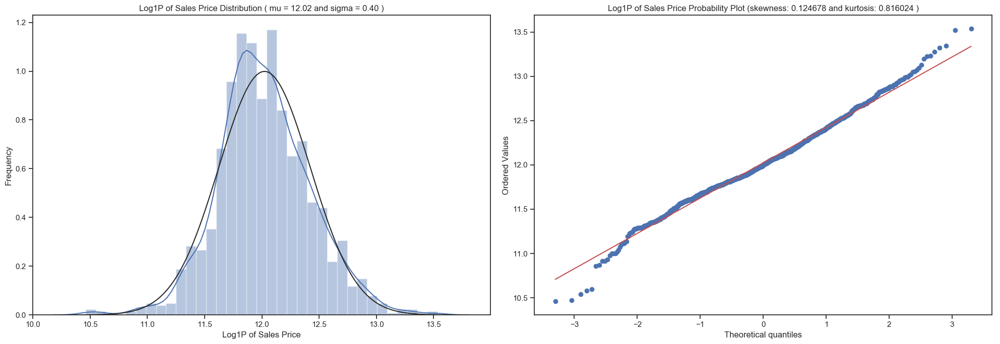

In [33]:
#We use the numpy fuction log1p which applies log(1+x) to all elements of the column
train.SalePrice = np.log1p(train.SalePrice)

QQ_plot(train.SalePrice, 'Log1P of Sales Price')

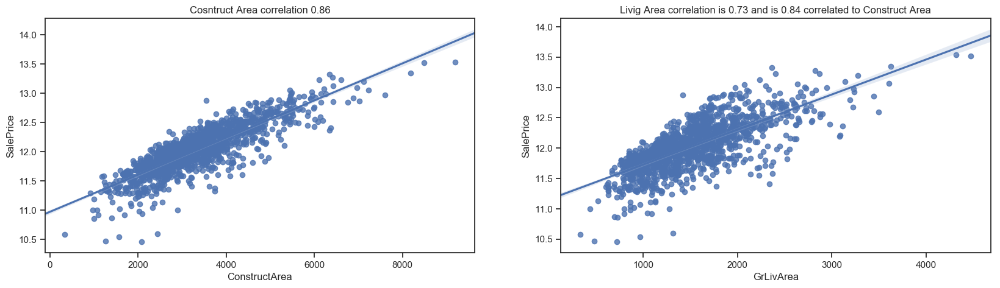

In [34]:
df = train[['SalePrice', 'GrLivArea']]
df['ConstructArea'] = (train.TotalBsmtSF.fillna(0) + train.WoodDeckSF.fillna(0) + train.GrLivArea.fillna(0) + 
                       train.MasVnrArea.fillna(0) + train.GarageArea.fillna(0) + train.OpenPorchSF.fillna(0) + 
                       train.TSsnPorch.fillna(0) + train.ScreenPorch.fillna(0) + train.EnclosedPorch.fillna(0) + 
                       train.PoolArea.fillna(0) )
                         
fig8 = plt.figure(figsize=(20,5))
fig9 = fig8.add_subplot(121); sns.regplot((df.ConstructArea), df.SalePrice)
plt.title('Cosntruct Area correlation {:1.2f}'.format(df.ConstructArea.corr(df.SalePrice)))

fig10 = fig8.add_subplot(122); sns.regplot((df.GrLivArea.fillna(0)), df.SalePrice)
tit = 'Livig Area correlation is {:1.2f} and is {:1.2f} correlated to Construct Area'
plt.title(tit.format(df.GrLivArea.fillna(0).corr(df.SalePrice), df.GrLivArea.corr(df.ConstructArea)))
plt.show()

In [35]:
def print_results():
    # The coefficients
    print('Coefficients: \n', lr.coef_)
    # The mean squared error
    print("Root mean squared error: %.4f"
          % np.expm1(np.sqrt(mean_squared_error(y_test, y_pred))))
    # Explained variance score: 1 is perfect prediction
    print('Variance score: %.4f' % r2_score(y_test, y_pred))
    print('--------------------------------------------------------------------------------\n')
    
scale = RobustScaler()
y = df.SalePrice

X = scale.fit_transform(df[['ConstructArea', 'GrLivArea']])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=101)

lr = LinearRegression()

print('1. Linear regressor with only living Area:')
lr.fit(X_train[: , 1].reshape(-1, 1), y_train)

# Make predictions using the testing set
y_pred = lr.predict(X_test[: , 1].reshape(-1, 1))
print_results()

print('2. Linear regressor with bouth features:')
lr.fit(X_train, y_train)

# Makepredictions using the testing set
y_pred = lr.predict(X_test)
print_results()

print('3. Linear regressor with only Construct Area:')
lr = LinearRegression()
lr.fit(X_train[: , 0].reshape(-1, 1), y_train)

# Makepredictions using the testing set
y_pred = lr.predict(X_test[: , 0].reshape(-1, 1))
print_results()

print('4. Polinomial regressor of orden 3 with only Construction Area:')
# create polynomial features
cubic = PolynomialFeatures(degree=3, interaction_only=False, include_bias=False)
X_cubic = cubic.fit_transform(X_train[: , 0].reshape(-1, 1))

# cubic fit
lr = lr.fit(X_cubic, y_train)
y_pred = lr.predict(cubic.fit_transform(X_test[: , 0].reshape(-1, 1)))
print_results()

print('5. Polinomial regressor of orden 3 with both features:')
# create polynomial features
cubic = PolynomialFeatures(degree=3, interaction_only=False, include_bias=False)
X_cubic = cubic.fit_transform(X_train)

# cubic fit
lr = lr.fit(X_cubic, y_train)
y_pred = lr.predict(cubic.fit_transform(X_test))
print_results()

1. Linear regressor with only living Area:
Coefficients: 
 [0.37373448]
Root mean squared error: 0.3135
Variance score: 0.5547
--------------------------------------------------------------------------------

2. Linear regressor with bouth features:
Coefficients: 
 [0.40446921 0.02013973]
Root mean squared error: 0.2275
Variance score: 0.7484
--------------------------------------------------------------------------------

3. Linear regressor with only Construct Area:
Coefficients: 
 [0.42050449]
Root mean squared error: 0.2276
Variance score: 0.7481
--------------------------------------------------------------------------------

4. Polinomial regressor of orden 3 with only Construction Area:
Coefficients: 
 [ 0.437434   -0.0420375   0.00630214]
Root mean squared error: 0.2212
Variance score: 0.7608
--------------------------------------------------------------------------------

5. Polinomial regressor of orden 3 with both features:
Coefficients: 
 [ 0.41182783  0.03846449 -0.0503578

In [36]:
ntrain = train.shape[0]
ntest = test.shape[0]
y_train = train.SalePrice.values
all_data = pd.concat((train, test)).reset_index(drop=True)

print("All data observations have {0} rows and {1} columns".format(all_data.shape[0], all_data.shape[1]))
details = rstr(all_data)
print("All data have {1:2.2%} of null at {0} features".format(details[details.nulls>0].shape[0], 
                                                   details.nulls[details.nulls>0].sum()/all_data.size))
print('\nBelow the table with all columns with nulls oredered by missin ration:')
display(details.loc[(details.nulls>0), 'types':'uniques'].sort_values(by= 'missing ration', ascending=False))

All data observations have 2908 rows and 80 columns
Data shape: (2908, 80)
___________________________
Data types:
 object     43
int64      25
float64    12
Name: types, dtype: int64
___________________________
All data have 5.98% of null at 34 features

Below the table with all columns with nulls oredered by missin ration:


,types,counts,distincts,nulls,missing ration,uniques
PoolQC,object,9,4,2899,99.691,"[[nan, Ex, Fa, Gd]]"
MiscFeature,object,104,5,2804,96.424,"[[nan, Shed, Gar2, Othr, TenC]]"
Alley,object,197,3,2711,93.226,"[[nan, Grvl, Pave]]"
Fence,object,570,5,2338,80.399,"[[nan, MnPrv, GdWo, GdPrv, MnWw]]"
FireplaceQu,object,1493,6,1415,48.659,"[[nan, TA, Gd, Fa, Ex, Po]]"
LotFrontage,float64,2423,129,485,16.678,"[[65.0, 80.0, 68.0, 60.0, 84.0, 85.0, 75.0, na..."
GarageCond,object,2752,6,156,5.365,"[[TA, Fa, nan, Gd, Po, Ex]]"
GarageQual,object,2752,6,156,5.365,"[[TA, Fa, Gd, nan, Ex, Po]]"
GarageYrBlt,float64,2752,104,156,5.365,"[[2003.0, 1976.0, 2001.0, 1998.0, 2000.0, 1993..."
GarageFinish,object,2752,4,156,5.365,"[[RFn, Unf, Fin, nan]]"


In [37]:
class DataFrameImputer(TransformerMixin):

    def __init__(self):
        """
        Impute missing values:
        - Columns of dtype object are imputed with the most frequent value in column.
        - Columns of other types are imputed with mean of column.
        """
    def fit(self, X, y=None):

        self.fill = pd.Series([X[c].value_counts().index[0]
            if X[c].dtype == np.dtype('O') else X[c].mean() for c in X],
            index=X.columns)

        return self

    def transform(self, X, y=None):
        return X.fillna(self.fill)

14 has few null, so are good candidates for imputer strategies:
- GarageFinish  1379  object.  Interior finish of the garage.
- GarageQual    1379  object:  Garage quality. 
- GarageCond    1379  object:  Garage condition. 
- GarageType    1379  object:  Garage location
- GarageYrBlt   1379  float64: Year garage was built
- Electrical    1459  object.  Only one, can apply the most common.
- MasVnrType    1452  object:  is the masonry veneer type, hasn't CBlock!
- MasVnrArea    1452  float64: Masonry veneer area in square feet.   
- BsmtExposure  1422  object:  Refers to walkout or garden level walls.
- BsmtFinType2  1422  object:  Rating of basement finished area (if multiple types).
- BsmtQual      1423  object:  Evaluates the height of the basement Doesn't have PO.
- BsmtCond      1423  object:  Evaluates the general condition of the basement. 
- BsmtFinType1  1423  object:  Rating of basement finished area (if multiple types).    
- LotFrontage   1201  float64: is the linear feet of street connected to property.

5 has miss ration grater than 47%, maybe candidates to exclude, especially if their have below correlation with price.
- Fence         281  object: Fence quality.
- FireplaceQu   770  object: Fireplace quality.
- MiscFeature    54  object: Miscellaneous feature not covered in other categories. 
- Alley          91  object: is the type of alley access to property.
- PoolQC          7  object: Pool quality. Attention for the related other feature PoolArea: Pool area in square feet

In [38]:
all_data.drop('Utilities', axis=1, inplace=True)

In [39]:
display(all_data.Electrical.value_counts())

all_data.Electrical = all_data.Electrical.fillna('SBrkr')

SBrkr    2661
FuseA     187
FuseF      50
FuseP       8
Mix         1
Name: Electrical, dtype: int64

In [40]:
feat = ['GarageYrBlt', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'GarageArea', 'GarageCars']
print(all_data[feat].isnull().sum())
print("GarageArea equal a 0: ", (all_data.GarageArea==0).sum())
print("GarageCars equal a 0: ", (all_data.GarageCars==0).sum())
c = all_data[~all_data.GarageType.isnull()][feat]
c[c.GarageYrBlt.isnull()]

GarageYrBlt     156
GarageType      154
GarageFinish    156
GarageQual      156
GarageCond      156
GarageArea        1
GarageCars        1
dtype: int64
GarageArea equal a 0:  154
GarageCars equal a 0:  154


,GarageYrBlt,GarageType,GarageFinish,GarageQual,GarageCond,GarageArea,GarageCars
2115,nan,Detchd,NaN,NaN,NaN,360.000,1.000
2565,nan,Detchd,NaN,NaN,NaN,nan,nan


In [41]:
all_data.GarageType = all_data.GarageType.fillna('NA')

# Group by GarageType and fill missing value with median where GarageType=='Detchd' and 0 for the others
cmedian = all_data[all_data.GarageType=='Detchd'].GarageArea.median()
print("GarageArea median of Type Detchd:", cmedian)
all_data.loc[all_data.GarageType=='Detchd', 'GarageArea'] = all_data.loc[all_data.GarageType=='Detchd', 
                                                                         'GarageArea'].fillna(cmedian)
all_data.GarageArea = all_data.GarageArea.fillna(0)

cmedian = all_data[all_data.GarageType=='Detchd'].GarageCars.median()
print("GarageCars median of Type Detchd:", cmedian)
all_data.loc[all_data.GarageType=='Detchd', 'GarageCars'] = all_data.loc[all_data.GarageType=='Detchd', 
                                                                         'GarageCars'].fillna(cmedian)
all_data.GarageCars = all_data.GarageCars.fillna(0)

cmedian = all_data[all_data.GarageType=='Detchd'].GarageYrBlt.median()
print("GarageYrBlt median of Type Detchd:", cmedian)
all_data.loc[all_data.GarageType=='Detchd', 'GarageYrBlt'] = all_data.loc[all_data.GarageType=='Detchd', 
                                                                          'GarageYrBlt'].fillna(cmedian)
all_data.GarageYrBlt = all_data.GarageYrBlt.fillna(0)

# Group by GarageType and fill missing value with mode where GarageType=='Detchd' and 'NA' for the others
cmode = all_data[all_data.GarageType=='Detchd'].GarageFinish.mode()[0]
print("GarageFinish mode of Type Detchd:", cmode)
all_data.loc[all_data.GarageType=='Detchd', 'GarageFinish'] = all_data.loc[all_data.GarageType=='Detchd', 
                                                                           'GarageFinish'].fillna(cmode)
all_data.GarageFinish = all_data.GarageFinish.fillna('NA')

cmode = all_data[all_data.GarageType=='Detchd'].GarageQual.mode()[0]
print("GarageQual mode of Type Detchd: %s" %cmode)
all_data.loc[all_data.GarageType=='Detchd', 'GarageQual'] = all_data.loc[all_data.GarageType=='Detchd', 
                                                                         'GarageQual'].fillna(cmode)
all_data.GarageQual = all_data.GarageQual.fillna('NA')

cmode = all_data[all_data.GarageType=='Detchd'].GarageCond.mode()[0]
print("GarageCond mode of Type Detchd:", cmode)
all_data.loc[all_data.GarageType=='Detchd', 'GarageCond'] = all_data.loc[all_data.GarageType=='Detchd', 
                                                                         'GarageCond'].fillna(cmode)
all_data.GarageCond = all_data.GarageCond.fillna('NA')

GarageArea median of Type Detchd: 397.5
GarageCars median of Type Detchd: 2.0
GarageYrBlt median of Type Detchd: 1962.0
GarageFinish mode of Type Detchd: Unf
GarageQual mode of Type Detchd: TA
GarageCond mode of Type Detchd: TA


In [42]:
print(all_data[feat].isnull().sum())

GarageYrBlt     0
GarageType      0
GarageFinish    0
GarageQual      0
GarageCond      0
GarageArea      0
GarageCars      0
dtype: int64


In [43]:
feat = ['MasVnrArea', 'MasVnrType']
c = all_data[~all_data.MasVnrArea.isnull()][feat]
print('Masonry veneer Nulls:')
print(all_data[feat].isnull().sum(), '\n')
print("Has MasVnrType but not has MasVnrArea:",all_data[~all_data.MasVnrType.isnull()].MasVnrArea.isnull().sum())
print("Has MasVnrArea but not has MasVnrType:",c[c.MasVnrType.isnull()].MasVnrArea.count())
print(c[c.MasVnrType.isnull()], '\n')

print("Has MasVnrType but MasVnrArea is equal a Zero:",c[c.MasVnrArea==0].MasVnrType.count())
print("MasVnrArea equal a 0: ", (all_data.MasVnrArea==0).sum(), '\n')
print("Has Type and Area == 0:")
print(c[c.MasVnrArea==0].MasVnrType.value_counts(), '\n')

print("Type None with Area > 0 ?")
print(all_data.loc[(all_data.MasVnrType=='None') & (all_data.MasVnrArea>0), ['MasVnrType','MasVnrArea']])

print('\n What is the most comumn MasVnrType after None?')
print(all_data.MasVnrType.value_counts())

Masonry veneer Nulls:
MasVnrArea    23
MasVnrType    24
dtype: int64 

Has MasVnrType but not has MasVnrArea: 0
Has MasVnrArea but not has MasVnrType: 1
      MasVnrArea MasVnrType
2599     198.000        NaN 

Has MasVnrType but MasVnrArea is equal a Zero: 1734
MasVnrArea equal a 0:  1734 

Has Type and Area == 0:
None       1731
BrkFace       2
Stone         1
Name: MasVnrType, dtype: int64 

Type None with Area > 0 ?
     MasVnrType  MasVnrArea
622        None     288.000
769        None       1.000
1222       None       1.000
1291       None     344.000
1325       None     312.000
1658       None     285.000
2441       None       1.000

 What is the most comumn MasVnrType after None?
None       1738
BrkFace     877
Stone       244
BrkCmn       25
Name: MasVnrType, dtype: int64


In [44]:
# All None Types with Are greater than 0 update to BrkFace type
all_data.loc[(all_data.MasVnrType=='None') & (all_data.MasVnrArea>0), ['MasVnrType']] = 'BrkFace'

# All Types null with Are greater than 0 update to BrkFace type
all_data.loc[(all_data.MasVnrType.isnull()) & (all_data.MasVnrArea>0), ['MasVnrType']] = 'BrkFace'

# All Types different from None with Are equal to 0 update to median Area of no None types with Areas
all_data.loc[(all_data.MasVnrType!='None') & 
             (all_data.MasVnrArea==0), ['MasVnrArea']] = all_data.loc[(all_data.MasVnrType!='None') & 
                                                                      (all_data.MasVnrArea>0), ['MasVnrArea']].median()[0]
# Filling 0 and None for records wheres both are nulls
all_data.MasVnrArea = all_data.MasVnrArea.fillna(0)
all_data.MasVnrType = all_data.MasVnrType.fillna('None')

In [45]:
c = all_data[~all_data.MasVnrType.isnull()][feat]
print('Masonry veneer Nulls:')
print(all_data[feat].isnull().sum(), '\n')

Masonry veneer Nulls:
MasVnrArea    0
MasVnrType    0
dtype: int64 



In [46]:
feat = ['BsmtFinSF1','BsmtFinSF2', 'BsmtUnfSF','TotalBsmtSF','BsmtFullBath', 'BsmtHalfBath', 
        'BsmtQual', 'BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2']
print(all_data[feat].isnull().sum())
print("BsmtFinSF1 equal a 0: ", (all_data.BsmtFinSF1==0).sum())
print("BsmtFinSF2 equal a 0: ", (all_data.BsmtFinSF2==0).sum())
print("BsmtUnfSF equal a 0: ", (all_data.BsmtUnfSF==0).sum())
print("TotalBsmtSF equal a 0: ", (all_data.TotalBsmtSF==0).sum())
print("BsmtFullBath equal a 0: ", (all_data.BsmtFullBath==0).sum())
print("BsmtHalfBath equal a 0: ", (all_data.BsmtHalfBath==0).sum())

BsmtFinSF1       1
BsmtFinSF2       1
BsmtUnfSF        1
TotalBsmtSF      1
BsmtFullBath     2
BsmtHalfBath     2
BsmtQual        81
BsmtCond        82
BsmtExposure    82
BsmtFinType1    79
BsmtFinType2    80
dtype: int64
BsmtFinSF1 equal a 0:  927
BsmtFinSF2 equal a 0:  2560
BsmtUnfSF equal a 0:  240
TotalBsmtSF equal a 0:  78
BsmtFullBath equal a 0:  1702
BsmtHalfBath equal a 0:  2734


In [47]:
# No Basement Av is the most comumn BsmtExposure. 
display(all_data.BsmtExposure.value_counts())

# Update nulls Exposure to Av wheres TotalBsmntSF is grenter tham zero 
all_data.loc[(~all_data.TotalBsmtSF.isnull()) & 
             (all_data.BsmtExposure.isnull()) & 
             (all_data.TotalBsmtSF>0), 'BsmtExposure'] = 'Av'

No    1899
Av     417
Gd     271
Mn     239
Name: BsmtExposure, dtype: int64

In [48]:
# TA is the most comumn BsmtQual. 
display(all_data.BsmtQual.value_counts())

# We use TA for all cases wheres has same evidenci that the house has Basement
all_data.loc[(~all_data.TotalBsmtSF.isnull()) & 
             (all_data.BsmtQual.isnull()) & 
             (all_data.TotalBsmtSF>0), 'BsmtQual'] = 'TA'

TA    1278
Gd    1208
Ex     253
Fa      88
Name: BsmtQual, dtype: int64

In [49]:
# TA is the most comumn BsmtCond. 
display(all_data.BsmtCond.value_counts())

# We use TA for all cases wheres has same evidenci that the house has Basement
all_data.loc[(~all_data.TotalBsmtSF.isnull()) & (all_data.BsmtCond.isnull()) & (all_data.TotalBsmtSF>0), 'BsmtCond'] = 'TA'

TA    2597
Gd     121
Fa     103
Po       5
Name: BsmtCond, dtype: int64

In [50]:
# Unf is the most comumn BsmtFinType2. 
display(all_data.BsmtFinType2.value_counts())

# We use Unf for all cases wheres BsmtFinType2 is null but BsmtFinSF2 is grater than Zro
all_data.loc[(all_data.BsmtFinSF2>0) & (all_data.BsmtFinType2.isnull()) , 'BsmtFinType2'] = 'Unf'

Unf    2482
Rec     105
LwQ      87
BLQ      68
ALQ      52
GLQ      34
Name: BsmtFinType2, dtype: int64

In [51]:
# See below that we have one case where BsmtFinType2 is BLQ and the Area is Zero, but its area was inputed at Unfinesh
display(all_data[(all_data.BsmtFinSF2==0) & (all_data.BsmtFinType2!='Unf') & (~all_data.BsmtFinType2.isnull())][feat])

# Correct BsmtFinSF2 and BsmtUnfSF:
all_data.loc[(all_data.BsmtFinSF2==0) & (all_data.BsmtFinType2!='Unf') & (~all_data.BsmtFinType2.isnull()), 'BsmtFinSF2'] = 354.0
all_data.loc[(all_data.BsmtFinSF2==0) & (all_data.BsmtFinType2!='Unf') & (~all_data.BsmtFinType2.isnull()), 'BsmtUnfSF'] = 0.0

,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2
1459,1051.000,0.000,354.000,1405.000,1.000,0.000,Gd,TA,No,GLQ,BLQ


In [52]:
# All these cases are clear don´t have basement. 
print("Rest cases where Cond is Null", (all_data[all_data.BsmtCond.isnull()]).shape[0], '\n')
print('Others categories basement features are Null when Cond is Null:\n',
      (all_data[all_data.BsmtCond.isnull()][['BsmtQual', 'BsmtCond', 'BsmtExposure',
                                             'BsmtFinType1' , 'BsmtFinType2']]).isnull().sum())
print('\nOthers numerics basement features are Null or Zero when Cond is Null:\n',
      all_data[all_data.BsmtCond.isnull()][['BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF' ,'TotalBsmtSF',
                                            'BsmtFullBath', 'BsmtHalfBath']].sum())
print("\nThe particular cases where's numeric basement features see below are Null were included in the previous groups:") 
display(all_data[all_data.BsmtFullBath.isnull()][feat])

# So, we update these Zero or NA according to their dictionary:
nulls_cols = {'BsmtExposure': 'NA', 'BsmtFinType2': 'NA', 'BsmtQual': 'NA', 'BsmtCond': 'NA', 'BsmtFinType1': 'NA',
              'BsmtFinSF1': 0, 'BsmtFinSF2': 0, 'BsmtUnfSF': 0 ,'TotalBsmtSF': 0, 'BsmtFullBath': 0, 'BsmtHalfBath': 0}

all_data = all_data.fillna(value=nulls_cols)

print('\nFinal Check if all nulls basement features are treated:', all_data[feat].isnull().sum().sum())

Rest cases where Cond is Null 79 

Others categories basement features are Null when Cond is Null:
 BsmtQual        79
BsmtCond        79
BsmtExposure    79
BsmtFinType1    79
BsmtFinType2    79
dtype: int64

Others numerics basement features are Null or Zero when Cond is Null:
 BsmtFinSF1     0.000
BsmtFinSF2     0.000
BsmtUnfSF      0.000
TotalBsmtSF    0.000
BsmtFullBath   0.000
BsmtHalfBath   0.000
dtype: float64

The particular cases where's numeric basement features see below are Null were included in the previous groups:


,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,BsmtFullBath,BsmtHalfBath,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2
2109,nan,nan,nan,nan,nan,nan,NaN,NaN,NaN,NaN,NaN
2177,0.000,0.000,0.000,0.000,nan,nan,NaN,NaN,NaN,NaN,NaN



Final Check if all nulls basement features are treated: 0


In [53]:
# Group by Neigborhood and fill missing value with Lot frontage median of the respect Neigborhood
NegMean = all_data.groupby('Neighborhood').LotFrontage.mean()

all_data.loc.LotFrontage = all_data[['Neighborhood', 'LotFrontage']].\
                           apply(lambda x: NegMean[x.Neighborhood] if np.isnan(x.LotFrontage) else x.LotFrontage, axis=1)

In [54]:
PoolQC = {0: 'NA', 1: 'Po', 2: 'Fa', 3: 'TA', 4: 'Gd', 5: 'Ex'}

all_data.loc[(all_data.PoolArea>0) & (all_data.PoolQC.isnull()), ['PoolQC']] =\
        ((all_data.loc[(all_data.PoolArea>0) & (all_data.PoolQC.isnull()), ['OverallQual']]/2).round()).\
        apply(lambda x: x.map(PoolQC))

all_data.PoolQC = all_data.PoolQC.fillna('NA')

In [55]:
all_data.Functional = all_data.Functional.fillna('Typ')

In [56]:
all_data.loc[(all_data.Fireplaces==0) & (all_data.FireplaceQu.isnull()), ['FireplaceQu']] = 'NA'

In [57]:
all_data.loc[(all_data.KitchenAbvGr>0) & (all_data.KitchenQual.isnull()), 
             ['KitchenQual']] = all_data.KitchenQual.mode()[0]

In [58]:
all_data.Alley = all_data.Alley.fillna('NA')
all_data.Fence = all_data.Fence.fillna('NA')
all_data.MiscFeature = all_data.MiscFeature.fillna('NA')

In [59]:
display(all_data.loc[all_data.GarageYrBlt==2207, ['GarageYrBlt', 'YearBuilt']])
all_data.loc[all_data.GarageYrBlt==2207.0, 'GarageYrBlt'] = 2007.0

,GarageYrBlt,YearBuilt
2581,2207.000,2006


In [60]:
all_data = DataFrameImputer().fit_transform(all_data)

# Final check if we have some NA
print("Data nulls:", all_data.isnull().sum().sum())

Data nulls: 0


In [61]:
def map_ordinals(data):
    
    # LandSlope: Slope of property
    LandSlope = {}
    LandSlope['Gtl'] = 3 #'Gentle slope'
    LandSlope['Mod'] = 2 #'Moderate Slope'
    LandSlope['Sev'] = 1 #'Severe Slope'

    data.LandSlope = data.LandSlope.map(LandSlope)
        
    # ExterQual: Evaluates the quality of the material on the exterior 
    ExterQual = {}
    ExterQual['Ex'] = 5 #'Excellent'
    ExterQual['Gd'] = 4 #'Good'
    ExterQual['TA'] = 3 #'Average/Typical'
    ExterQual['Fa'] = 2 #'Fair'
    ExterQual['Po'] = 1 #'Poor'
    ExterQual['NA'] = 0 #'NA'

    data.ExterQual = data.ExterQual.map(ExterQual)

    # ExterCond: Evaluates the present condition of the material on the exterior
    data.ExterCond = data.ExterCond.map(ExterQual)

    #HeatingQC: Heating quality and condition
    data.HeatingQC = data.HeatingQC.map(ExterQual)

    # KitchenQual: Kitchen quality
    data.KitchenQual = data.KitchenQual.map(ExterQual)

    # FireplaceQu: Fireplace quality
    data.FireplaceQu = data.FireplaceQu.map(ExterQual)

    # GarageCond: Garage Conditionals
    data.GarageCond = data.GarageCond.map(ExterQual)

    PavedDrive = {}
    PavedDrive['Y'] = 3 #'Paved'
    PavedDrive['P'] = 2 #'Partial Pavement'
    PavedDrive['N'] = 1 #'Dirt/Gravel'

    data.PavedDrive = data.PavedDrive.map(PavedDrive)

    # LotShape: General shape of property
    LotShape = {}
    LotShape['Reg'] = 4 #'Regular'
    LotShape['IR1'] = 3 #'Slightly irregular'
    LotShape['IR2'] = 2 #'Moderately Irregular'
    LotShape['IR3'] = 1 #'Irregular'

    data.LotShape = data.LotShape.map(LotShape)

    # BsmtQual: Evaluates the height of the basement
    BsmtQual = {}
    BsmtQual['Ex'] = 5 #'Excellent (100+ inches)'
    BsmtQual['Gd'] = 4 #'Good (90-99 inches)'
    BsmtQual['TA'] = 3 #'Typical (80-89 inches)'
    BsmtQual['Fa'] = 2 #'Fair (70-79 inches)'
    BsmtQual['Po'] = 1 #'Poor (<70 inches'
    BsmtQual['NA'] = 0 #'No Basement'

    data.BsmtQual = data.BsmtQual.map(BsmtQual)

    # BsmtCond: Evaluates the general condition of the basement
    data.BsmtCond = data.BsmtCond.map(BsmtQual)

    # GarageQual: Garage quality
    data.GarageQual = data.GarageQual.map(BsmtQual)

    # PoolQC: Pool quality
    data.PoolQC = data.PoolQC.map(BsmtQual)
    
    # BsmtExposure: Refers to walkout or garden level walls
    BsmtExposure = {}
    BsmtExposure['Gd'] = 4 #'Good Exposure'
    BsmtExposure['Av'] = 3 #'Average Exposure (split levels or foyers typically score average or above)'
    BsmtExposure['Mn'] = 2 #'Mimimum Exposure'
    BsmtExposure['No'] = 1 #'No Exposure'
    BsmtExposure['NA'] = 0 #'No Basement'

    data.BsmtExposure = data.BsmtExposure.map(BsmtExposure)

    # BsmtFinType1: Rating of basement finished area
    BsmtFinType1 = {}
    BsmtFinType1['GLQ'] = 6 #'Good Living Quarters'
    BsmtFinType1['ALQ'] = 5 # 'Average Living Quarters'
    BsmtFinType1['BLQ'] = 4 # 'Below Average Living Quarters'
    BsmtFinType1['Rec'] = 3 # 'Average Rec Room'
    BsmtFinType1['LwQ'] = 2 # 'Low Quality'
    BsmtFinType1['Unf'] = 1 # 'Unfinshed'
    BsmtFinType1['NA'] = 0 #'No Basement'

    data.BsmtFinType1 = data.BsmtFinType1.map(BsmtFinType1)

    # BsmtFinType2: Rating of basement finished area (if multiple types)
    data.BsmtFinType2 = data.BsmtFinType2.map(BsmtFinType1)

    #CentralAir: Central air conditioning
    # Since with this transformatio as the same as binarize this feature
    CentralAir = {}
    CentralAir['N'] = 0
    CentralAir['Y'] = 1

    data.CentralAir = data.CentralAir.map(CentralAir)

    # GarageFinish: Interior finish of the garage
    GarageFinish = {}
    GarageFinish['Fin'] = 3 #'Finished'
    GarageFinish['RFn'] = 2 #'Rough Finished'
    GarageFinish['Unf'] = 1 #'Unfinished'
    GarageFinish['NA'] = 0 #'No Garage'
    
    data.GarageFinish = data.GarageFinish.map(GarageFinish)
    
    # Functional: Home functionality
    Functional = {}
    Functional['Typ'] = 7   # Typical Functionality
    Functional['Min1'] = 6  # Minor Deductions 1
    Functional['Min2'] = 5  # Minor Deductions 2
    Functional['Mod'] = 4   # Moderate Deductions
    Functional['Maj1'] = 3  # Major Deductions 1
    Functional['Maj2'] = 2  # Major Deductions 2
    Functional['Sev'] = 1   # Severely Damaged
    Functional['Sal'] = 0   # Salvage only

    data.Functional = data.Functional.map(Functional)
    
    #Street: Type of road access to property
    # Since with this transformatio as the same as binarize this feature
    Street = {}
    Street['Grvl'] = 0 # Gravel 
    Street['Pave'] = 1 # Paved

    data.Street = data.Street.map(Street)


    # Fence: Fence quality
    Fence = {}
    Fence['GdPrv'] = 5 #'Good Privacy'
    Fence['MnPrv'] = 4 #'Minimum Privacy'
    Fence['GdWo'] = 3 #'Good Wood'
    Fence['MnWw'] = 2 #'Minimum Wood/Wire'
    Fence['NA'] = 1 #'No Fence'

    data.Fence = data.Fence.map(Fence)
    #But No Fence has the higest median Sales Price. So I try to use it as categorical
            
    return data

all_data = map_ordinals(all_data)

In [62]:
display(all_data.loc[(all_data.PoolArea>0) & (all_data.MiscVal>0), ['MiscFeature', 'MiscVal', 'PoolArea', 'PoolQC']])

,MiscFeature,MiscVal,PoolArea,PoolQC
1376,TenC,2000,519,2


In [63]:
display(all_data.loc[(all_data.MiscFeature=='TenC'), ['MiscFeature', 'MiscVal', 'PoolArea', 'PoolQC']])

,MiscFeature,MiscVal,PoolArea,PoolQC
1376,TenC,2000,519,2


In [64]:
all_data.loc[(all_data.PoolArea>0), ['MiscFeature']] = 'Pool'
all_data.loc[(all_data.PoolArea>0), ['MiscVal']] = all_data.loc[(all_data.PoolArea>0), 
                                                               ['MiscVal', 'PoolArea']].\
                                                                apply(lambda x: (x.MiscVal + x.PoolArea), axis=1)

In [65]:
all_data['TotalExtraPoints'] = all_data.HeatingQC + all_data.PoolQC + all_data.FireplaceQu  + all_data.KitchenQual
all_data['TotalPoints'] =  (all_data.ExterQual + all_data.FireplaceQu + all_data.GarageQual + all_data.KitchenQual +
                            all_data.BsmtQual + all_data.BsmtExposure + all_data.BsmtFinType1 + all_data.PoolQC + 
                            all_data.ExterCond + all_data.BsmtCond + all_data.GarageCond + all_data.OverallCond +
                            all_data.BsmtFinType2 + all_data.HeatingQC ) + all_data.OverallQual**2
                         
df = all_data.loc[(all_data.SalePrice>0), ['TotalPoints', 'TotalExtraPoints', 'OverallQual', 'OverallCond', 'ExterQual', 'ExterCond', 'BsmtQual', 
               'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC', 'PoolQC', 'KitchenQual', 
               'FireplaceQu', 'GarageQual', 'GarageCond', 'SalePrice']]

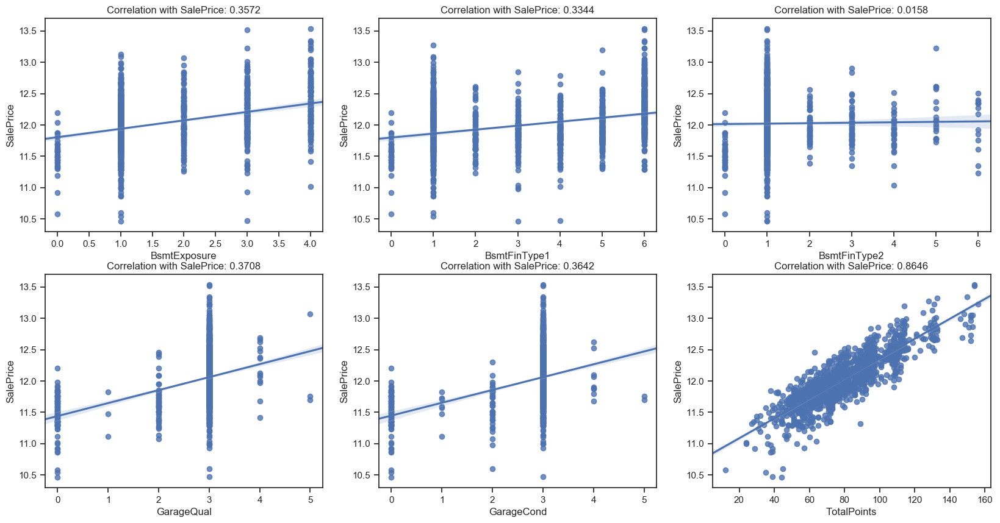

In [66]:
fig = plt.figure(figsize=(20,10))
fig1 = fig.add_subplot(231); sns.regplot(x='BsmtExposure', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.BsmtExposure.corr(df['SalePrice'])))

fig2 = fig.add_subplot(232); sns.regplot(x='BsmtFinType1', y='SalePrice', data=df);
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.BsmtFinType1.corr(df['SalePrice'])))

fig3 = fig.add_subplot(233); sns.regplot(x='BsmtFinType2', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.BsmtFinType2.corr(df['SalePrice'])))

fig4 = fig.add_subplot(234); sns.regplot(x='GarageQual', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.GarageQual.corr(df['SalePrice'])))

fig5 = fig.add_subplot(235); sns.regplot(x='GarageCond', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.GarageCond.corr(df['SalePrice'])))

fig6 = fig.add_subplot(236); sns.regplot(x='TotalPoints', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.TotalPoints.corr(df['SalePrice'])))
plt.show()

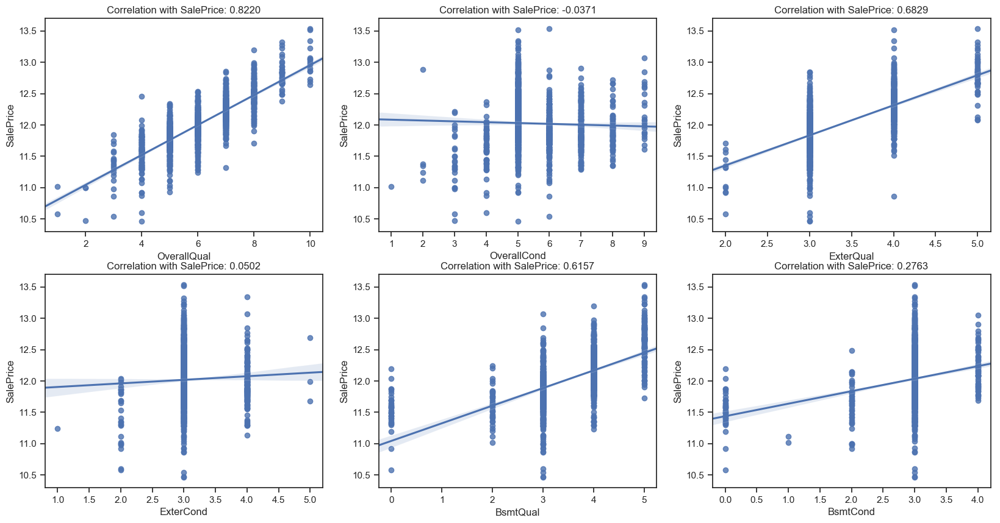

In [67]:
fig = plt.figure(figsize=(20,10))
fig1 = fig.add_subplot(231); sns.regplot(x='OverallQual', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.OverallQual.corr(df['SalePrice'])))

fig2 = fig.add_subplot(232); sns.regplot(x='OverallCond', y='SalePrice', data=df);
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.OverallCond.corr(df['SalePrice'])))

fig3 = fig.add_subplot(233); sns.regplot(x='ExterQual', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.ExterQual.corr(df['SalePrice'])))

fig4 = fig.add_subplot(234); sns.regplot(x='ExterCond', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.ExterCond.corr(df['SalePrice'])))

fig5 = fig.add_subplot(235); sns.regplot(x='BsmtQual', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.BsmtQual.corr(df['SalePrice'])))

fig6 = fig.add_subplot(236); sns.regplot(x='BsmtCond', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.BsmtCond.corr(df['SalePrice'])))
plt.show()

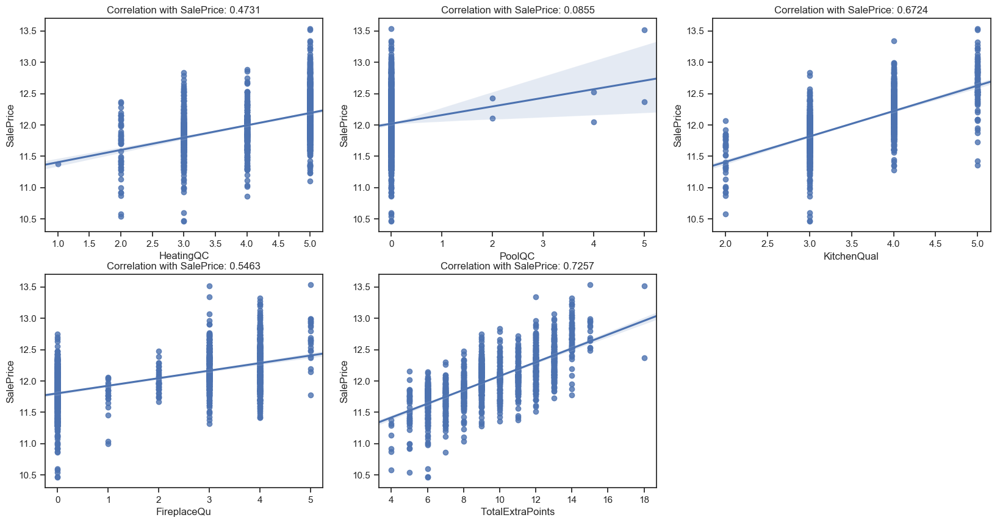

In [68]:
fig = plt.figure(figsize=(20,10))
fig1 = fig.add_subplot(231); sns.regplot(x='HeatingQC', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.HeatingQC.corr(df['SalePrice'])))

fig2 = fig.add_subplot(232); sns.regplot(x='PoolQC', y='SalePrice', data=df);
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.PoolQC.corr(df['SalePrice'])))

fig3 = fig.add_subplot(233); sns.regplot(x='KitchenQual', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.KitchenQual.corr(df['SalePrice'])))

fig4 = fig.add_subplot(234); sns.regplot(x='FireplaceQu', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.FireplaceQu.corr(df['SalePrice'])))

fig5 = fig.add_subplot(235); sns.regplot(x='TotalExtraPoints', y='SalePrice', data=df)
plt.title('Correlation with SalePrice: {:6.4f}'.format(df.TotalExtraPoints.corr(df['SalePrice'])))

plt.show()

In [69]:
all_data['GarageArea_x_Car'] = all_data.GarageArea * all_data.GarageCars

all_data['TotalBsmtSF_x_Bsm'] = all_data.TotalBsmtSF * all_data['1stFlrSF']

# We don´t have a feature with all construct area, maybe it is an interesting feature to create.
all_data['ConstructArea'] = (all_data.TotalBsmtSF + all_data.WoodDeckSF + all_data.GrLivArea +
                             all_data.OpenPorchSF + all_data.TSsnPorch + all_data.ScreenPorch + all_data.EnclosedPorch +
                             all_data.MasVnrArea + all_data.GarageArea + all_data.PoolArea )

#all_data['TotalArea'] = all_data.ConstructArea + all_data.LotArea

all_data['Garage_Newest'] = all_data.YearBuilt > all_data.GarageYrBlt
all_data.Garage_Newest =  all_data.Garage_Newest.apply(lambda x: 1 if x else 0)

all_data['TotalPorchSF'] = all_data.OpenPorchSF + all_data.EnclosedPorch + all_data.TSsnPorch + all_data.ScreenPorch + all_data.WoodDeckSF
all_data.EnclosedPorch = all_data.EnclosedPorch.apply(lambda x: 1 if x else 0)

all_data['LotAreaMultSlope'] = all_data.LotArea * all_data.LandSlope


all_data['BsmtSFPoints'] = (all_data.BsmtQual**2 + all_data.BsmtCond + all_data.BsmtExposure + 
                            all_data.BsmtFinType1 + all_data.BsmtFinType2)


all_data['BsmtSFMultPoints'] = all_data.TotalBsmtSF * (all_data.BsmtQual**2 + all_data.BsmtCond + all_data.BsmtExposure + 
                                                       all_data.BsmtFinType1 + all_data.BsmtFinType2)

all_data['TotBathrooms'] = all_data.FullBath + (all_data.HalfBath*0.5) + all_data.BsmtFullBath + (all_data.BsmtHalfBath*0.5)
all_data.FullBath = all_data.FullBath.apply(lambda x: 1 if x else 0)
all_data.HalfBath = all_data.HalfBath.apply(lambda x: 1 if x else 0)
all_data.BsmtFullBath = all_data.BsmtFullBath.apply(lambda x: 1 if x else 0)
all_data.BsmtHalfBath = all_data.BsmtHalfBath.apply(lambda x: 1 if x else 0)

In [70]:
def one_hot_encode(df):
    categorical_cols = df.select_dtypes(include=['object']).columns

    print(len(categorical_cols), "categorical columns")
    print(categorical_cols)
    # Remove special charactres and withe spaces. 
    for col in categorical_cols:
        df[col] = df[col].str.replace('\W', '').str.replace(' ', '_') #.str.lower()

    dummies = pd.get_dummies(df[categorical_cols], columns = categorical_cols).columns
    df = pd.get_dummies(df, columns = categorical_cols)

    print("Total Columns:",len(df.columns))
    print(df.info())
    
    return df, dummies

# Correct Categorical from int to str types
all_data.MSSubClass = all_data.MSSubClass.astype('str')
all_data.MoSold = all_data.MoSold.astype('str')

all_data, dummies = one_hot_encode(all_data)

23 categorical columns
Index(['MSSubClass', 'MSZoning', 'Alley', 'LandContour', 'LotConfig',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'Foundation', 'Heating', 'Electrical', 'GarageType', 'MiscFeature',
       'MoSold', 'SaleType', 'SaleCondition'],
      dtype='object')
Total Columns: 259
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2908 entries, 0 to 2907
Columns: 259 entries, LotFrontage to SaleCondition_Partial
dtypes: float64(15), int64(52), uint8(192)
memory usage: 2.0 MB
None


In [71]:
# Find Dummies with all test observatiosn are equal to 0
ZeroTest = all_data[dummies][ntrain:].sum()==0
all_data.drop(dummies[ZeroTest], axis=1, inplace=True)
print('Dummins in test dataset with all observatios equal to 0:',len(dummies[ZeroTest]),'of \n',dummies[ZeroTest],'\n')
dummies = dummies.drop(dummies[ZeroTest])

# Find dummies with all training observatiosn are equal to 0
ZeroTest = all_data[dummies][:ntrain].sum()==0
all_data.drop(dummies[ZeroTest], axis=1, inplace=True)
print('Dummins in trainig dataset with all observatios equal to 0:',len(dummies[ZeroTest]),'of \n',dummies[ZeroTest],'\n')
dummies = dummies.drop(dummies[ZeroTest])

del ZeroTest

Dummins in test dataset with all observatios equal to 0: 13 of 
 Index(['Condition2_RRAe', 'Condition2_RRAn', 'Condition2_RRNn',
       'HouseStyle_25Fin', 'RoofMatl_Membran', 'RoofMatl_Metal',
       'RoofMatl_Roll', 'Exterior1st_ImStucc', 'Exterior1st_Stone',
       'Exterior2nd_Other', 'Heating_Floor', 'Heating_OthW', 'Electrical_Mix'],
      dtype='object') 

Dummins in trainig dataset with all observatios equal to 0: 1 of 
 Index(['MSSubClass_150'], dtype='object') 



In [72]:
def AgeYears(feature): 
    return feature.apply(lambda x: 0 if x==0 else (2011 - x))

all_data.YearBuilt = AgeYears(all_data.YearBuilt)
all_data.YearRemodAdd = AgeYears(all_data.YearRemodAdd)
all_data.GarageYrBlt = AgeYears(all_data.GarageYrBlt) 
all_data.YrSold =  AgeYears(all_data.YrSold) 

In [73]:
all_data['Remod'] = 2
all_data.loc[(all_data.YearBuilt==all_data.YearRemodAdd), ['Remod']] = 0
all_data.loc[(all_data.YearBuilt!=all_data.YearRemodAdd), ['Remod']] = 1

all_data.Age = all_data.YearRemodAdd - all_data.YrSold # sice I convert both to age

all_data["IsNew"] = 2
all_data.loc[(all_data.YearBuilt==all_data.YrSold), ['IsNew']] = 1
all_data.loc[(all_data.YearBuilt!=all_data.YrSold), ['IsNew']] = 0

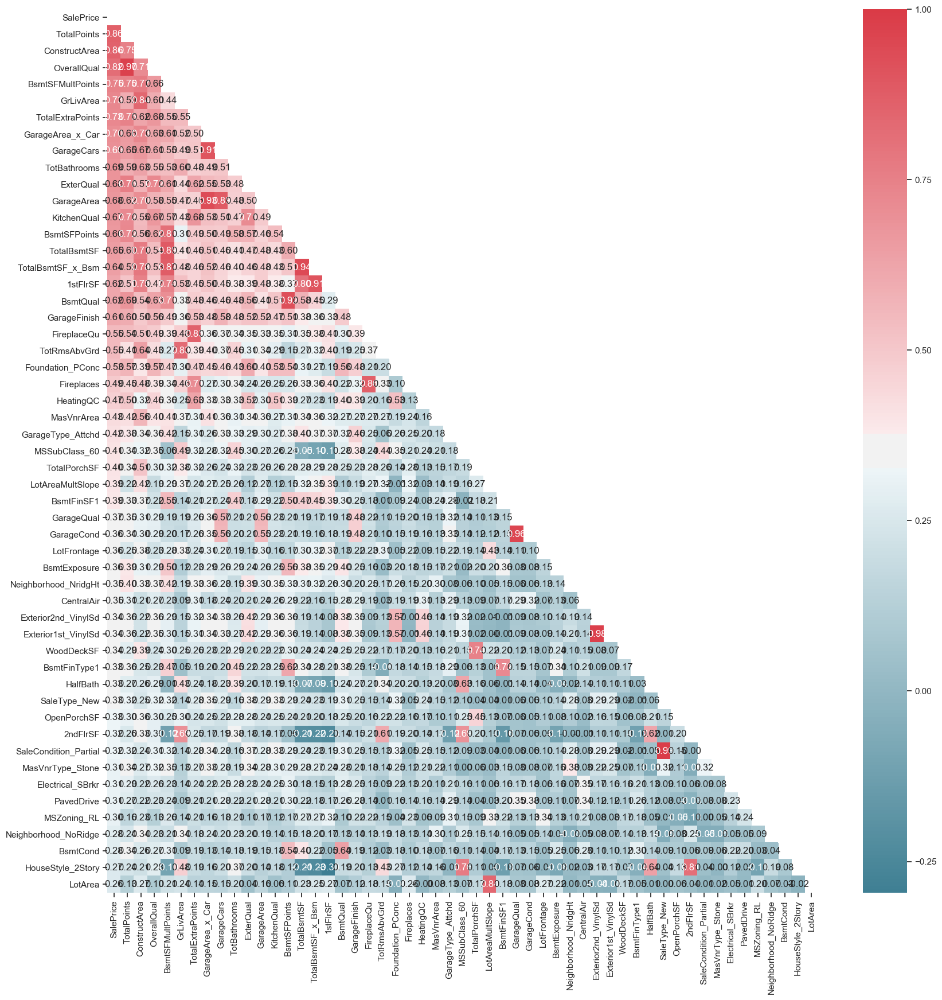

In [74]:
#Check for correlation between values
corr = all_data[all_data.SalePrice>1].corr()
top_corr_cols = corr[abs((corr.SalePrice)>=.26)].SalePrice.sort_values(ascending=False).keys()
top_corr = corr.loc[top_corr_cols, top_corr_cols]
dropSelf = np.zeros_like(top_corr)
dropSelf[np.triu_indices_from(dropSelf)] = True
plt.figure(figsize=(20, 20))
sns.heatmap(top_corr, cmap=sns.diverging_palette(220, 10, as_cmap=True), annot=True, fmt=".2f", mask=dropSelf)
sns.set(font_scale=0.5)
plt.show()
del corr, dropSelf, top_corr

In [75]:
all_data.drop(['FireplaceQu', 'BsmtSFPoints', 'TotalBsmtSF', 'GarageArea', 'GarageCars', 'OverallQual', 'GrLivArea', 
               'TotalBsmtSF_x_Bsm', '1stFlrSF', 'PoolArea', 'LotArea', 'SaleCondition_Partial', 'Exterior1st_VinylSd',
               'GarageCond', 'HouseStyle_2Story', 'BsmtSFMultPoints', 'ScreenPorch', 'LowQualFinSF', 'BsmtFinSF2',
               'TSsnPorch'], axis=1, inplace=True) 

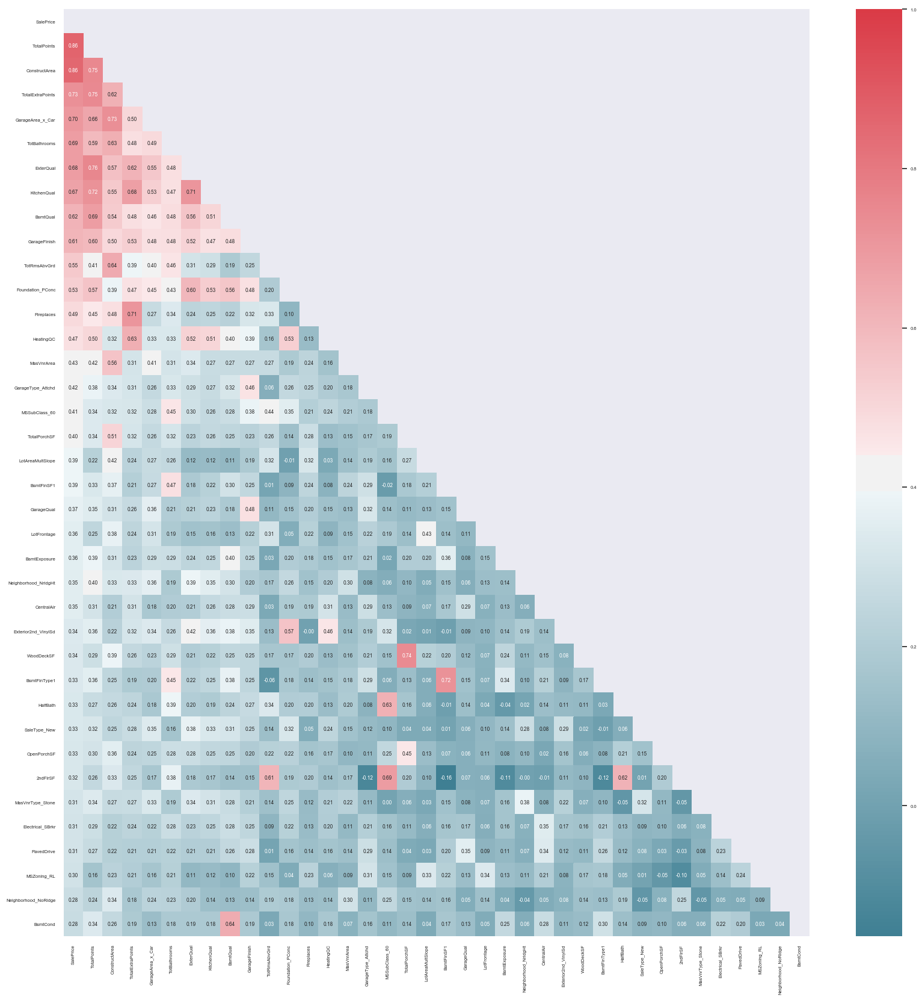

In [76]:
corr = all_data[all_data.SalePrice>1].corr()
top_corr_cols = corr[abs((corr.SalePrice)>=.26)].SalePrice.sort_values(ascending=False).keys()
top_corr = corr.loc[top_corr_cols, top_corr_cols]
dropSelf = np.zeros_like(top_corr)
dropSelf[np.triu_indices_from(dropSelf)] = True
plt.figure(figsize=(20, 20))
sns.heatmap(top_corr, cmap=sns.diverging_palette(220, 10, as_cmap=True), annot=True, fmt=".2f", mask=dropSelf)
sns.set(font_scale=0.5)
plt.show()
del corr, dropSelf, top_corr

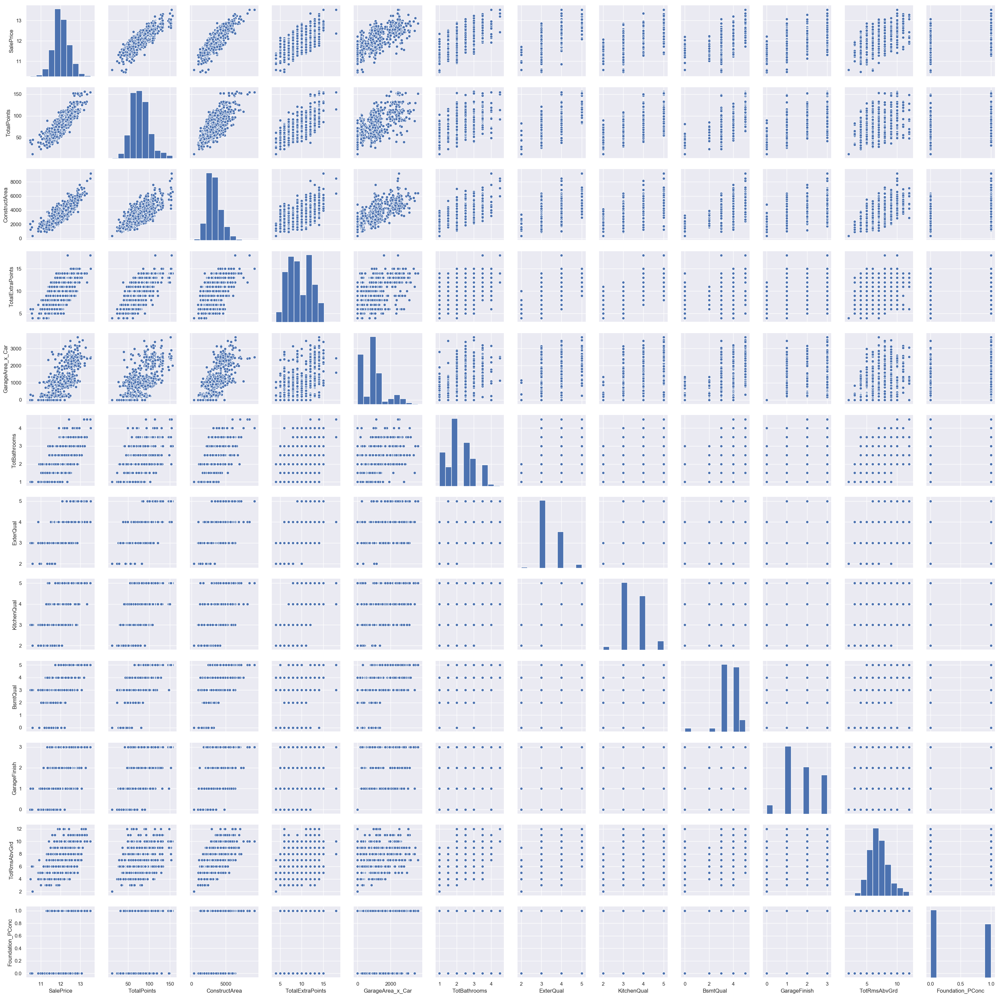

In [77]:
sns.set(font_scale=1.0)
g = sns.pairplot(all_data.loc[all_data.SalePrice>0, top_corr_cols[:12]])

In [78]:
all_data.rename(columns={'2ndFlrSF':'SndFlrSF'}, inplace=True)

def VRF(predict, data, y):
   
    scale = StandardScaler(with_std=False)
    df = pd.DataFrame(scale.fit_transform(data), columns= cols)
    features = "+".join(cols)
    df['SalePrice'] = y.values
    
    formula = predict + ' ~ ' + features

    # get y and X dataframes based on this regression:
    y, X = dmatrices(formula, data = df, return_type='dataframe')

   # Calculate VIF Factors
    # For each X, calculate VIF and save in dataframe
    vif = pd.DataFrame()
    vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif["features"] = X.columns

    # Inspect VIF Factors
    display(vif.sort_values('VIF Factor'))
    return vif

# Remove the higest correlations and run a multiple regression
cols = all_data.columns
cols = cols.drop(['SalePrice'])
vif = VRF('SalePrice', all_data.loc[all_data.SalePrice>0, cols], all_data.SalePrice[all_data.SalePrice>0])

,VIF Factor,features
0,1.000,Intercept
41,1.267,YrSold
39,1.462,Fence
22,1.529,BsmtHalfBath
10,1.530,ExterCond
29,1.553,Functional
120,1.572,Condition2_PosN
2,1.582,Street
23,1.644,FullBath
3,1.733,LotShape


In [79]:
# Remove one feature with VIF on Inf from the same category and run a multiple regression
cols = cols.drop(['Condition1_PosN', 'Neighborhood_NWAmes', 'Exterior1st_CBlock', 'BldgType_1Fam', 'RoofStyle_Flat',
                  'MSZoning_Call', 'Alley_Grvl', 'LandContour_Bnk', 'LotConfig_Corner', 'GarageType_2Types', 'MSSubClass_45',
                  'MasVnrType_BrkCmn', 'Foundation_CBlock', 'MiscFeature_Gar2', 'SaleType_COD', 'Exterior2nd_CBlock'])

vif = VRF('SalePrice', all_data.loc[all_data.SalePrice>0, cols], all_data.SalePrice[all_data.SalePrice>0])

,VIF Factor,features
0,1.000,Intercept
165,1.191,Foundation_Wood
197,1.196,SaleType_Con
202,1.216,SaleType_Oth
75,1.222,LotConfig_FR3
107,1.235,Condition1_RRNe
196,1.256,SaleType_CWD
41,1.265,YrSold
78,1.273,Neighborhood_Blueste
199,1.277,SaleType_ConLI


In [80]:
# Remove one feature with highest VIF from the same category and run a multiple regression
cols = cols.drop(['PoolQC', 'BldgType_TwnhsE', 'BsmtFinSF1', 'BsmtUnfSF', 'Electrical_SBrkr', 'Exterior1st_MetalSd',
                  'Exterior2nd_VinylSd', 'GarageQual', 'GarageType_Attchd', 'HouseStyle_1Story', 'MasVnrType_None',
                  'MiscFeature_NA', 'MSZoning_RL', 'RoofStyle_Gable', 'SaleCondition_Normal', 'MoSold_10',
                  'SaleType_New', 'SndFlrSF', 'TotalPorchSF', 'WoodDeckSF', 'BldgType_Duplex', 'MSSubClass_90'])
              
vif = VRF('SalePrice', all_data.loc[all_data.SalePrice>0, cols], all_data.SalePrice[all_data.SalePrice>0])

,VIF Factor,features
0,1.000,Intercept
186,1.134,SaleCondition_Family
177,1.151,SaleType_Con
181,1.162,SaleType_Oth
179,1.167,SaleType_ConLI
149,1.169,Foundation_Wood
176,1.175,SaleType_CWD
66,1.213,LotConfig_FR3
35,1.229,YrSold
98,1.229,Condition1_RRNe


In [82]:
#Defining Categorical and Boolean Data as unit8 types

# Reserve a copy for futer analysis:
df_copy = all_data[all_data.SalePrice>0].copy()

all_data.CentralAir = all_data.CentralAir.astype('uint8')
all_data.Garage_Newest = all_data.Garage_Newest.astype('uint8')
all_data.EnclosedPorch = all_data.EnclosedPorch.astype('uint8')
all_data.FullBath = all_data.FullBath.astype('uint8')
all_data.HalfBath = all_data.HalfBath.astype('uint8')
all_data.BsmtFullBath = all_data.BsmtFullBath.astype('uint8')
all_data.BsmtHalfBath = all_data.BsmtHalfBath.astype('uint8')
all_data.Remod = all_data.Remod.astype('uint8')
all_data.IsNew = all_data.IsNew.astype('uint8') 
all_data.Street = all_data.Street.astype('uint8') # orinal
all_data.PavedDrive = all_data.PavedDrive.astype('uint8') # ordinal
all_data.Functional = all_data.Functional.astype('uint8') # ordinal
all_data.LandSlope = all_data.LandSlope.astype('uint8') # ordinal


#for feat in cols:
#   if all_data[feat].dtype=='uint8':
#       all_data[feat] = all_data[feat].astype('category')

In [83]:
numeric_features = list(all_data.loc[:, cols].dtypes[(all_data.dtypes != "category") & (all_data.dtypes !='uint8')].index)

'''
with warnings.catch_warnings():
    warnings.simplefilter("ignore", category=RuntimeWarning)
'''
skewed_features = all_data[numeric_features].apply(lambda x : skew (x.dropna())).sort_values(ascending=False)

#compute skewness
skewness = pd.DataFrame({'Skew' :skewed_features})   

# Get only higest skewed features
skewness = skewness[abs(skewness) > 0.7]
skewness = skewness.dropna()
print ("There are {} higest skewed numerical features to box cox transform".format(skewness.shape[0]))

l_opt = {}

for feat in skewness.index:
    all_data[feat], l_opt[feat] = boxcox((all_data[feat]+1))

skewed_features2 = all_data[skewness.index].apply(lambda x : skew (x.dropna())).sort_values(ascending=False)

#compute skewness
skewness2 = pd.DataFrame({'New Skew' :skewed_features2})   
display(pd.concat([skewness, skewness2], axis=1).sort_values(by=['Skew'], ascending=False))

There are 18 higest skewed numerical features to box cox transform


,Skew,New Skew
MiscVal,21.750,4.772
KitchenAbvGr,4.349,-2.059
LotAreaMultSlope,3.494,0.136
BsmtFinType2,3.147,-0.434
MasVnrArea,2.622,0.457
OpenPorchSF,2.529,-0.025
Fence,1.751,1.533
GarageArea_x_Car,1.354,-0.132
ExterCond,1.313,-0.036
LotFrontage,1.231,0.171


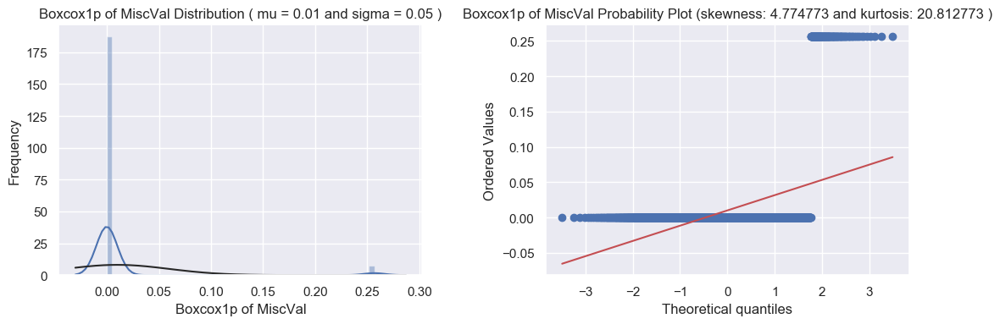

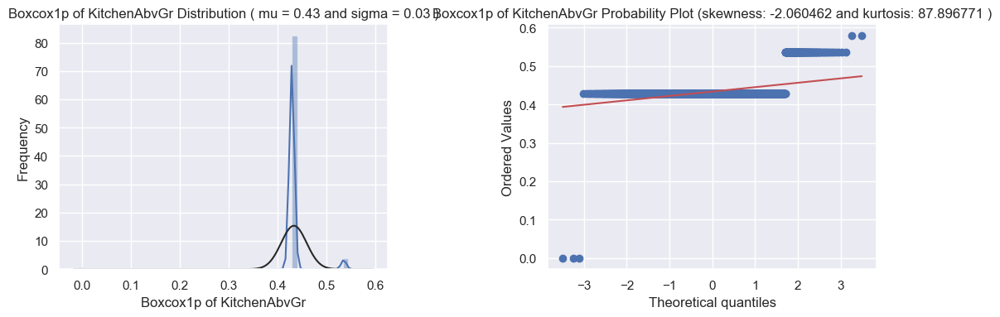

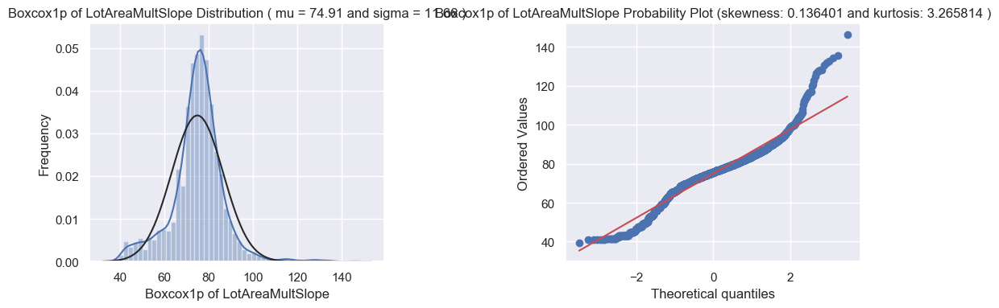

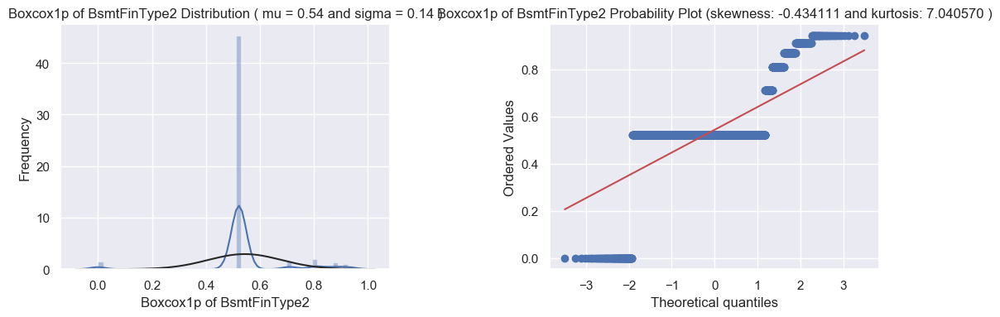

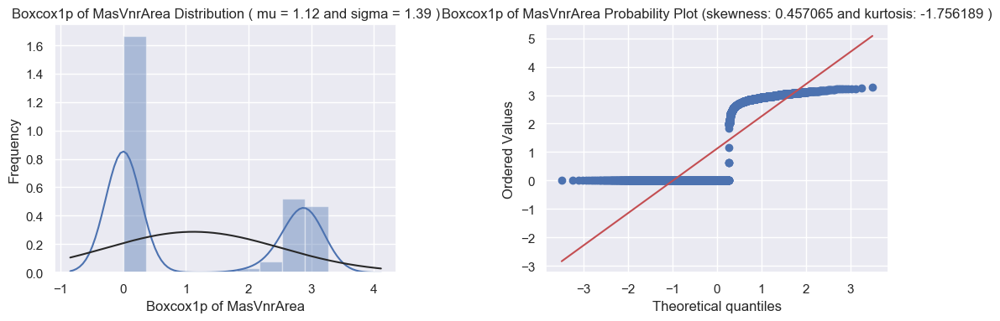

...

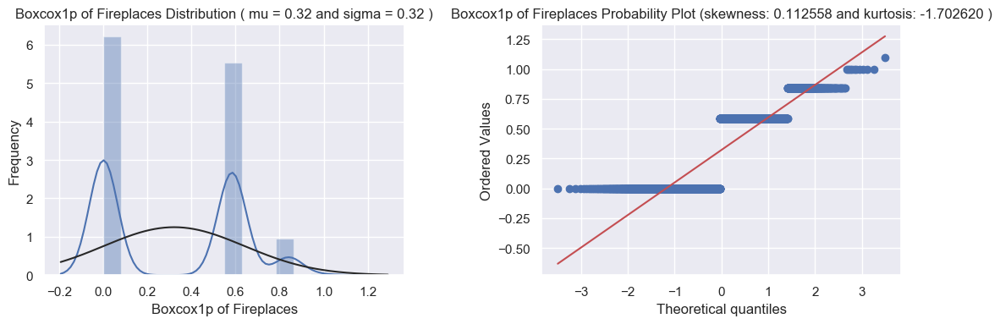

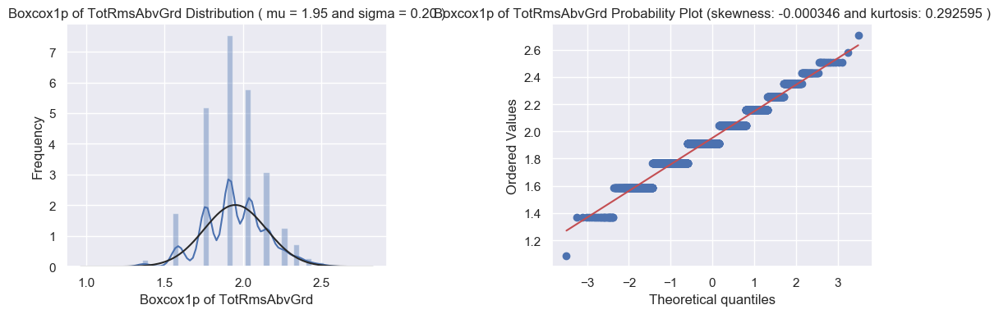

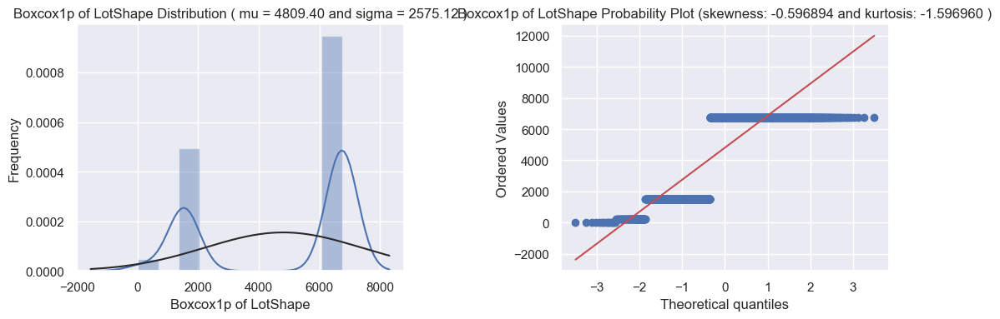

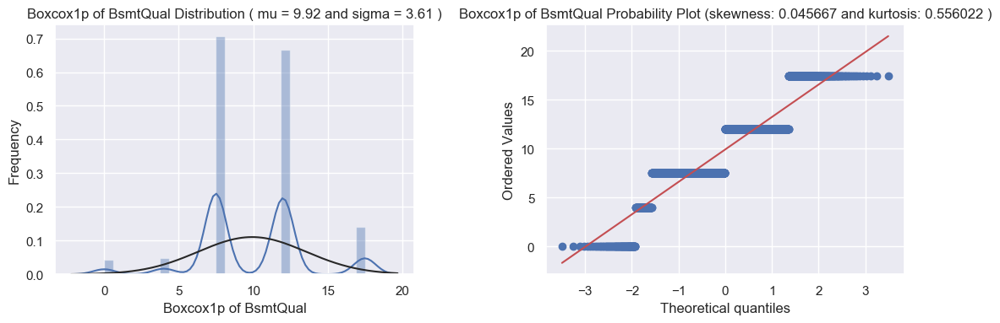

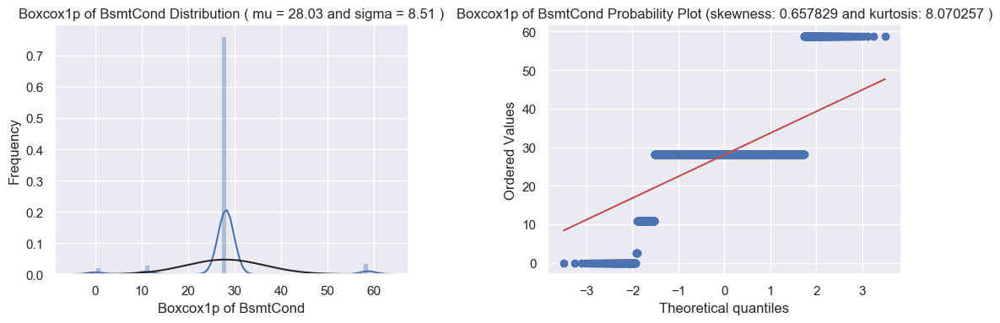

In [84]:
def QQ_plot(data, measure):
    fig = plt.figure(figsize=(12,4))

    #Get the fitted parameters used by the function
    (mu, sigma) = norm.fit(data)

    #Kernel Density plot
    fig1 = fig.add_subplot(121)
    sns.distplot(data, fit=norm)
    fig1.set_title(measure + ' Distribution ( mu = {:.2f} and sigma = {:.2f} )'.format(mu, sigma), loc='center')
    fig1.set_xlabel(measure)
    fig1.set_ylabel('Frequency')

    #QQ plot
    fig2 = fig.add_subplot(122)
    res = probplot(data, plot=fig2)
    fig2.set_title(measure + ' Probability Plot (skewness: {:.6f} and kurtosis: {:.6f} )'.\
                   format(data.skew(), data.kurt()), loc='center')

    plt.tight_layout()
    plt.show()
    
for feat in skewness.index:
    QQ_plot(all_data[feat], ('Boxcox1p of {}'.format(feat)))

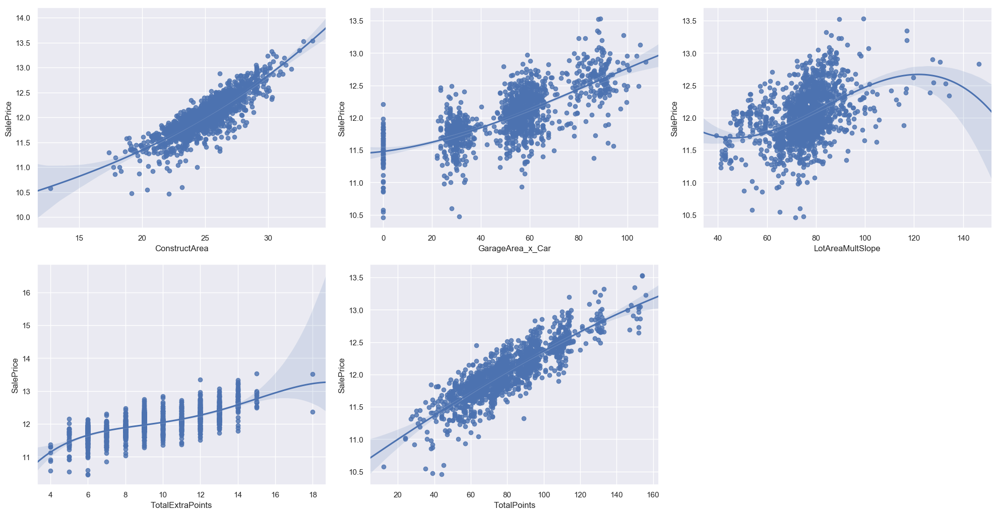

In [85]:
fig = plt.figure(figsize=(20,15)) 
ax = fig.add_subplot(331); g = sns.regplot(y='SalePrice', x='ConstructArea', data = all_data[all_data.SalePrice>0], order=3) 
ax = fig.add_subplot(332); g = sns.regplot(y='SalePrice', x='GarageArea_x_Car', data = all_data[all_data.SalePrice>0], order=3)
ax = fig.add_subplot(333); g = sns.regplot(y='SalePrice', x='LotAreaMultSlope', data = all_data[all_data.SalePrice>0], order=3) 
ax = fig.add_subplot(334); g = sns.regplot(y='SalePrice', x='TotalExtraPoints', data = all_data[all_data.SalePrice>0], order=4) 
ax = fig.add_subplot(335); g = sns.regplot(y='SalePrice', x='TotalPoints', data = all_data[all_data.SalePrice>0], order=3) 

plt.tight_layout() 

In [86]:
def poly(X, y, feat=''):

    # Initializatin of regression models
    regr = LinearRegression()
    regr = regr.fit(X, y)
    y_lin_fit = regr.predict(X)
    linear_r2 = r2_score(y, regr.predict(X))

    # create polynomial features
    quadratic = PolynomialFeatures(degree=2, interaction_only=False, include_bias=False)
    cubic = PolynomialFeatures(degree=3, interaction_only=False, include_bias=False)
    fourth = PolynomialFeatures(degree=4, interaction_only=False, include_bias=False)
    fifth = PolynomialFeatures(degree=5, interaction_only=False, include_bias=False)
    X_quad = quadratic.fit_transform(X)
    X_cubic = cubic.fit_transform(X)
    X_fourth = fourth.fit_transform(X)
    X_fifth = fifth.fit_transform(X)

    # quadratic fit
    regr = regr.fit(X_quad, y)
    y_quad_fit = regr.predict(quadratic.fit_transform(X))
    quadratic_r2 = r2_score(y, y_quad_fit)

    # cubic fit
    regr = regr.fit(X_cubic, y)
    y_cubic_fit = regr.predict(cubic.fit_transform(X))
    cubic_r2 = r2_score(y, y_cubic_fit)

    # Fourth fit
    regr = regr.fit(X_fourth, y)
    y_fourth_fit = regr.predict(fourth.fit_transform(X))
    four_r2 = r2_score(y, y_fourth_fit)

    # Fifth fit
    regr = regr.fit(X_fifth, y)
    y_fifth_fit = regr.predict(fifth.fit_transform(X))
    five_r2 = r2_score(y, y_fifth_fit)
    
    if len(feat)>0:
        fig = plt.figure(figsize=(20,5))
        # Plot lowest Polynomials
        fig1 = fig.add_subplot(121)
        plt.scatter(X[feat], y, label='training points', color='lightgray')
        plt.plot(X[feat], y_lin_fit, label='linear (d=1), $R^2=%.3f$' % linear_r2, color='blue', lw=0.5, linestyle=':')
        plt.plot(X[feat], y_quad_fit, label='quadratic (d=2), $R^2=%.3f$' % quadratic_r2, color='red', lw=0.5, linestyle='-')
        plt.plot(X[feat], y_cubic_fit, label='cubic (d=3), $R^2=%.3f$' % cubic_r2,  color='green', lw=0.5, linestyle='--')

        plt.xlabel(feat)
        plt.ylabel('Sale Price')
        plt.legend(loc='upper left')

        # Plot higest Polynomials
        fig2 = fig.add_subplot(122)
        plt.scatter(X[feat], y, label='training points', color='lightgray')
        plt.plot(X[feat], y_lin_fit, label='linear (d=1), $R^2=%.3f$' % linear_r2, color='blue', lw=2, linestyle=':')
        plt.plot(X[feat], y_fifth_fit, label='Fifth (d=5), $R^2=%.3f$' % five_r2, color='yellow', lw=2, linestyle='-')
        plt.plot(X[feat], y_fifth_fit, label='Fourth (d=4), $R^2=%.3f$' % four_r2, color='red', lw=2, linestyle=':')

        plt.xlabel(feat)
        plt.ylabel('Sale Price')
        plt.legend(loc='upper left')
    else:
        # Plot initialisation
        fig = plt.figure(figsize=(20,10))
        ax = fig.add_subplot(121, projection='3d')
        ax.scatter(X.iloc[:, 0], X.iloc[:, 1], y, s=40)

        # make lines of the regressors:
        plt.plot(X.iloc[:, 0], X.iloc[:, 1], y_lin_fit, label='linear (d=1), $R^2=%.3f$' % linear_r2, 
                 color='blue', lw=2, linestyle=':')
        plt.plot(X.iloc[:, 0], X.iloc[:, 1], y_quad_fit, label='quadratic (d=2), $R^2=%.3f$' % quadratic_r2, 
                 color='red', lw=0.5, linestyle='-')
        plt.plot(X.iloc[:, 0], X.iloc[:, 1], y_cubic_fit, label='cubic (d=3), $R^2=%.3f$' % cubic_r2, 
                 color='green', lw=0.5, linestyle='--')
        # label the axes
        ax.set_xlabel(X.columns[0])
        ax.set_ylabel(X.columns[1])
        ax.set_zlabel('Sales Price')
        ax.set_title("Poly up to 3 degree")
        plt.legend(loc='upper left')

    plt.tight_layout()
    plt.show()

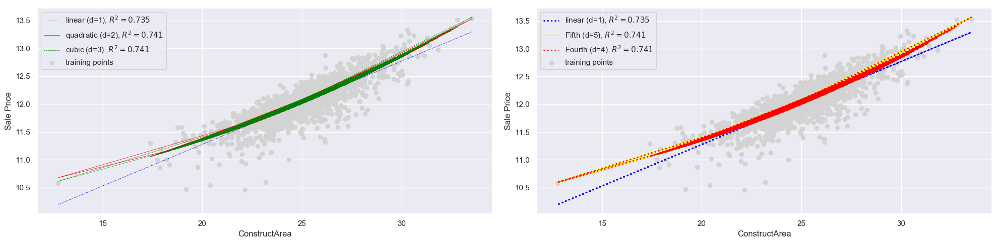

In [88]:
y = all_data.SalePrice[all_data.SalePrice>0]
X = all_data.loc[all_data.SalePrice>0, ['ConstructArea']] 
poly(X, y, 'ConstructArea')

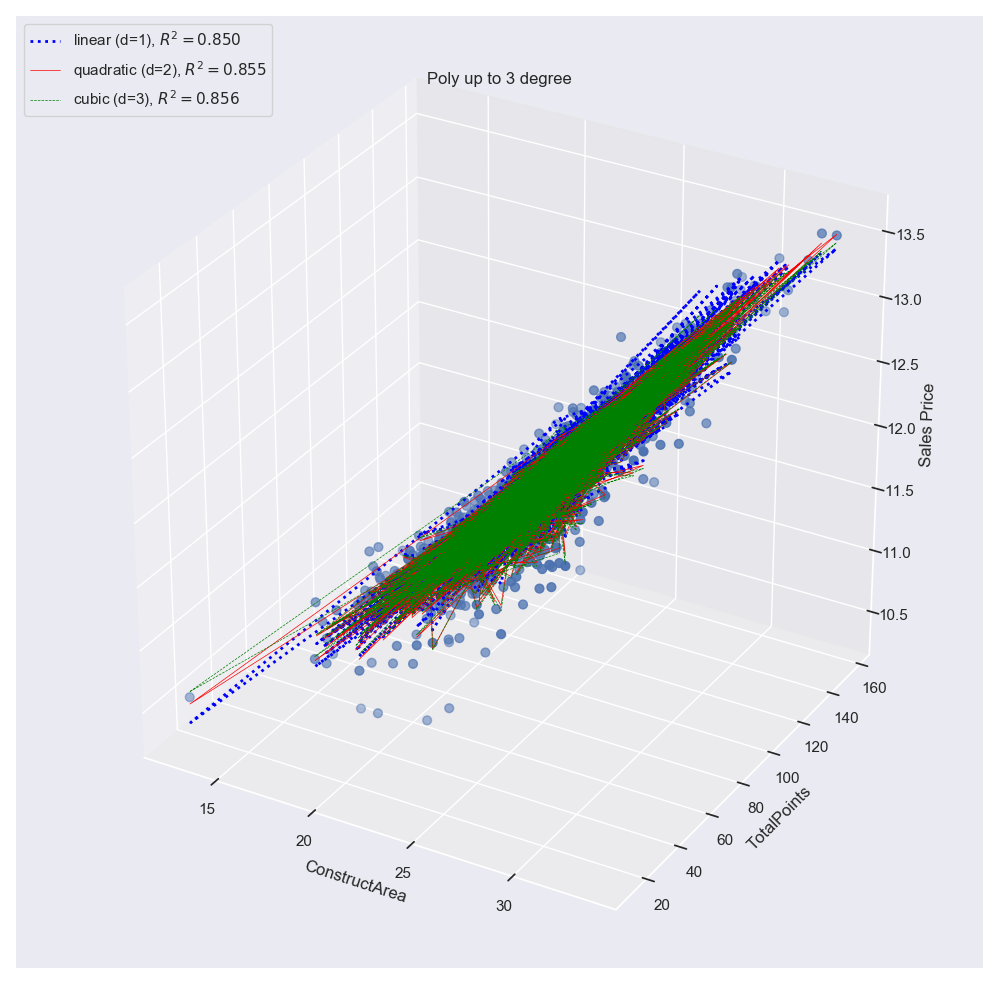

In [89]:
X = all_data.loc[all_data.SalePrice>0, ['ConstructArea', 'TotalPoints']] 
poly(X, y)

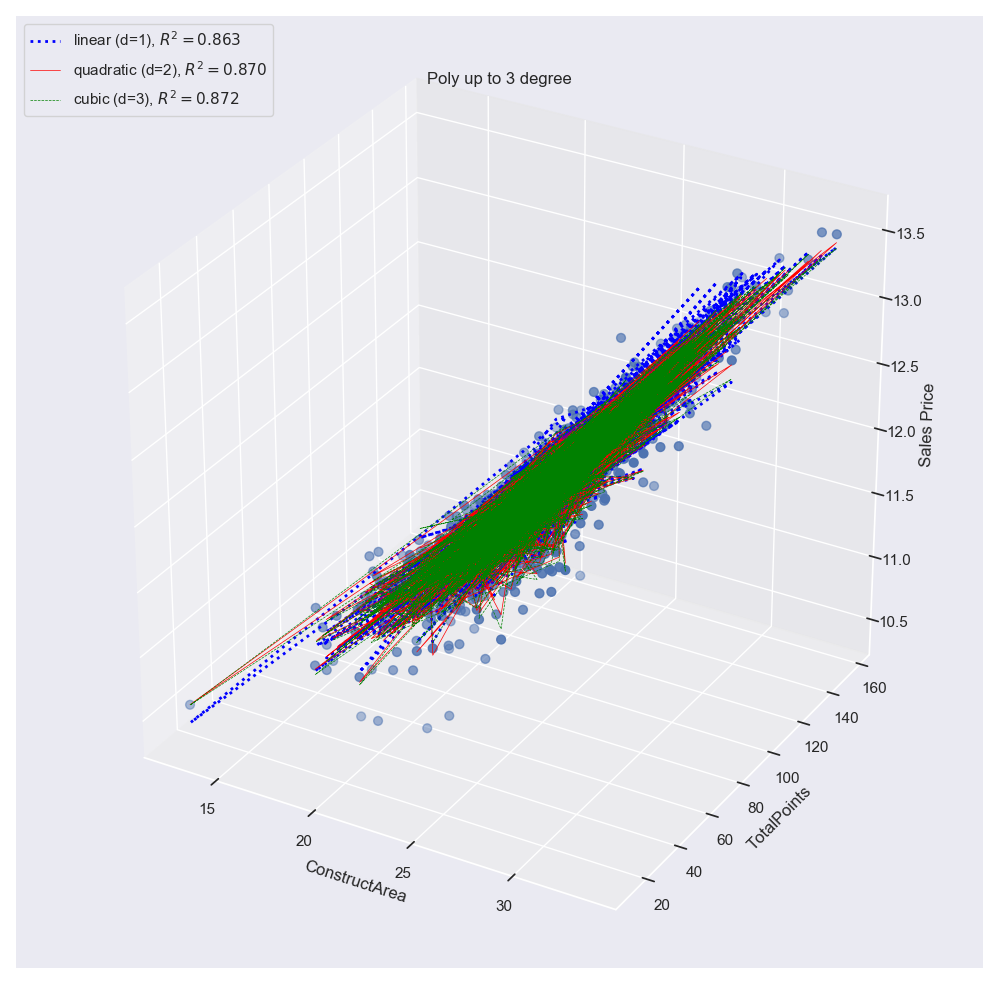

In [90]:
X = all_data.loc[all_data.SalePrice>0, ['ConstructArea', 'TotalPoints', 'LotAreaMultSlope',  'GarageArea_x_Car']] 
poly(X, y)

In [91]:
poly_cols = ['ConstructArea', 'TotalPoints', 'LotAreaMultSlope',  'GarageArea_x_Car']

pf = PolynomialFeatures(degree=3, interaction_only=False, include_bias=False)
res = pf.fit_transform(all_data.loc[:, poly_cols])

target_feature_names = [feat.replace(' ','_') for feat in pf.get_feature_names(poly_cols)]
output_df = pd.DataFrame(res, columns = target_feature_names,  index=all_data.index).iloc[:, len(poly_cols):]
print('Polynomial Features included:', output_df.shape[1])
display(output_df.head())
all_data = pd.concat([all_data, output_df], axis=1)
print('Total Features after Polynomial Features included:', all_data.shape[1])
colsP = output_df.columns

del output_df, target_feature_names, res, pf

Polynomial Features included: 30


,ConstructArea^2,ConstructArea_TotalPoints,ConstructArea_LotAreaMultSlope,ConstructArea_GarageArea_x_Car,TotalPoints^2,TotalPoints_LotAreaMultSlope,TotalPoints_GarageArea_x_Car,LotAreaMultSlope^2,LotAreaMultSlope_GarageArea_x_Car,GarageArea_x_Car^2,...,TotalPoints^3,TotalPoints^2_LotAreaMultSlope,TotalPoints^2_GarageArea_x_Car,TotalPoints_LotAreaMultSlope^2,TotalPoints_LotAreaMultSlope_GarageArea_x_Car,TotalPoints_GarageArea_x_Car^2,LotAreaMultSlope^3,LotAreaMultSlope^2_GarageArea_x_Car,LotAreaMultSlope_GarageArea_x_Car^2,GarageArea_x_Car^3
0,644.889,2310.915,1862.103,1501.104,8281.000,6672.716,5379.101,5376.782,4334.406,3494.111,...,753571.000,607217.120,489498.214,489287.181,394430.910,317964.069,394260.863,317826.988,256211.062,206540.384
1,635.245,2117.141,1926.779,1364.704,7056.000,6421.560,4548.281,5844.166,4139.323,2931.812,...,592704.000,539411.078,382055.640,490909.983,347703.144,246272.190,446769.860,316439.450,224128.650,158746.489
2,660.557,2441.625,2069.062,1600.247,9025.000,7647.893,5915.007,6480.916,5012.447,3876.710,...,857375.000,726549.806,561925.652,615686.976,476182.503,368287.434,521740.490,403522.735,312091.166,241376.476
3,650.361,2346.201,1946.249,1996.519,8464.000,7021.162,7202.510,5824.280,5974.715,6129.035,...,778688.000,645946.859,662630.937,535833.794,549673.775,563871.227,444491.447,455972.159,467749.404,479830.843
4,786.236,3112.429,2438.275,2502.183,12321.000,9652.265,9905.251,7561.580,7759.769,7963.153,...,1367631.000,1071401.447,1099482.892,839335.362,861334.352,883909.936,657534.906,674768.904,692454.605,710603.849


Total Features after Polynomial Features included: 257


In [92]:
y_train = (all_data.SalePrice[all_data.SalePrice>0].reset_index(drop=True, inplace=False))

# Data with Polynomials
train = all_data.loc[(all_data.SalePrice>0), cols].reset_index(drop=True, inplace=False)
test = all_data.loc[(all_data.SalePrice==0), cols].reset_index(drop=True, inplace=False)

In [93]:
scale = RobustScaler()
# Data without Polynomials
df = pd.DataFrame(scale.fit_transform(train[cols]), columns= cols)

In [94]:
ln_model=sm.OLS(y_train,df)
result=ln_model.fit()
print(result.summary2())

                    Results: Ordinary least squares
Model:                 OLS               Adj. R-squared:      0.994    
Dependent Variable:    SalePrice         AIC:                 3961.2009
Date:                  2019-06-24 00:15  BIC:                 4953.5832
No. Observations:      1449              Log-Likelihood:      -1792.6  
Df Model:              188               F-statistic:         1390.    
Df Residuals:          1261              Prob (F-statistic):  0.00     
R-squared:             0.995             Scale:               0.79880  
-----------------------------------------------------------------------
                       Coef.  Std.Err.    t     P>|t|   [0.025   0.975]
-----------------------------------------------------------------------
LotFrontage            0.0392   0.0353   1.1124 0.2662  -0.0300  0.1084
Street                -1.6017   0.4800  -3.3368 0.0009  -2.5435 -0.6600
LotShape              -0.0556   0.0611  -0.9096 0.3632  -0.1754  0.0643
LandSlope   

In [95]:
pv_cols = cols.values

def backwardElimination(x, Y, sl, columns):
    ini = len(columns)
    numVars = x.shape[1]
    for i in range(0, numVars):
        regressor = sm.OLS(Y, x).fit()
        maxVar = max(regressor.pvalues) #.astype(float)
        if maxVar > sl:
            for j in range(0, numVars - i):
                if (regressor.pvalues[j].astype(float) == maxVar):
                    columns = np.delete(columns, j)
                    x = x.loc[:, columns]
                    
    print('\nSelect {:d} features from {:d} by best p-values.'.format(len(columns), ini))
    print('The max p-value from the features selecte is {:.3f}.'.format(maxVar))
    print(regressor.summary())
    
    # odds ratios and 95% CI
    conf = np.exp(regressor.conf_int())
    conf['Odds Ratios'] = np.exp(regressor.params)
    conf.columns = ['2.5%', '97.5%', 'Odds Ratios']
    display(conf)
    
    return columns, regressor

SL = 0.051

pv_cols, LR = backwardElimination(df, y_train, SL, pv_cols)


Select 107 features from 188 by best p-values.
The max p-value from the features selecte is 0.050.
                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.995
Model:                            OLS   Adj. R-squared:                  0.995
Method:                 Least Squares   F-statistic:                     2454.
Date:                Mon, 24 Jun 2019   Prob (F-statistic):               0.00
Time:                        00:15:49   Log-Likelihood:                -1833.9
No. Observations:                1449   AIC:                             3882.
Df Residuals:                    1342   BIC:                             4447.
Df Model:                         107                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------

,2.5%,97.5%,Odds Ratios
Street,0.067,0.376,0.158
LandSlope,1.052,1.592,1.294
OverallCond,1.127,1.262,1.193
YearBuilt,0.277,0.446,0.352
YearRemodAdd,1.213,1.649,1.414
BsmtQual,0.658,0.827,0.738
BsmtExposure,1.066,1.245,1.152
BsmtFinType1,0.725,0.976,0.841
HeatingQC,0.254,0.379,0.310
BsmtHalfBath,1.059,1.623,1.311


Fvalue: 2453.619954
MSE total on the train data: 144.7138


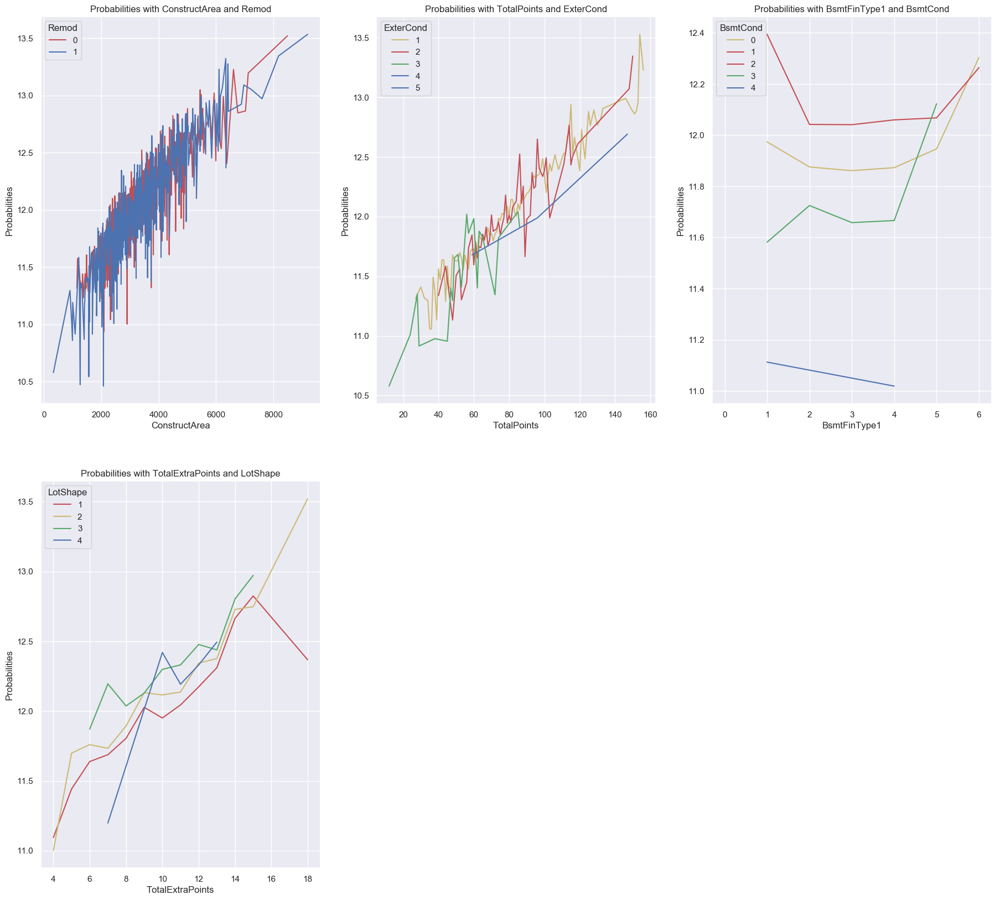

In [96]:
pred = LR.predict(df[pv_cols])

df_copy['proba'] = pred

y_pred = pred.apply(lambda x: 1 if x > 0.5 else 0)

print('Fvalue: {:.6f}'.format(LR.fvalue))
print('MSE total on the train data: {:.4f}'.format(LR.mse_total))
def plot_proba(continous, predict, discret, data):
    grouped = pd.pivot_table(data, values=[predict], index=[continous, discret], aggfunc=np.mean)
    colors = 'rbgyrbgy'
    for col in data[discret].unique():
        plt_data = grouped.ix[grouped.index.get_level_values(1)==col]
        plt.plot(plt_data.index.get_level_values(0), plt_data[predict], color=colors[int(col)])
    plt.xlabel(continous)
    plt.ylabel("Probabilities")
    plt.legend(np.sort(data[discret].unique()), loc='upper left', title=discret)
    plt.title("Probabilities with " + continous + " and " + discret)

fig = plt.figure(figsize=(30, 20))
ax = fig.add_subplot(241); plot_proba('ConstructArea', 'SalePrice', 'Remod', df_copy)
ax = fig.add_subplot(242); plot_proba('TotalPoints', 'SalePrice', 'ExterCond', df_copy)
ax = fig.add_subplot(243); plot_proba('BsmtFinType1', 'SalePrice', 'BsmtCond', df_copy)
ax = fig.add_subplot(245); plot_proba('TotalExtraPoints', 'SalePrice', 'LotShape', df_copy)

plt.show()
del df_copy

In [97]:
ls = Lasso(alpha = 0.0005, max_iter = 161, selection = 'cyclic', tol = 0.002, random_state = 101)
rfecv = RFECV(estimator=ls, n_jobs = -1, step=1, scoring = 'neg_mean_squared_error' ,cv=5)
rfecv.fit(df, y_train)

select_features_rfecv = rfecv.get_support()
RFEcv = cols[select_features_rfecv]
print('{:d} Features Select by RFEcv:\n{:}'.format(rfecv.n_features_, RFEcv.values))

79 Features Select by RFEcv:
['LotFrontage' 'LandSlope' 'OverallCond' 'YearBuilt' 'YearRemodAdd'
 'MasVnrArea' 'BsmtQual' 'BsmtCond' 'BsmtFinType1' 'BsmtFinType2'
 'HeatingQC' 'CentralAir' 'BsmtHalfBath' 'HalfBath' 'BedroomAbvGr'
 'KitchenQual' 'TotRmsAbvGrd' 'Functional' 'Fireplaces' 'GarageFinish'
 'PavedDrive' 'OpenPorchSF' 'EnclosedPorch' 'YrSold' 'TotalPoints'
 'GarageArea_x_Car' 'ConstructArea' 'LotAreaMultSlope' 'TotBathrooms'
 'MSSubClass_160' 'MSSubClass_20' 'MSSubClass_30' 'MSSubClass_50'
 'MSSubClass_70' 'MSZoning_FV' 'MSZoning_RM' 'Alley_Pave'
 'LandContour_Lvl' 'LotConfig_CulDSac' 'LotConfig_FR2'
 'Neighborhood_BrkSide' 'Neighborhood_ClearCr' 'Neighborhood_CollgCr'
 'Neighborhood_Crawfor' 'Neighborhood_Edwards' 'Neighborhood_IDOTRR'
 'Neighborhood_MeadowV' 'Neighborhood_Mitchel' 'Neighborhood_NoRidge'
 'Neighborhood_NridgHt' 'Neighborhood_OldTown' 'Neighborhood_Somerst'
 'Neighborhood_StoneBr' 'Condition1_Artery' 'Condition1_Norm'
 'Condition1_RRAe' 'RoofStyle_Hip' 'Exteri

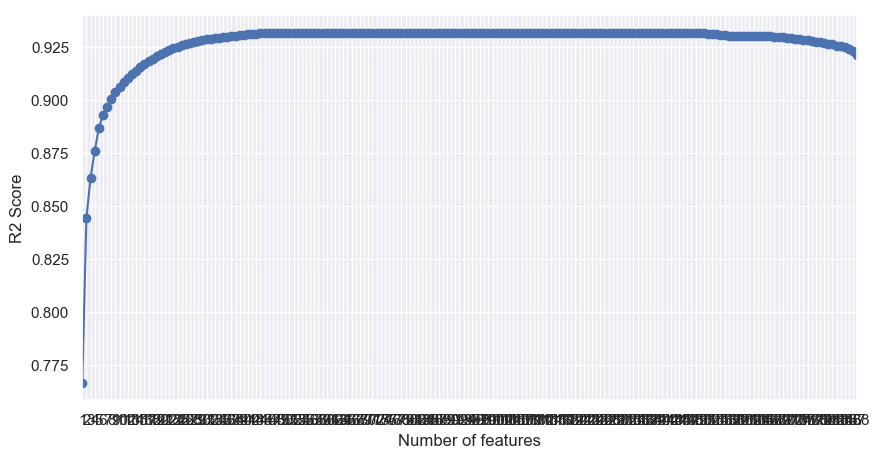

Best Score: 93.18%

Best score with:52.


Best score with 52 features:
['OverallCond', 'MasVnrArea', 'BsmtCond', 'BsmtFinType2', 'CentralAir', 'HalfBath', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'GarageFinish', 'PavedDrive', 'EnclosedPorch', 'YrSold', 'TotalPoints', 'ConstructArea', 'LotAreaMultSlope', 'TotBathrooms', 'MSSubClass_160', 'MSSubClass_20', 'MSSubClass_60', 'LandContour_Lvl', 'LotConfig_CulDSac', 'LotConfig_FR2', 'Neighborhood_BrkSide', 'Neighborhood_Crawfor', 'Neighborhood_Edwards', 'Neighborhood_IDOTRR', 'Neighborhood_MeadowV', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Neighborhood_OldTown', 'Neighborhood_Somerst', 'Neighborhood_StoneBr', 'Condition1_Norm', 'Condition1_RRAe', 'HouseStyle_SFoyer', 'HouseStyle_SLvl', 'RoofMatl_CompShg', 'Exterior1st_WdSdng', 'Exterior2nd_HdBoard', 'Exterior2nd_Plywood', 'Foundation_BrkTil', 'Foundation_PConc', 'Foundation_Slab', 'Heating_GasW', 'GarageType_CarPort', 'MoSold_11', 'MoSold_3', 'MoSold_5', 'SaleConditi

In [99]:
from itertools import combinations
class SBS():
    def __init__(self, estimator, k_features, scoring=r2_score, test_size=0.25, random_state=101):
        self.scoring = scoring
        self.estimator = clone(estimator)
        self.k_features = k_features
        self.test_size = test_size
        self.random_state = random_state

    def fit(self, X, y):
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=self.test_size, random_state=self.random_state)
        dim = X_train.shape[1]
        self.indices_ = list(range(dim))
        self.subsets_ = [self.indices_]
        score = self._calc_score(X_train, y_train, X_test, y_test, self.indices_)
        self.scores_ = [score]
        
        while dim > self.k_features:
            scores = []
            subsets = []
            for p in combinations(self.indices_, r=dim-1):
                score = self._calc_score(X_train, y_train, X_test, y_test, list(p))
                scores.append(score)
                subsets.append(list(p))
                
            best = np.argmax(scores)
            self.indices_ = subsets[best]
            self.subsets_.append(self.indices_)
            dim -= 1
            self.scores_.append(scores[best])
            
        self.k_score_ = self.scores_[-1]
        return self

    def transform(self, X):
        return X.iloc[:, self.indices_]
    
    def _calc_score(self, X_train, y_train, X_test, y_test, indices):
        self.estimator.fit(X_train.iloc[:, indices], y_train)
        y_pred = self.estimator.predict(X_test.iloc[:, indices])
        score = self.scoring(y_test, y_pred)
        return score

score = r2_score
ls = Lasso(alpha = 0.0005, max_iter = 161, selection = 'cyclic', tol = 0.002, random_state = 101)
sbs = SBS(ls, k_features=1, scoring= score)
sbs.fit(df, y_train)

k_feat = [len(k) for k in sbs.subsets_]
fig = plt.figure(figsize=(10,5))
plt.plot(k_feat, sbs.scores_, marker='o')
plt.xlim([1, len(sbs.subsets_)])
plt.xticks(np.arange(1, len(sbs.subsets_)+1))
plt.ylabel('R2 Score')
plt.xlabel('Number of features')
plt.grid(b=1)
plt.show()

print('Best Score: {:2.2%}\n'.format(max(sbs.scores_)))
print('Best score with:{0:2d}.\n'.\
      format(len(list(df.columns[sbs.subsets_[np.argmax(sbs.scores_)]]))))
SBS = list(df.columns[list(sbs.subsets_[max(np.arange(0, len(sbs.scores_))[(sbs.scores_==max(sbs.scores_))])])])
print('\nBest score with {0:2d} features:\n{1:}'.format(len(SBS), SBS))

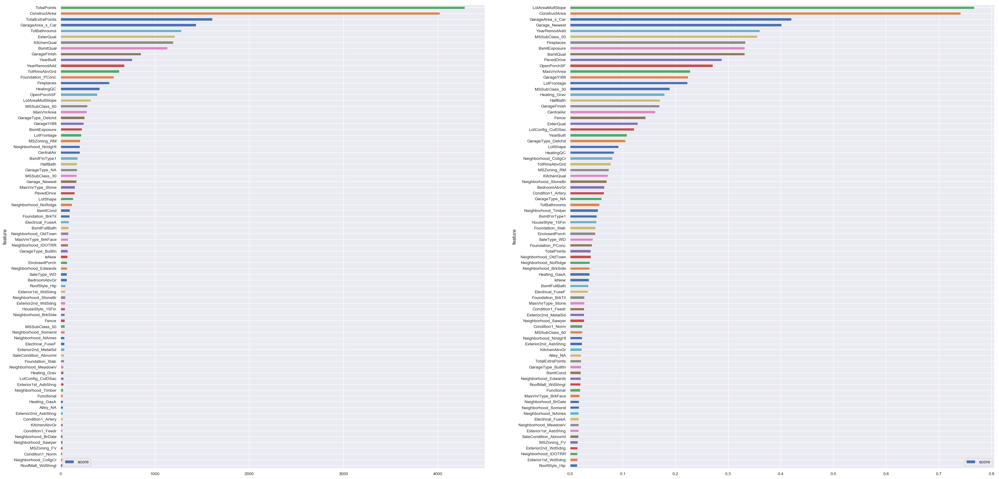

In [100]:
skb = SelectKBest(score_func=f_regression, k=80)
skb.fit(df, y_train)
select_features_kbest = skb.get_support()
kbest_FR = cols[select_features_kbest]
scores = skb.scores_[select_features_kbest]
feature_scores = pd.DataFrame([(item, score) for item, score in zip(kbest_FR, scores)], columns=['feature', 'score'])
fig = plt.figure(figsize=(40,20))
f1 = fig.add_subplot(121)
feature_scores.sort_values(by='score', ascending=True).plot(y = 'score', x = 'feature', kind='barh', 
                                                            ax = f1, fontsize=10, grid=True) 

skb = SelectKBest(score_func=mutual_info_regression, k=80)
skb.fit(df, y_train)
select_features_kbest = skb.get_support()
kbest_MIR = cols[select_features_kbest]
scores = skb.scores_[select_features_kbest]
feature_scores = pd.DataFrame([(item, score) for item, score in zip(kbest_FR, scores)], columns=['feature', 'score'])
f2 = fig.add_subplot(122)
feature_scores.sort_values(by='score', ascending=True).plot(y = 'score', x = 'feature', kind='barh', 
                                                            ax = f2, fontsize=10, grid=True) 
plt.show()

Thresh=0.000, n=188, R2: 50.18% with MSE: 0.0832
Thresh=0.000, n=77, R2: 50.18% with MSE: 0.0832
Thresh=0.001, n=76, R2: 50.49% with MSE: 0.0827
Thresh=0.001, n=75, R2: 50.49% with MSE: 0.0827
Thresh=0.002, n=74, R2: 49.88% with MSE: 0.0837
Thresh=0.002, n=73, R2: 49.88% with MSE: 0.0837
Thresh=0.002, n=72, R2: 50.09% with MSE: 0.0833
Thresh=0.002, n=71, R2: 49.78% with MSE: 0.0839
Thresh=0.002, n=70, R2: 50.78% with MSE: 0.0822
Thresh=0.002, n=69, R2: 50.78% with MSE: 0.0822
Thresh=0.002, n=68, R2: 51.11% with MSE: 0.0816
Thresh=0.002, n=67, R2: 50.52% with MSE: 0.0826
Thresh=0.003, n=66, R2: 50.52% with MSE: 0.0826
Thresh=0.003, n=65, R2: 50.49% with MSE: 0.0827
Thresh=0.003, n=64, R2: 49.78% with MSE: 0.0838
Thresh=0.003, n=63, R2: 50.25% with MSE: 0.0831
Thresh=0.003, n=62, R2: 50.07% with MSE: 0.0834
Thresh=0.003, n=61, R2: 49.71% with MSE: 0.0840
Thresh=0.003, n=60, R2: 51.10% with MSE: 0.0817
Thresh=0.003, n=59, R2: 51.09% with MSE: 0.0817
Thresh=0.003, n=58, R2: 51.25% with MSE

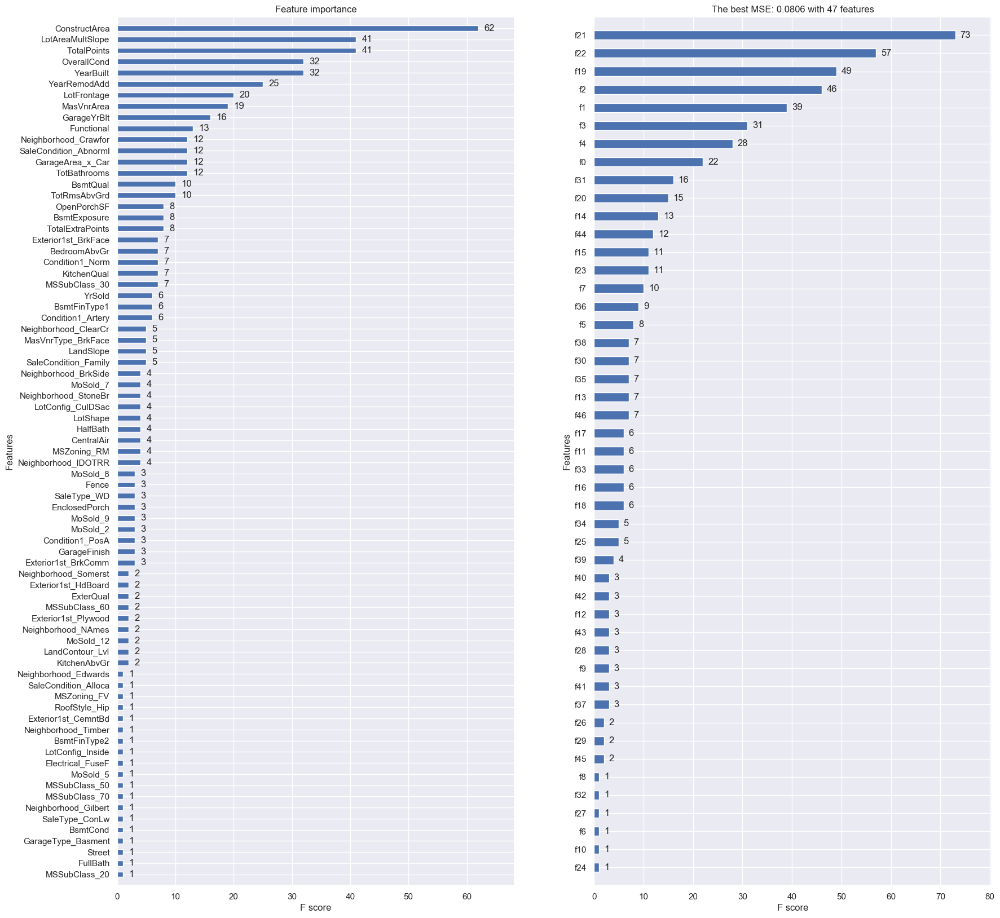

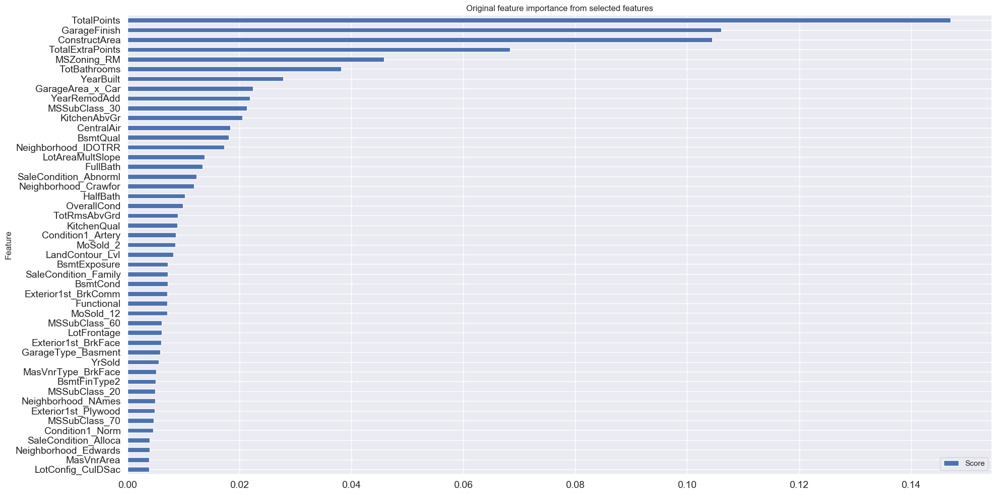

In [101]:
warnings.filterwarnings(action='ignore', category=DeprecationWarning)

# split data into train and test sets
X_train, X_test, y, y_test = train_test_split(df, y_train, test_size=0.30, random_state=101)

# fit model on all training data
#importance_type='gain'
model =  XGBRegressor(base_score=0.5, colsample_bylevel=1, colsample_bytree=1, gamma=0, max_delta_step=0, 
                      random_state=101, min_child_weight=1, missing=None, n_jobs=4,  
                      scale_pos_weight=1, seed=None, silent=True, subsample=1)


model.fit(X_train, y)
fig=plt.figure(figsize=(20,20))
ax = fig.add_subplot(121)
g = plot_importance(model, height=0.5, ax=ax)

# Using each unique importance as a threshold
thresholds = np.sort(np.unique(model.feature_importances_)) 
best = 1e36
colsbest = 31
my_model = model
threshold = 0

for thresh in thresholds:
    # select features using threshold
    selection = SelectFromModel(model, threshold=thresh, prefit=True)
    select_X_train = selection.transform(X_train)
    # train model
    selection_model =  XGBRegressor(base_score=0.5, colsample_bylevel=1, colsample_bytree=1, gamma=0, max_delta_step=0, 
                                    random_state=101, min_child_weight=1, missing=None, n_jobs=4, 
                                    scale_pos_weight=1, seed=None, silent=True, subsample=1)
    selection_model.fit(select_X_train, y)
    # eval model
    select_X_test = selection.transform(X_test)
    y_pred = selection_model.predict(select_X_test)
    predictions = [round(value) for value in y_pred]
    r2 = r2_score(y_test, predictions)
    mse = mean_squared_error(y_test, predictions)
    print("Thresh={:1.3f}, n={:d}, R2: {:2.2%} with MSE: {:.4f}".format(thresh, select_X_train.shape[1], r2, mse))
    if (best >= mse):
        best = mse
        colsbest = select_X_train.shape[1]
        my_model = selection_model
        threshold = thresh
        
ax = fig.add_subplot(122)
g = plot_importance(my_model,height=0.5, ax=ax, 
                    title='The best MSE: {:1.4f} with {:d} features'.\
                    format(best, colsbest))

feature_importances = [(score, feature) for score, feature in zip(model.feature_importances_, cols)]
XGBest = pd.DataFrame(sorted(sorted(feature_importances, reverse=True)[:colsbest]), columns=['Score', 'Feature'])
g = XGBest.plot(x='Feature', kind='barh', figsize=(20,10), fontsize=14, grid= True,
     title='Original feature importance from selected features')
plt.tight_layout(); plt.show()
XGBestCols = XGBest.iloc[:, 1].tolist()

In [102]:
bcols = set(pv_cols).union(set(RFEcv)).union(set(kbest_FR)).union(set(kbest_MIR)).union(set(XGBestCols)).union(set(SBS))
print('Features Selected by Filter Methods:\n')
print("Extra features select by Kbest_FR:", set(kbest_FR).\
     difference(set(pv_cols).union(set(RFEcv)).union(set(kbest_MIR)).union(set(XGBestCols)).union(set(SBS))), '\n')
print("Extra features select by Kbest_MIR:", set(kbest_MIR).\
      difference(set(pv_cols).union(set(RFEcv)).union(set(kbest_FR)).union(set(XGBestCols)).union(set(SBS))), '\n')
print('_'*75,'\nFeatures Selected by Wrappers Methods:\n')
print("Extra features select by pv_cols:", set(pv_cols).\
      difference(set(SBS).union(set(RFEcv)).union(set(kbest_MIR)).union(set(kbest_FR)).union(set(XGBestCols))),'\n')
print("Extra features select by RFEcv:", set(RFEcv).\
      difference(set(pv_cols).union(set(kbest_FR)).union(set(kbest_MIR)).union(set(XGBestCols)).union(set(SBS))), '\n')
print("Extra features select by SBS:", set(SBS).\
      difference(set(pv_cols).union(set(RFEcv)).union(set(kbest_MIR)).union(set(kbest_FR)).union(set(XGBestCols))), '\n')
print('_'*75,'\nFeatures Selected by Embedded Methods:\n')
print("Extra features select by XGBestCols:", set(XGBestCols).\
      difference(set(pv_cols).union(set(RFEcv)).union(set(kbest_MIR)).union(set(kbest_FR)).union(set(SBS))), '\n')
print('_'*75,'\nIntersection Features Selected:')
intersection = set(SBS).intersection(set(kbest_MIR)).intersection(set(RFEcv)).intersection(set(pv_cols)).\
               intersection(set(kbest_FR)).intersection(set(XGBestCols))
print(intersection, '\n')
print('_'*75,'\nUnion All Features Selected:')
print('Total number of features selected:', len(bcols))
print('\n{0:2d} features removed if use the union of selections: {1:}'.\
      format(len(cols.difference(bcols)), cols.difference(bcols)))


Features Selected by Filter Methods:

Extra features select by Kbest_FR: {'Heating_GasA', 'Condition1_Feedr', 'Heating_Grav', 'Alley_NA'} 

Extra features select by Kbest_MIR: {'ExterCond', 'Exterior1st_CemntBd', 'BldgType_Twnhs', 'Exterior2nd_CmentBd'} 

___________________________________________________________________________ 
Features Selected by Wrappers Methods:

Extra features select by pv_cols: {'Exterior2nd_BrkFace', 'MSSubClass_85', 'MoSold_9', 'Neighborhood_Blueste', 'MiscFeature_Pool', 'MSSubClass_190', 'RoofStyle_Shed', 'Condition1_RRAn', 'MSSubClass_120', 'MoSold_1', 'Exterior1st_AsphShn', 'Exterior1st_Stucco', 'Neighborhood_SawyerW', 'MSSubClass_180', 'SaleCondition_AdjLand', 'MoSold_8', 'MiscFeature_Othr', 'Street', 'Exterior2nd_Stone', 'RoofMatl_WdShake', 'Neighborhood_Blmngtn', 'MoSold_6', 'MoSold_4', 'Neighborhood_NPkVill', 'Exterior1st_WdShing', 'MSSubClass_75', 'Condition2_Artery', 'RoofStyle_Mansard', 'HouseStyle_15Unf', 'Neighborhood_Veenker', 'Neighborhood_SWIS

In [103]:
totalCols = list(bcols.union(set(colsP)))
train = all_data.loc[all_data.SalePrice>0 , list(totalCols)].reset_index(drop=True, inplace=False)
y_train = all_data.SalePrice[all_data.SalePrice>0].reset_index(drop=True, inplace=False)
test = all_data.loc[all_data.SalePrice==0 , list(totalCols)].reset_index(drop=True, inplace=False)

In [104]:
class select_fetaures(object): # BaseEstimator, TransformerMixin, 
    def __init__(self, select_cols):
        self.select_cols_ = select_cols
    
    def fit(self, X, Y ):
        print('Recive {0:2d} features...'.format(X.shape[1]))
        return self

    def transform(self, X):
        print('Select {0:2d} features'.format(X.loc[:, self.select_cols_].shape[1]))
        return X.loc[:, self.select_cols_]    

    def fit_transform(self, X, Y):
        self.fit(X, Y)
        df = self.transform(X)
        return df 
        #X.loc[:, self.select_cols_]    

    def __getitem__(self, x):
        return self.X[x], self.Y[x]
        

In [105]:
scale = RobustScaler() 
df = scale.fit_transform(train)

pca = PCA().fit(df) # whiten=True
print('With only 120 features: {:6.4%}'.format(sum(pca.explained_variance_ratio_[:120])),"%\n")

print('After PCA, {:3} features only not explained {:6.4%} of variance ratio from the original {:3}'.format(120,
                                                                                    (sum(pca.explained_variance_ratio_[120:])),
                                                                                    df.shape[1]))
del df,all_data

With only 120 features: 99.8730% %

After PCA, 120 features only not explained 0.1270% of variance ratio from the original 189


In [106]:
def get_results(model, name='NAN', log=False):
    
    rcols = ['Name','Model', 'BestParameters', 'Scorer', 'Index', 'BestScore', 'BestScoreStd', 'MeanScore', 
             'MeanScoreStd', 'Best']
    res = pd.DataFrame(columns=rcols)
    
    results = gs.cv_results_
    modelo = gs.best_estimator_

    scoring = {'MEA': 'neg_mean_absolute_error', 'R2': 'r2', 'RMSE': 'neg_mean_squared_error'}

    for scorer in sorted(scoring):
        best_index = np.nonzero(results['rank_test_%s' % scoring[scorer]] == 1)[0][0]
        if scorer == 'RMSE': 
            best = np.sqrt(-results['mean_test_%s' % scoring[scorer]][best_index])
            best_std = np.sqrt(results['std_test_%s' % scoring[scorer]][best_index])
            scormean = np.sqrt(-results['mean_test_%s' % scoring[scorer]].mean())
            stdmean = np.sqrt(results['std_test_%s' % scoring[scorer]].mean())
            if log:
                best = np.expm1(best)
                best_std = np.expm1(best_std)
                scormean = np.expm1(scormean)
                stdmean = np.expm1(stdmean)
        elif scorer == 'MEA':
            best = (-results['mean_test_%s' % scoring[scorer]][best_index])
            best_std = results['std_test_%s' % scoring[scorer]][best_index]
            scormean =(-results['mean_test_%s' % scoring[scorer]].mean())
            stdmean = results['std_test_%s' % scoring[scorer]].mean()
            if log:
                best = np.expm1(best)
                best_std = np.expm1(best_std)
                scormean = np.expm1(scormean)
                stdmean = np.expm1(stdmean)
        else:
            best = results['mean_test_%s' % scoring[scorer]][best_index]*100
            best_std = results['std_test_%s' % scoring[scorer]][best_index]*100
            scormean = results['mean_test_%s' % scoring[scorer]].mean()*100
            stdmean = results['std_test_%s' % scoring[scorer]].mean()*100
        
        r1 = pd.DataFrame([(name, modelo, gs.best_params_, scorer, best_index, best, best_std, scormean, 
                            stdmean, gs.best_score_)],
                          columns = rcols)
        res = res.append(r1)
        
    if log:
        bestscore = np.expm1(np.sqrt(-gs.best_score_))
    else:
        bestscore = np.sqrt(-gs.best_score_)
        
    print("Best Score: {:.6f}".format(bestscore))
    print('---------------------------------------')
    print('Best Parameters:')
    print(gs.best_params_)
    
    return res

In [107]:
def resilduals_plots(lr, X, Y, log=False):
    y_pred = lr.predict(X)
    residual = pd.DataFrame()
    residual['Predict'] = y_pred
    residual['Residual'] = Y - y_pred
    residual['Predicted'] = np.expm1(residual.Predict)
    residual['StdResidual'] = np.expm1(Y) - residual.Predicted
    residual.StdResidual = residual.StdResidual / residual.StdResidual.std()
    residual['IDX'] = X.index
    
    if log:
        fig = plt.figure(figsize=(20,10))
        ax = fig.add_subplot(121)
        g = sns.regplot(y='Residual', x='Predict', data = residual, order=1, ax = ax) 
        plt.xlabel('Log Predicted Values')
        plt.ylabel('Log Residuals')
        plt.hlines(y=0, xmin=min(Y)-1, xmax=max(Y)+1, lw=2, color='red')
        plt.xlim([min(Y)-1, max(Y)+1])

        ax = fig.add_subplot(122)
        g = sns.regplot(y='StdResidual', x='Predicted', data = residual, order=1, ax = ax) 
        plt.xlabel('Predicted Values')
        plt.ylabel('Standardized Residuals')
        plt.hlines(y=0, xmin=np.expm1(min(Y))-1, xmax=np.expm1(max(Y))+1, lw=2, color='red')
        plt.xlim([np.expm1(min(Y))-1, np.expm1(max(Y))+1])
    else:
        residual.StdResidual = residual.Residual / residual.Residual.std()
        residual.drop(['Residual', 'Predicted'], axis = 1, inplace=True)
        g = sns.regplot(y='StdResidual', x='Predict', data = residual, order=1) 
        plt.xlabel('Predicted Values')
        plt.ylabel('Standardized Residuals')
        plt.hlines(y=0, xmin=min(Y)-1, xmax=max(Y)+1, lw=2, color='red')
        plt.xlim([min(Y)-1, max(Y)+1])

    plt.show()  

    return residual

Recive 189 features...
Select 109 features
Fitting 5 folds for each of 288 candidates, totalling 1440 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  85 tasks      | elapsed:    3.3s
[Parallel(n_jobs=4)]: Done 1285 tasks      | elapsed:   14.3s


Best Score: 0.116418
---------------------------------------
Best Parameters:
{'model__alpha': 0.0007, 'model__max_iter': 5, 'model__selection': 'cyclic', 'model__tol': 0.002, 'pca__n_components': 106, 'pca__whiten': True}


[Parallel(n_jobs=4)]: Done 1440 out of 1440 | elapsed:   15.9s finished


,Scorer,Index,BestScore,BestScoreStd,MeanScore,MeanScoreStd
0,MEA,51,0.080,0.003,0.153,0.006
0,R2,51,92.364,0.223,69.284,0.743
0,RMSE,75,0.116,0.026,0.247,0.065


Select 109 features


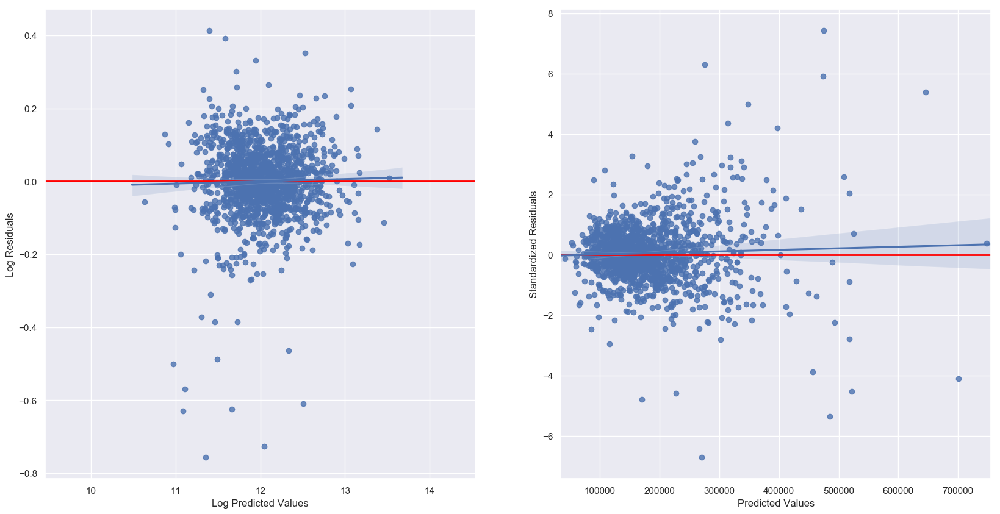

In [108]:
model = Pipeline([
        ('pca', PCA(random_state = 101)),
        ('model', Lasso(random_state = 101))]) 

SEL = list(set(RFEcv).union(set(colsP)))
n_components = [len(SEL)-5, len(SEL)-3, len(SEL)] 
whiten = [False, True]
max_iter = [5] #, 10, 100, 200, 300, 400, 500, 600]  
alpha = [0.0003, 0.0007, 0.0005, 0.05, 0.5, 1.0]
selection = ['random', 'cyclic'] 
tol = [2e-03, 0.003, 0.001, 0.0005]
param_grid =\
            dict(
                  model__alpha = alpha
                  ,model__max_iter = max_iter
                  ,model__selection = selection
                  ,model__tol = tol
                  ,pca__n_components = n_components
                  ,pca__whiten = whiten 
                ) 

gs = GridSearchCV(estimator = model, param_grid = param_grid, refit = 'neg_mean_squared_error' #, iid=False
                   , scoring=list(['neg_mean_squared_error' , 'neg_mean_absolute_error', 'r2']) 
                   ,cv=5, verbose=1, n_jobs=4)

lasso = Pipeline([
        ('sel', select_fetaures(select_cols=SEL)), 
        ('scl', RobustScaler()),
        ('gs', gs)
 ])

lasso.fit(train,y_train)

results = get_results(lasso, 'lasso Lg1', log=True)
display(results.loc[:, 'Scorer' : 'MeanScoreStd'])
r = resilduals_plots(lasso, train, y_train, log=True)

Outliers removed: 18
Recive 189 features...
Select 109 features
Fitting 5 folds for each of 288 candidates, totalling 1440 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 744 tasks      | elapsed:    7.9s


Best Score: 0.094187
---------------------------------------
Best Parameters:
{'model__alpha': 0.0007, 'model__max_iter': 5, 'model__selection': 'random', 'model__tol': 0.002, 'pca__n_components': 106, 'pca__whiten': True}


[Parallel(n_jobs=4)]: Done 1440 out of 1440 | elapsed:   16.0s finished


,Scorer,Index,BestScore,BestScoreStd,MeanScore,MeanScoreStd
0,MEA,75,0.072,0.004,0.146,0.006
0,R2,75,94.577,0.440,70.894,0.611
0,RMSE,51,0.094,0.023,0.232,0.060


Select 109 features


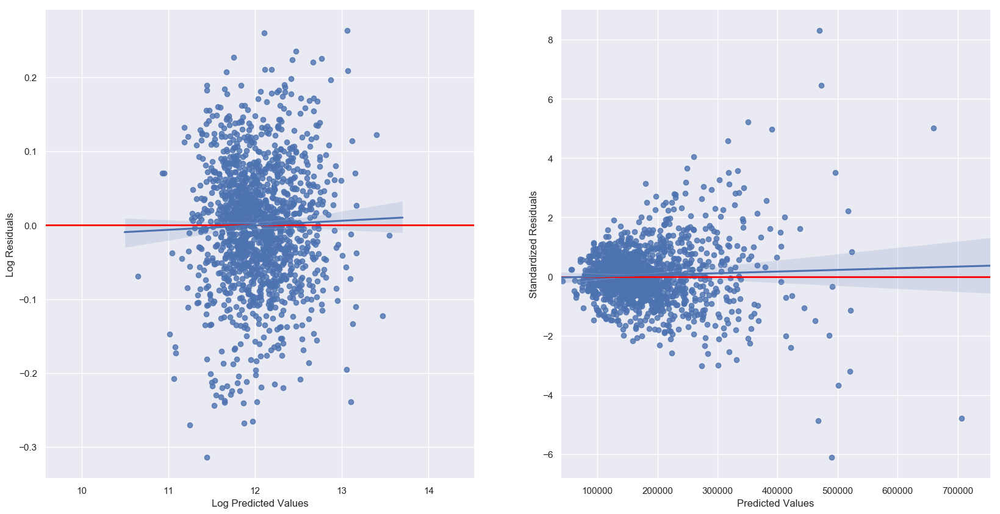

In [109]:
fica =  list(r.IDX[abs(r.Residual)<=0.3])
print('Outliers removed:', r.shape[0]-len(fica))
t = train.iloc[fica, :].reset_index(drop=True, inplace=False)
y_t = y_train.iloc[fica].reset_index(drop=True, inplace=False)

lasso.fit(t, y_t)
results = get_results(lasso, 'lasso Lg2', log=True)
display(results.loc[:, 'Scorer' : 'MeanScoreStd'])
r = resilduals_plots(lasso, t, y_t, log=True)
del  t, y_t, fica

Recive 189 features...
Select 109 features
Fitting 5 folds for each of 288 candidates, totalling 1440 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    2.1s
[Parallel(n_jobs=4)]: Done 744 tasks      | elapsed:    8.7s


Best Score: 21504.641415
---------------------------------------
Best Parameters:
{'model__alpha': 1.0, 'model__max_iter': 5, 'model__selection': 'random', 'model__tol': 0.002, 'pca__n_components': 106, 'pca__whiten': False}


[Parallel(n_jobs=4)]: Done 1440 out of 1440 | elapsed:   16.2s finished


,Scorer,Index,BestScore,BestScoreStd,MeanScore,MeanScoreStd
0,MEA,242,14582.133,854.804,14647.674,858.145
0,R2,242,92.600,0.579,92.537,0.526
0,RMSE,242,21504.641,7071.982,21600.052,7013.087


Select 109 features


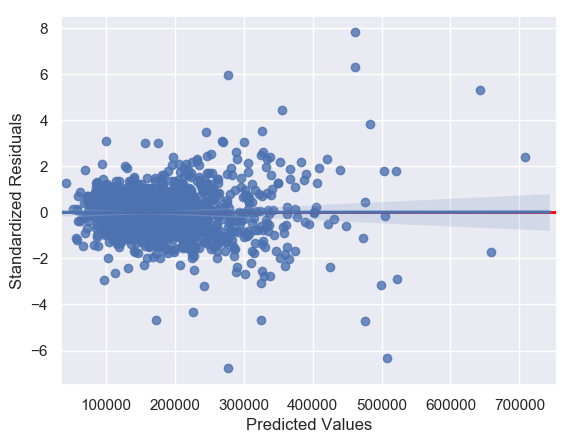

In [110]:
y = np.expm1(y_train)
lasso.fit(train, y)
results = get_results(lasso, 'lasso N1')
display(results.loc[:, 'Scorer' : 'MeanScoreStd'])
r = resilduals_plots(lasso, train, y)

Outliers removed: 23
Recive 189 features...
Select 109 features
Fitting 5 folds for each of 288 candidates, totalling 1440 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done 744 tasks      | elapsed:    6.4s


Best Score: 17597.954460
---------------------------------------
Best Parameters:
{'model__alpha': 1.0, 'model__max_iter': 5, 'model__selection': 'random', 'model__tol': 0.002, 'pca__n_components': 109, 'pca__whiten': False}


[Parallel(n_jobs=4)]: Done 1440 out of 1440 | elapsed:   12.2s finished


,Scorer,Index,BestScore,BestScoreStd,MeanScore,MeanScoreStd
0,MEA,242,12966.314,1004.908,13033.307,980.243
0,R2,242,94.283,0.795,94.212,0.792
0,RMSE,244,17597.954,6826.881,17714.918,6968.298


Select 109 features


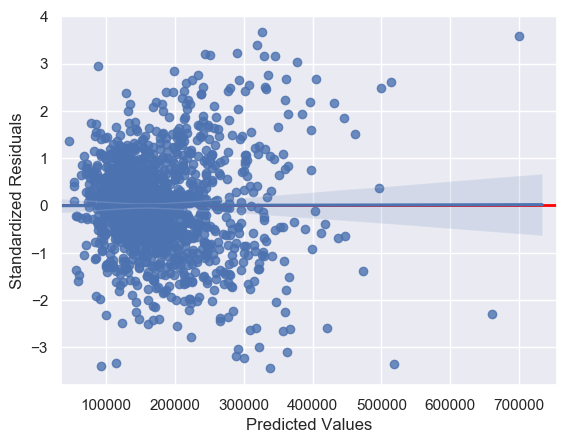

In [111]:
fica =  list(r.IDX[abs(r.StdResidual)<3]) # =2.7
print('Outliers removed:', r.shape[0]-len(fica))
t = train.iloc[fica, :].reset_index(drop=True, inplace=False)
y_l = y_train.iloc[fica].reset_index(drop=True, inplace=False)
y_n = np.expm1(y_l)

lasso.fit(t, y_n)
results = get_results(lasso, 'lasso N2')
display(results.loc[:, 'Scorer' : 'MeanScoreStd'])
r2 = resilduals_plots(lasso, t, y_n)
del fica, r2

Recive 189 features...
Select 109 features
Fitting 5 folds for each of 288 candidates, totalling 1440 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Done 744 tasks      | elapsed:    8.0s


Best Score: 21504.641415
---------------------------------------
Best Parameters:
{'model__alpha': 1.0, 'model__max_iter': 5, 'model__selection': 'random', 'model__tol': 0.002, 'pca__n_components': 106, 'pca__whiten': False}


[Parallel(n_jobs=4)]: Done 1440 out of 1440 | elapsed:   13.7s finished


,Scorer,Index,BestScore,BestScoreStd,MeanScore,MeanScoreStd
0,MEA,242,14582.133,854.804,14647.674,858.145
0,R2,242,92.600,0.579,92.537,0.526
0,RMSE,242,21504.641,7071.982,21600.052,7013.087


Select 109 features


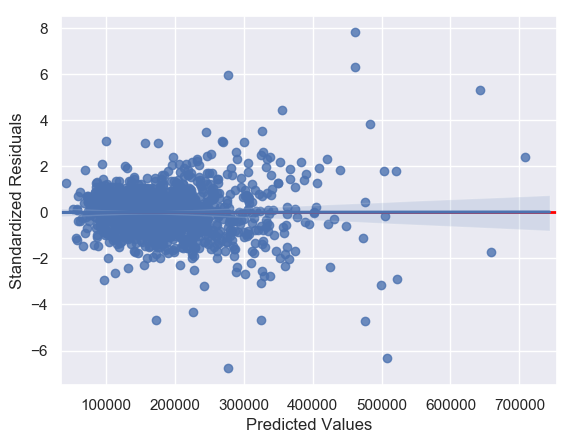

In [112]:
y_log = y_train.copy()
y_train = np.expm1(y_train)

lasso.fit(train, y_train)

results = get_results(lasso, 'lasso', log=False)
display(results.loc[:, 'Scorer' : 'MeanScoreStd'])
r = resilduals_plots(lasso, train, y_train, log=False)

Recive 189 features...
Select 109 features
Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   5 out of   5 | elapsed:    6.8s finished


Best Score: 19959.955641
---------------------------------------
Best Parameters:
{'model__booster': 'gblinear', 'model__learning_rate': 0.01, 'model__max_depth': 3, 'model__n_estimators': 3500, 'model__objective': 'reg:tweedie', 'model__reg_alpha': 1, 'model__reg_lambda': 1, 'pca__n_components': 90, 'pca__whiten': True}
Select 109 features


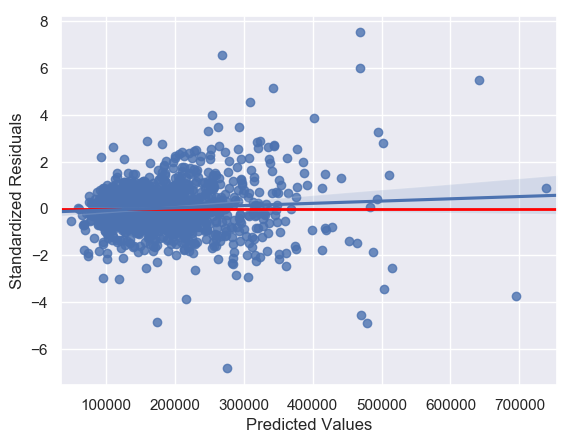

,Scorer,Index,BestScore,BestScoreStd,MeanScore,MeanScoreStd
0,MEA,0,13333.077,762.546,13333.077,762.546
0,R2,0,93.615,0.541,93.615,0.541
0,RMSE,0,19959.956,6373.886,19959.956,6373.886


In [113]:
#XGBRegressor

model = Pipeline([
        ('pca', PCA(random_state = 101)),
        ('model', XGBRegressor(random_state=101, silent=False))])

SEL = list(set(RFEcv).union(set(colsP)))
n_components = [90] # [len(SEL)-18, len(SEL)-19, len(SEL)-20] 
whiten = [True] #, False]
n_est = [3500] # [500, 750, 1000, 2000, 2006] # np.arange(1997, 2009, 3) # 
max_depth = [3] #, 4]
learning_rate = [0.01] #, 0.03] #, 0.1, 0.05
reg_lambda = [1] #0.1, 1e-06, 1e-04, 1e-03, 1e-02, 1e-05, 1, 0.0] 
reg_alpha= [1] # , 0.5, 1, 0.0]
booster = ['gblinear'] #'dart', 'gbtree']  
objective = ['reg:tweedie'] #, 'reg:linear', 'reg:gamma']

param_grid =\
            dict(
                  pca__n_components = n_components,
                  pca__whiten = whiten, 
                  model__n_estimators= n_est
                  ,model__booster = booster
                  ,model__objective = objective
                  ,model__learning_rate = learning_rate
                  ,model__reg_lambda = reg_lambda
                  ,model__reg_alpha = reg_alpha
                  ,model__max_depth = max_depth
                ) 

gs = GridSearchCV(estimator = model, param_grid = param_grid, refit = 'neg_mean_squared_error'
                   , scoring=list(['neg_mean_squared_error' , 'neg_mean_absolute_error', 'r2']) 
                   ,cv=5, verbose=1, n_jobs=4)
 
XGBR = Pipeline([
        ('sel', select_fetaures(select_cols=SEL)),
        ('scl', RobustScaler()),
        ('gs', gs)
 ])

XGBR.fit(train, y_train)

res = get_results(XGBR, 'XGBRegressor', log=False)
resilduals_plots(XGBR, train, y_train, log=False)
results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

Recive 189 features...
Select 77 features
Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   5 out of   5 | elapsed:  1.3min finished


Best Score: 24697.859006
---------------------------------------
Best Parameters:
{'model__alpha': 0.8, 'model__criterion': 'friedman_mse', 'model__learning_rate': 0.05, 'model__loss': 'huber', 'model__max_depth': 3, 'model__max_features': 'auto', 'model__min_samples_leaf': 3, 'model__min_samples_split': 3, 'model__n_estimators': 3000, 'pca__whiten': True}
Select 77 features


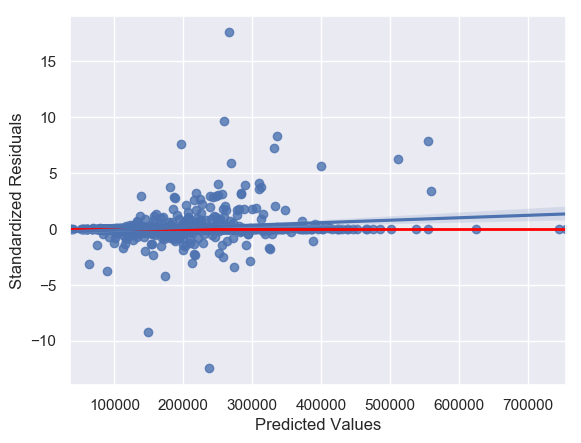

,Scorer,Index,BestScore,BestScoreStd,MeanScore,MeanScoreStd
0,MEA,0,16066.570,608.037,16066.570,608.037
0,R2,0,90.323,0.987,90.323,0.987
0,RMSE,0,24697.859,10933.415,24697.859,10933.415


In [114]:
#Gradient Boosting Regressor

model = Pipeline([
        ('pca', PCA(random_state = 101)),
        ('model', GradientBoostingRegressor(random_state=101))])

SEL = list(set(XGBestCols).union(set(colsP)))
# n_components = [len(SEL)] 
whiten = [True] #, False]
n_est = [3000]
learning_rate = [0.05] #, 0.01, 0.1, 0.005]
loss = ['huber'] #, 'ls', 'lad', 'quantile']
max_features = ['auto'] #, 'sqrt', 'log2']
max_depth = [3] #, 2] # , 5]
min_samples_split = [3] #, 4] 
min_samples_leaf = [3] # , 3, 2 ,4 ]
criterion = ['friedman_mse'] #, 'mse', 'mae']
alpha = [0.8] #, 0.75, 0.9, 0.7] 

param_grid =\
            dict(
                  #pca__n_components = n_components,
                  pca__whiten = whiten, 
                   model__n_estimators= n_est 
                  ,model__learning_rate = learning_rate
                  ,model__loss = loss
                  ,model__criterion = criterion
                  ,model__max_depth = max_depth
                  ,model__alpha = alpha
                  ,model__max_features = max_features
                  ,model__min_samples_split = min_samples_split
                  ,model__min_samples_leaf = min_samples_leaf
                   )

gs = GridSearchCV(estimator = model, param_grid = param_grid, refit = 'neg_mean_squared_error'
                  , scoring=list(['neg_mean_squared_error' , 'neg_mean_absolute_error', 'r2']) 
                  ,cv=5, verbose=1, n_jobs=4)
 
GBR = Pipeline([
        ('sel', select_fetaures(select_cols=SEL)),
        ('scl', RobustScaler()),
        ('gs', gs)
 ])

GBR.fit(train, y_train)
res = get_results(GBR, 'GBR' , log=False)
resilduals_plots(GBR, train, y_train, log=False)
results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

Recive 189 features...
Select 109 features
Fitting 5 folds for each of 3 candidates, totalling 15 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   8 out of  15 | elapsed:    0.2s remaining:    0.2s
[Parallel(n_jobs=4)]: Done  15 out of  15 | elapsed:    0.3s finished


Best Score: 21395.037433
---------------------------------------
Best Parameters:
{'model__alpha': 1e-05, 'model__l1_ratio': 3e-05, 'model__max_iter': 5, 'model__selection': 'cyclic', 'pca__n_components': 109, 'pca__whiten': False}
Select 109 features


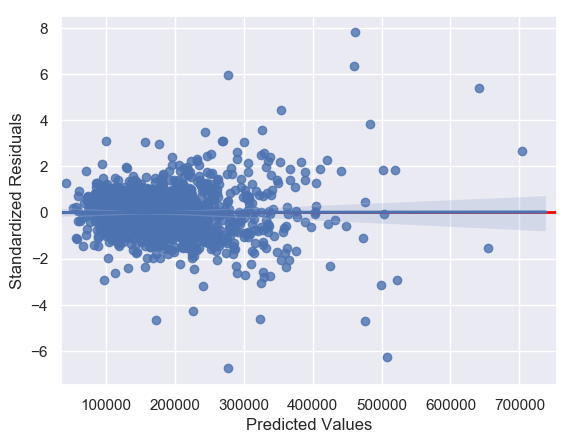

,Scorer,Index,BestScore,BestScoreStd,MeanScore,MeanScoreStd
0,MEA,2,14545.115,855.166,14550.063,858.516
0,R2,2,92.673,0.628,92.669,0.633
0,RMSE,2,21395.037,7174.726,21400.305,7196.705


In [115]:
#Elastic Net

model = Pipeline([
        ('pca', PCA(random_state = 101)),
        ('model', ElasticNet(random_state=101))])

SEL = list(set(RFEcv).union(set(colsP)))
n_components = [len(SEL)-5, len(SEL)-3, len(SEL)] 
whiten = [False] #, True]
max_iter = [5] #, 100] 
alpha = [1e-05] #, 0.001, 0.01, 0.003, 0.00001] 
l1_ratio =  [0.00003] 
selection = ['cyclic'] #, 'random', 'cyclic']

param_grid =\
            dict(
                  model__max_iter= max_iter
                  ,pca__n_components = n_components
                  ,pca__whiten = whiten 
                  ,model__alpha = alpha
                  ,model__l1_ratio = l1_ratio
                  ,model__selection = selection
               ) 

gs = GridSearchCV(estimator = model, param_grid = param_grid, refit = 'neg_mean_squared_error'
                   , scoring=list(['neg_mean_squared_error' , 'neg_mean_absolute_error', 'r2']) 
                   ,cv=5, verbose=1, n_jobs=4)
 
ELA = Pipeline([
        ('sel', select_fetaures(select_cols=SEL)),
        ('scl', RobustScaler()),
        ('gs', gs)
 ])

ELA.fit(train, y_train)

res = get_results(ELA, 'ELA', log=False)
resilduals_plots(ELA, train, y_train, log=False)
results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

Recive 189 features...
Select 109 features
Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   5 out of   5 | elapsed:    0.1s finished


Best Score: 21390.978673
---------------------------------------
Best Parameters:
{'model__alpha_1': 1e-06, 'model__alpha_2': 0.1, 'model__lambda_1': 0.001, 'model__lambda_2': 0.01, 'model__n_iter': 36, 'pca__n_components': 100, 'pca__whiten': True}
Select 109 features


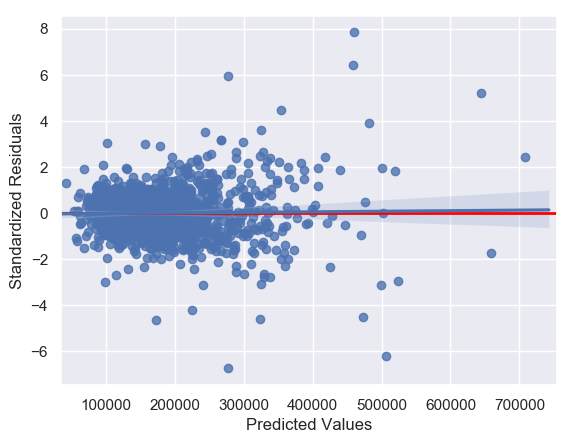

,Scorer,Index,BestScore,BestScoreStd,MeanScore,MeanScoreStd
0,MEA,0,14541.231,843.233,14541.231,843.233
0,R2,0,92.667,0.668,92.667,0.668
0,RMSE,0,21390.979,6975.660,21390.979,6975.660


In [116]:
#Bayesian Ridge Regression

model = Pipeline([
        ('pca', PCA(random_state = 101)),
        ('model', BayesianRidge())]) #compute_score=False, fit_intercept=True, normalize=False

SEL = list(set(RFEcv).union(set(colsP)))
n_components = [len(SEL)-9] #, len(SEL)-8, len(SEL)-7] 
whiten = [True] # , False]
n_iter=  [36] # np.arange(36, 45) # [40, 35, 45, 70, 100, 200, 300, 500, 700, 1000] #  
alpha_1 = [1e-06] #0.1, 1e-04, 1e-03, 1e-02, 1e-05]
alpha_2 = [0.1] # 1e-06 , , 1e-02, 1e-04, 1e-03]
lambda_1 = [0.001] # 0.1, 1e-06, 1e-04, 1e-02, 1e-05] 
lambda_2 = [0.01] # 0.1, 1e-06, 1e-04, 1e-03, 1e-05]

param_grid =\
            dict(
                   model__n_iter = n_iter
                  ,model__alpha_1 = alpha_1
                  ,model__alpha_2 = alpha_2
                  ,model__lambda_1 = lambda_1
                  ,model__lambda_2 = lambda_2
                  ,pca__n_components = n_components
                  ,pca__whiten = whiten 
              ) 

gs = GridSearchCV(estimator = model, param_grid = param_grid, refit = 'neg_mean_squared_error'
                   , scoring=list(['neg_mean_squared_error' , 'neg_mean_absolute_error', 'r2']) 
                   ,cv=5, verbose=1, n_jobs=4)
 
BayR = Pipeline([
        ('sel', select_fetaures(select_cols=SEL)),
        ('scl', RobustScaler()),
        ('gs', gs)
 ])

BayR.fit(train, y_train)
res = get_results(BayR, 'BayR', log=False)
resilduals_plots(BayR, train, y_train, log=False)
results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

Recive 189 features...
Select 109 features
Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  30 out of  30 | elapsed:    0.5s finished


Best Score: 21396.015658
---------------------------------------
Best Parameters:
{'pca__n_components': 100, 'pca__whiten': True}
Select 109 features


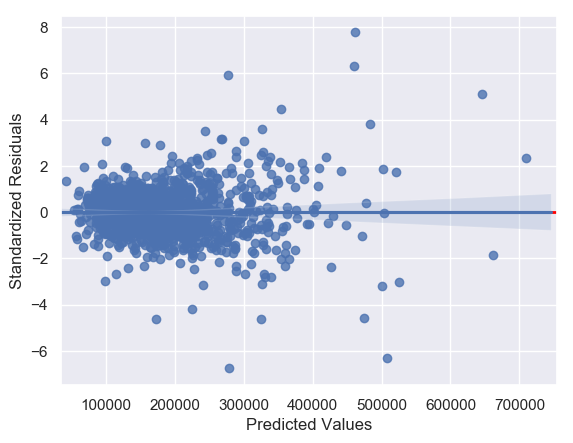

,Scorer,Index,BestScore,BestScoreStd,MeanScore,MeanScoreStd
0,MEA,4,14565.345,858.002,14609.099,854.989
0,R2,5,92.663,0.691,92.634,0.674
0,RMSE,4,21396.016,7012.141,21445.358,7161.375


In [117]:
#Linear Regression

model = Pipeline([
        ('pca', PCA(random_state = 101)),
        ('model', LinearRegression())])

SEL = list(set(RFEcv).union(set(colsP)))
n_components = [len(SEL)-10, len(SEL)-11, len(SEL)-9] 
whiten = [True, False]

param_grid =\
            dict(
                   pca__n_components = n_components,
                   pca__whiten = whiten
               ) 

gs = GridSearchCV(estimator = model, param_grid = param_grid, refit = 'neg_mean_squared_error'
                   , scoring=list(['neg_mean_squared_error' , 'neg_mean_absolute_error', 'r2']) 
                   ,cv=5, verbose=1, n_jobs=4)
 
LR = Pipeline([
        ('sel', select_fetaures(select_cols=SEL)),
        ('scl', RobustScaler()),
        ('gs', gs)
 ])

LR.fit(train, y_train)

res = get_results(LR, 'LR', log=False)
resilduals_plots(LR, train, y_train, log=False)
results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

In [ ]:
#Orthogonal Matching Pursuit model (OMP)

model = Pipeline([
        ('pca', PCA(random_state = 101)),
        ('model', OrthogonalMatchingPursuit())])

SEL = list(set(RFEcv).union(set(colsP)))
n_components = [100] # [len(SEL)-11, len(SEL)-10, len(SEL)-9] 
whiten = [False]
tol = [5e-05] # [None, 0.00005, 0.0001, 0.00000, 0.002]

param_grid =\
            dict(
                   model__tol = tol
                   ,model__n_nonzero_coefs = [2] # range(2, 6) # [10, 20, 30, 40, 50, 60, 70, 80, 90, None] # 
                   ,pca__n_components = n_components
                   ,pca__whiten = whiten
                   ) 

gs = GridSearchCV(estimator = model, param_grid = param_grid, refit = 'neg_mean_squared_error'
                   , scoring=list(['neg_mean_squared_error' , 'neg_mean_absolute_error', 'r2']) 
                   ,cv=5, verbose=1, n_jobs=4)
 
ORT = Pipeline([
        ('sel', select_fetaures(select_cols=SEL)),
        ('scl', RobustScaler()),
        ('gs', gs)
 ])

ORT.fit(train, y_train)
res = get_results(ORT, 'ORT', log=False)
resilduals_plots(ORT, train, y_train, log=False)
results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

Recive 189 features...
Select 109 features
Fitting 5 folds for each of 2 candidates, totalling 10 fits


[Parallel(n_jobs=3)]: Using backend LokyBackend with 3 concurrent workers.
[Parallel(n_jobs=3)]: Done  10 out of  10 | elapsed:    1.8s finished


Best Score: 21318.914077
---------------------------------------
Best Parameters:
{'model__alpha': 0.0001, 'model__epsilon': 1.005, 'model__max_iter': 2000, 'model__tol': 0.1, 'pca__n_components': 100, 'pca__whiten': True}
Select 109 features


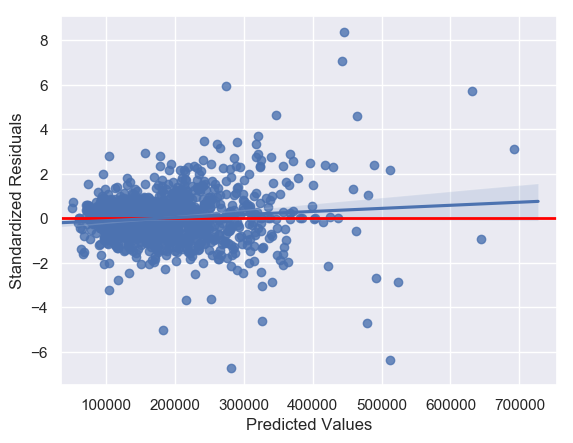

,Scorer,Index,BestScore,BestScoreStd,MeanScore,MeanScoreStd
0,MEA,0,14090.253,611.593,14090.253,611.593
0,R2,0,92.724,0.684,92.724,0.684
0,RMSE,0,21318.914,7499.656,21318.914,7499.656


In [118]:
#Robust Regressor

model = Pipeline([
        ('pca', PCA(random_state = 101)),
        ('model', HuberRegressor())])

SEL = list(set(RFEcv).union(set(colsP)))
n_components = [len(SEL)-9] #, len(SEL)-8, len(SEL)-7, len(SEL)-1] 
whiten = [True] #, False]
max_iter = [2000] 
alpha = [0.0001] #, 5e-05, 0.01, 0.00005, 0.0005, 0.5, 0.001] 
epsilon = [1.005] #, 1.05, 1.01, 1.001] 
tol = [1e-01, 1e-02] #, 2e-01, 3e-01, 4e-01, 5e-01, 6e-01] 

param_grid =\
            dict(
                  model__max_iter= max_iter
                  ,pca__n_components = n_components
                  ,pca__whiten = whiten 
                  ,model__alpha = alpha
                  ,model__epsilon = epsilon
                  ,model__tol = tol
               ) 

gs = GridSearchCV(estimator = model, param_grid = param_grid, refit = 'neg_mean_squared_error'
                   , scoring=list(['neg_mean_squared_error' , 'neg_mean_absolute_error', 'r2']) 
                   ,cv=5, verbose=1, n_jobs=3)
 
Hub = Pipeline([
        ('sel', select_fetaures(select_cols=SEL)),
        ('scl', RobustScaler()),
        ('gs', gs)
 ])

Hub.fit(train, y_train)

res = get_results(Hub, 'Hub', log=False)
resilduals_plots(Hub, train, y_train, log=False)
results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

Recive 189 features...
Select 109 features
Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  20 out of  20 | elapsed:    0.6s finished


Best Score: 21572.459263
---------------------------------------
Best Parameters:
{'model__C': 0.001, 'model__epsilon': 1e-05, 'model__loss': 'squared_epsilon_insensitive', 'model__max_iter': 1000, 'model__tol': 0.001, 'pca__n_components': 100, 'pca__whiten': True}
Select 109 features


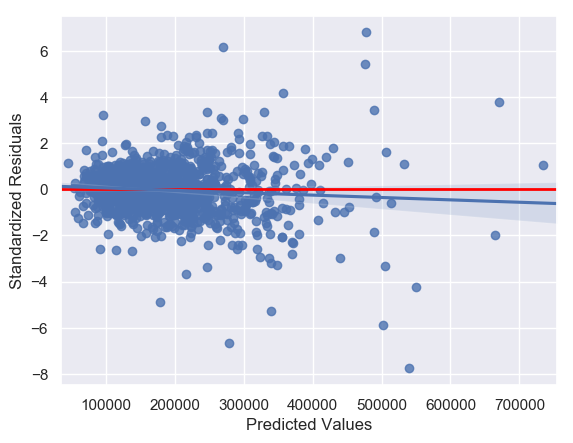

,Scorer,Index,BestScore,BestScoreStd,MeanScore,MeanScoreStd
0,MEA,0,14851.591,937.319,14894.671,936.207
0,R2,0,92.554,0.785,92.460,0.684
0,RMSE,0,21572.459,7827.766,21715.627,7691.822


In [119]:
#Passive Aggressive Regressor

model = Pipeline([
        ('pca', PCA(random_state = 101)),
        ('model', PassiveAggressiveRegressor(random_state = 101))])

SEL = list(set(RFEcv).union(set(colsP)))
n_components = [len(SEL)-9, len(SEL)-8, len(SEL)-7, len(SEL)-1] 
whiten = [True] #, False]
loss = ['squared_epsilon_insensitive'] #, 'epsilon_insensitive']
C = [0.001] #, 0.005, 0.003]
max_iter = [1000] 
epsilon = [0.00001] # , 0.00005
tol = [1e-03] #, 1e-05,1e-02, 1e-01, 1e-04, 1e-06]

param_grid =\
            dict(
                  pca__n_components = n_components,
                  pca__whiten = whiten, 
                  model__loss = loss
                  ,model__epsilon = epsilon
                  ,model__C = C
                  ,model__tol = tol
                  ,model__max_iter = max_iter
               ) 
 
gs = GridSearchCV(estimator = model, param_grid = param_grid, refit = 'neg_mean_squared_error'
                   , scoring=list(['neg_mean_squared_error' , 'neg_mean_absolute_error', 'r2']) 
                   ,cv=5, verbose=1, n_jobs=4)
 
PassR = Pipeline([
        ('sel', select_fetaures(select_cols=SEL)),
        ('scl', RobustScaler()),
        ('gs', gs)
 ])

PassR.fit(train, y_train)
res = get_results(PassR, 'PassR', log=False)
resilduals_plots(PassR, train, y_train, log=False)
results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

Recive 189 features...
Select 109 features
Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  20 out of  20 | elapsed:    3.2s finished


Best Score: 21394.506110
---------------------------------------
Best Parameters:
{'model__alpha': 0.001, 'model__epsilon': 0.1, 'model__eta0': 0.01, 'model__l1_ratio': 0.7, 'model__learning_rate': 'invscaling', 'model__loss': 'squared_loss', 'model__penalty': 'l2', 'model__power_t': 0.5, 'model__tol': 0.001, 'pca__n_components': 100, 'pca__whiten': True}
Select 109 features


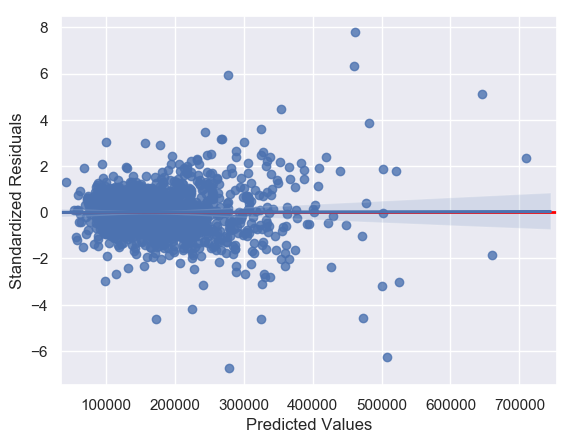

,Scorer,Index,BestScore,BestScoreStd,MeanScore,MeanScoreStd
0,MEA,0,14560.690,855.520,14619.801,872.572
0,R2,0,92.664,0.687,92.580,0.599
0,RMSE,0,21394.506,7005.308,21527.027,6970.215


In [120]:
#SGD Regressor

model = Pipeline([
        ('pca', PCA(random_state = 101)),
        ('model', SGDRegressor(random_state = 101))])

SEL = list(set(RFEcv).union(set(colsP)))
n_components = [len(SEL)-9, len(SEL)-8, len(SEL)-7, len(SEL)-1] 
whiten = [True] #, False]
loss = ['squared_loss'] #, 'huber', 'squared_epsilon_insensitive', 'epsilon_insensitive']
penalty = ['l2'] #, 'elasticnet', 'l1']
l1_ratio = [0.7] #, 0.8] #[0.2, 0.5, 0.03]
learning_rate = ['invscaling'] #, 'constant', 'optimal']
alpha = [0.001] # [1e-01, 1e-2, 1e-03, 1e-4, 1e-05]
epsilon =  [1e-01] #, 1e-2, 1e-03, 1e-4, 1e-05]
tol = [0.001] #, 0.003] 
eta0 = [0.01] #, 1e-1, 1e-03, 1e-4, 1e-05] 
power_t = [0.5]
 
param_grid =\
            dict(
                   pca__n_components = n_components
                   ,pca__whiten = whiten, 
                   model__penalty = penalty
                   ,model__l1_ratio = l1_ratio
                   ,model__loss = loss
                   ,model__alpha = alpha
                   ,model__epsilon = epsilon
                   ,model__tol = tol
                   ,model__eta0 = eta0
                   ,model__power_t = power_t
                   ,model__learning_rate = learning_rate
               ) 

gs = GridSearchCV(estimator = model, param_grid = param_grid, refit = 'neg_mean_squared_error'
                   , scoring=list(['neg_mean_squared_error' , 'neg_mean_absolute_error', 'r2']) 
                   ,cv=5, verbose=1, n_jobs=4)
 
SGDR = Pipeline([
        ('sel', select_fetaures(select_cols=SEL)),
        ('scl', RobustScaler()),
        ('gs', gs)
 ])

SGDR.fit(train, y_train)
res = get_results(SGDR, 'SGDR', log=False)
resilduals_plots(SGDR, train, y_train, log=False)
results = pd.concat([results, res], axis=0)
res.loc[:, 'Scorer' : 'MeanScoreStd']

In [121]:
results.loc[results.Scorer=='RMSE', ['Name','BestScore', 'BestScoreStd']].sort_values(by='BestScore', ascending=True)

,Name,BestScore,BestScoreStd
0,XGBRegressor,19959.956,6373.886
0,Hub,21318.914,7499.656
0,BayR,21390.979,6975.660
0,SGDR,21394.506,7005.308
0,ELA,21395.037,7174.726
0,LR,21396.016,7012.141
0,lasso,21504.641,7071.982
0,PassR,21572.459,7827.766
0,GBR,24697.859,10933.415


In [122]:
class AveragingModels(BaseEstimator, RegressorMixin, TransformerMixin):
    def __init__(self, models):
        self.models = models
        
    # we define clones of the original models to fit the data in
    def fit(self, X, y):
        self.models_ = [clone(x) for x in self.models]
        
        # Train cloned base models
        for model in self.models_:
            model.fit(X, y)

        return self
    
    #Now we do the predictions for cloned models and average them
    def predict(self, X):
        predictions = np.column_stack([model.predict(X) for model in self.models_])
        return np.mean(predictions, axis=1)   

#defining RMSLE evaluation function
def RMSLE (y, y_pred):
    return (np.sqrt(mean_squared_error(y, y_pred)))

# Averaged base models score
averaged_models = AveragingModels(models = (XGBR, BayR, PassR)) # Hub, ELA,  lasso, ARDR, LGBM, GBR

averaged_models.fit(train, y_train) 
stacked_train_pred = averaged_models.predict(train)

stacked_pred = (averaged_models.predict(test))
rmsle = RMSLE(y_train,stacked_train_pred)

print('RMSLE score on the train data: {:.4f}'.format(rmsle))

print('Accuracy score: {:.6%}'.format(averaged_models.score(train, y_train)))

Recive 189 features...
Select 109 features
Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   5 out of   5 | elapsed:    7.3s finished


Recive 189 features...
Select 109 features
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Recive 189 features...
Select 109 features
Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   5 out of   5 | elapsed:    0.1s finished
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.


Select 109 features
Select 109 features
Select 109 features
Select 109 features
Select 109 features
Select 109 features
RMSLE score on the train data: 18959.2089
Select 109 features
Select 109 features
Select 109 features
Accuracy score: 94.299260%


[Parallel(n_jobs=4)]: Done  20 out of  20 | elapsed:    0.5s finished


In [123]:
# Preper Submission File
ensemble = stacked_pred *1
submit = pd.DataFrame()
submit['id'] = test_ID
submit['SalePrice'] = ensemble

submit.to_csv('regression_submission.csv', index = False)
submit.head()

,id,SalePrice
0,1461,121585.993
1,1462,161304.601
2,1463,182113.115
3,1464,199176.532
4,1465,198502.193
